Multi Classification problem (Credit Score classification)

Exploratory Data Analysis
Data Preprocessing
Feature Engineering

Prediction algorithms:
    Fully connected neural network (Pytorch & Optuna Libraries).
    Random forest.
    K-nn.
    Histogram-based Gradient Boosting Classification Tree.

In [111]:
import pandas as pd
import numpy as np
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch
from torch import nn
from sklearn.preprocessing import PowerTransformer
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,HistGradientBoostingClassifier,GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier
from imblearn.over_sampling import ADASYN,RandomOverSampler
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay
%matplotlib inline

In [2]:
pd.set_option('display.max_columns',35)
train_path = r'train.csv'
test_path = r'test.csv'
train_df = pd.read_csv(train_path, low_memory=False)
test_df = pd.read_csv(test_path)

In [4]:
test_df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x160a,CUS_0xd40,September,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,2022.0,Good,809.98,35.030402,22 Years and 9 Months,No,49.574949,236.64268203272135,Low_spent_Small_value_payments,186.26670208571772
1,0x160b,CUS_0xd40,October,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,9,13.27,4.0,Good,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380264657146,High_spent_Medium_value_payments,361.44400385378196
2,0x160c,CUS_0xd40,November,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,4,12.27,4.0,Good,809.98,33.811894,NaN,No,49.574949,148.23393788500925,Low_spent_Medium_value_payments,264.67544623342997
3,0x160d,CUS_0xd40,December,Aaron Maashoh,24_,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",4,5,11.27,4.0,Good,809.98,32.430559,23 Years and 0 Months,No,49.574949,39.08251089460281,High_spent_Medium_value_payments,343.82687322383634
4,0x1616,CUS_0x21b1,September,Rick Rothackerj,28,004-07-5839,_______,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,1,5.42,5.0,Good,605.03,25.926822,27 Years and 3 Months,No,18.816215,39.684018417945296,High_spent_Large_value_payments,485.2984336755923


In [4]:
train_df.shape

(100000, 28)

In [5]:
train_df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


Data have invalid values, e.g. "_" in the Changed Credit Limit feature, and "-" in the Age column, both in row index 2.

Dropping irrelevant columns:
ID, Customer_ID, Name, and SSN are irrelevant for the prediction model, But I will keep Customer_ID (a feature that didn't suffer from missing values) that may be used as an indicator for filling missing\invalid values.

In [6]:
train_df.drop(['ID','Name','SSN'],axis=1,inplace=True)

Before exploring those mix type columns and fixing that issue, let's look at the Null ratio per column,
why? for example if the feature has 90% missing value and there isn't technique to fill the missing values-> stay with 10K instances-> It's reasonable That the feature will be irrelevant, but not for sure, e.g. can use the feature as sub-model.

Monthly_Inhand_Salary      0.15002
Type_of_Loan               0.11408
Num_of_Delayed_Payment     0.07002
Num_Credit_Inquiries       0.01965
Credit_History_Age         0.09030
Amount_invested_monthly    0.04479
Monthly_Balance            0.01200
dtype: float64


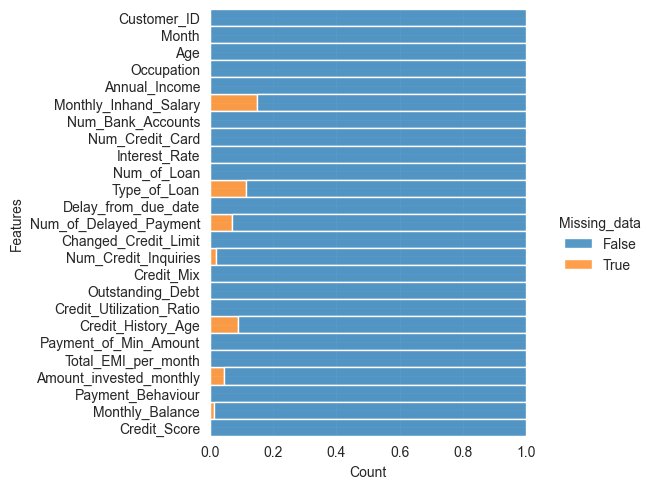

In [7]:
def na_ratio_plot(df=train_df):

    sns.displot(df.isna().melt(value_name='Missing_data',var_name='Features'),y='Features',hue='Missing_data',multiple='fill',aspect=9/8)

print(train_df.isna().mean()[train_df.isna().mean()>0])
na_ratio_plot()

The maximum Na Ratio per column is ~0.15-> not too high. Fill null is needed.

Let's see if the target labels ratios are balanced.

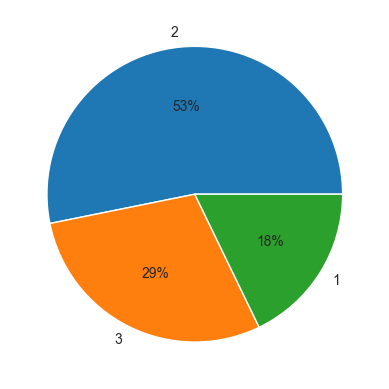

In [20]:
def target_ratio(df=train_df,target='Credit_Score'):

    if not target:
        plt.pie(df.value_counts(),labels=df.value_counts().index,autopct='%.0f%%')

    else:
        plt.pie(df[target].value_counts(),labels=df[target].value_counts().index,autopct='%.0f%%')

target_ratio()

I will refer to that for each prediction model before training.



D-type per column.

In [9]:
train_df.dtypes

Customer_ID                  object
Month                        object
Age                          object
Occupation                   object
Annual_Income                object
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                  object
Type_of_Loan                 object
Delay_from_due_date           int64
Num_of_Delayed_Payment       object
Changed_Credit_Limit         object
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt             object
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly      object
Payment_Behaviour            object
Monthly_Balance              object
Credit_Score                 object
dtype: object

Describe features:

-Interest_Rate:Represents the interest rate on credit card.
-Num_of_Loan: Represents the number of loans taken from the bank.
-Dealy_from_due_date: Represents the average number of days delayed from the payment date.
-Num_of_Delayed_Payment: Represents the average
  number of payments delayed by a person.
-Changed_Credit_Limit: Represents the percentage
  change in credit card limit.
-Num_Credit_Inquiries: Represents the number of credit card inquiries.
-Credit_Mix: Represents the classification of the mix of credits.
-Outstanding_Debt :Represents the remaining debt to be paid (in USD).
-Credit_Utilization_Ratio: Represents the utilization ratio of credit card.
-Credit_History_Age: Represents the age of credit history of the person.
-Payment_of_Min_Amount: Represents whether only the minimum amount was paid by the person.


Drop duplicated rows (if having...).

In [10]:
train_df.drop_duplicates(inplace=True)

Removing invalid characters from mix-type columns that need to be numeric values with help of REGEX (Regular Expression) and converting the d-type of the column.

In [11]:
mix_type_num_col = ['Age', 'Annual_Income', 'Num_of_Loan','Num_of_Delayed_Payment','Changed_Credit_Limit','Outstanding_Debt', 'Amount_invested_monthly', 'Monthly_Balance']
def set_numeric_columns(features,df=None):

    df[features]=df[features].apply(lambda x: x.replace('_','',regex=True) )
    df[features]=df[features].apply(lambda x: x.str.strip())
    df[features]=df[features].apply(lambda x: x.replace('',np.nan))
# Convert numeric columns dtypes.
    df[features[1:]]=df[features[1:]].astype('float32')
    df[features[0]]=df[features[0]].astype('int32')

set_numeric_columns(mix_type_num_col,df=train_df)

Checking d-type per column and missing values after executing the set_numeric_columns function

Age                          int32
Annual_Income              float32
Num_of_Loan                float32
Num_of_Delayed_Payment     float32
Changed_Credit_Limit       float32
Outstanding_Debt           float32
Amount_invested_monthly    float32
Monthly_Balance            float32
dtype: object


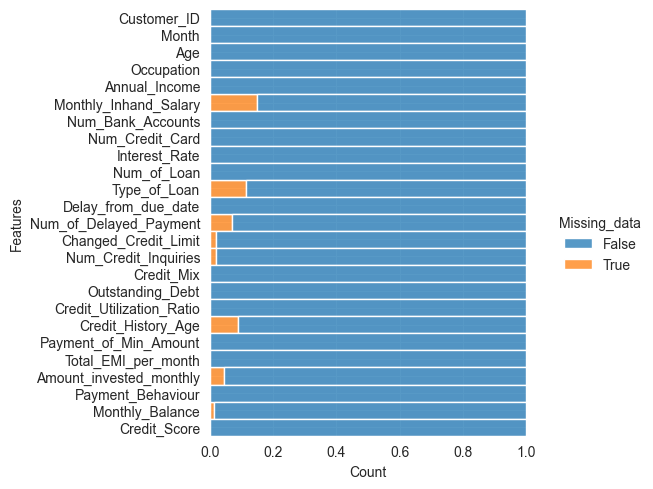

In [12]:
print(train_df[mix_type_num_col].dtypes)
na_ratio_plot(df=train_df)

Describing the data frame for exploring the Distribution and invalid values.

In [13]:
train_df.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,1.000000e+05,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,92998.000000,97909.000000,98035.000000,100000.000000,100000.000000,100000.000000,95521.000000,9.880000e+04
mean,110.649700,1.764157e+05,4194.170850,17.091280,22.47443,72.466040,3.009960,21.068780,30.923342,10.389025,27.754251,1426.220337,32.285173,1403.118217,637.413025,-3.036437e+22
std,686.244717,1.429618e+06,3183.686167,117.404834,129.05741,466.422621,62.647877,14.860104,226.031891,6.789496,193.177339,1155.129028,5.116875,8306.041270,2043.319336,inf
min,-500.000000,7.005930e+03,303.645417,-1.000000,0.00000,1.000000,-100.000000,-5.000000,-3.000000,-6.490000,0.000000,0.230000,20.000000,0.000000,0.000000,-3.333333e+26
25%,24.000000,1.945750e+04,1625.568229,3.000000,4.00000,8.000000,1.000000,10.000000,9.000000,5.320000,3.000000,566.072510,28.052567,30.306660,74.534004,2.700922e+02
50%,33.000000,3.757861e+04,3093.745000,6.000000,5.00000,13.000000,3.000000,18.000000,14.000000,9.400000,6.000000,1166.154968,32.305784,69.249473,135.925674,3.367192e+02
75%,42.000000,7.279092e+04,5957.448333,7.000000,7.00000,20.000000,5.000000,28.000000,18.000000,14.870000,9.000000,1945.962555,36.496663,161.224249,265.731720,4.702202e+02
max,8698.000000,2.419806e+07,15204.633333,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,36.970001,2597.000000,4998.069824,50.000000,82331.000000,10000.000000,1.602041e+03


I will replace values if needed after explored each column values, I just write the replace methods per column.
Suspect values in columns:
Age -> max 8698 replace method: back\forward per customer.
Annual_Income-> check if the outlier values are logical.
Monthly_Inhand_Salary->check if the outlier values are logical.
Num_Bank_Accounts-> max 1798, min -1 replace method: back\forward per customer.
Num_Credit_Card-> max 1499 replace method backward\forward per customer.
Interest_Rate-> max 5797 replace method: mean per customer.
Num_of_Loan-> max 1496 replace method: per customer backward fill, if not having value-> forward fill.
Delay_from_due_date-> min -5.
Num_of_Delayed_Payment-> max 4397 replace method: mean per customer.
Num_Credit_Inquiries-> max 2597 replace method: mean per customer.
Outstanding_Debt->check if the outlier values are logical.
Credit_Utilization_Ratio->check if the outlier values are logical.
Total_EMI_per_month-> max 82331 replace method: mean per customer.
Amount_invested_monthly->check if the outlier values are logical.
Monthly_Balance-> ~3.3e+26 replace method: mean val per customer.
Occupation-> replace method: mode per customer.
Credit_Mix-> replace method: backward\forward per customer.


Printing the object-type columns unique attribute ->to understand the attributes.

In [14]:
[(f'{x}:  {train_df[x].unique()}','-'*85) for x in train_df[['Occupation','Credit_Mix','Payment_Behaviour']]]

[("Occupation:  ['Scientist' '_______' 'Teacher' 'Engineer' 'Entrepreneur' 'Developer'\n 'Lawyer' 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant'\n 'Musician' 'Mechanic' 'Writer' 'Architect']",
  '-------------------------------------------------------------------------------------'),
 ("Credit_Mix:  ['_' 'Good' 'Standard' 'Bad']",
  '-------------------------------------------------------------------------------------'),
 ("Payment_Behaviour:  ['High_spent_Small_value_payments' 'Low_spent_Large_value_payments'\n 'Low_spent_Medium_value_payments' 'Low_spent_Small_value_payments'\n 'High_spent_Medium_value_payments' '!@9#%8'\n 'High_spent_Large_value_payments']",
  '-------------------------------------------------------------------------------------')]


Replacing invalid attributes to np.nan-> I will build a Class that replaces all nan/invalid values using different methods.

In [15]:
def replace_invalid_2_nan(df):

    _= {'Occupation': '_'*7, 'Credit_Mix':'_','Payment_Behaviour':'!@9#%8'}
    for x in _.items():
        df[x[0]].replace(x[1],np.nan,inplace=True)

replace_invalid_2_nan(train_df)

Creating a function Converts Credit_history_Age to numeric type->  Months sum representation. (will be used for new data to make a prediction)

In [16]:
def convert_str_num(column,indicator,magnitude,df=train_df):
    i=indicator
    m=magnitude
    # set as a float for flexibility of the function.
    _=df[column].apply(lambda x: float(x.split(' ')[i[0]])*m[0]+float(x.split(' ')[i[1]])*m[1] if type(x)==str else x)
    return _

In [17]:
train_df.Credit_History_Age=convert_str_num('Credit_History_Age',[0,3],[12,1])

In [18]:
train_df.Credit_History_Age.head(4)

0    265.0
1      NaN
2    267.0
3    268.0
Name: Credit_History_Age, dtype: float64


Let's see correlation between numeric features.
Checking now to see if the data has features with the same pattern(corr_value>~0.98)->may not contribute to the prediction model because the features have the same pattern meaning one of them will not impact the prediction.

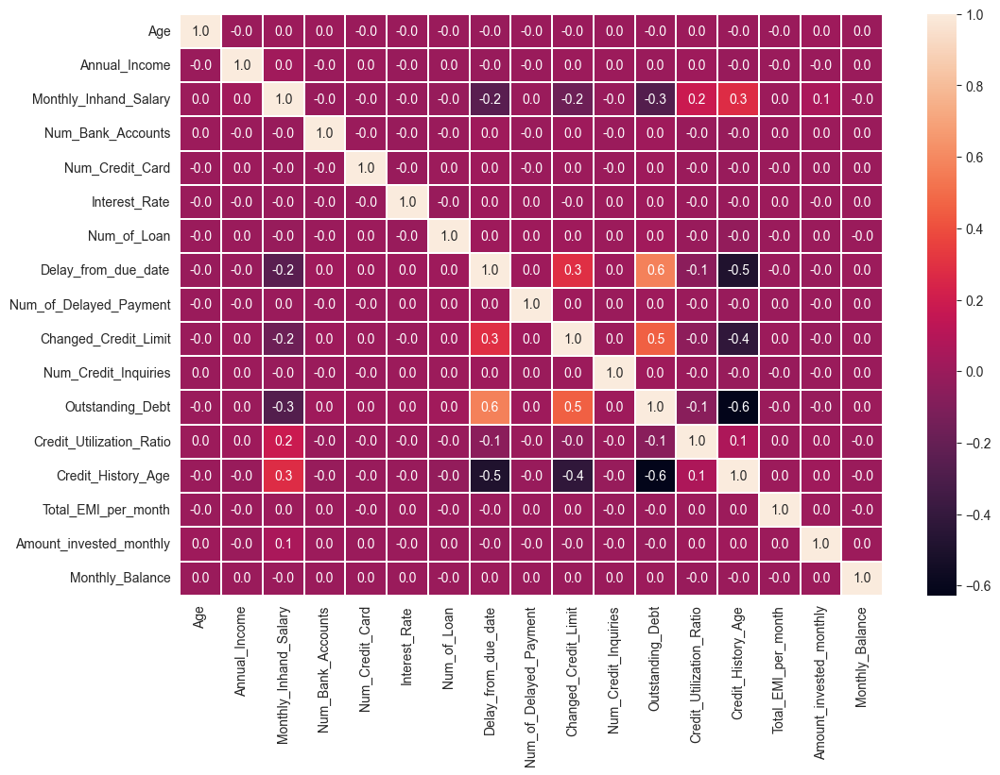

In [19]:
def correlation_plot(df=train_df):
    plt.figure(figsize=[12,8])
    sns.heatmap(df.select_dtypes(exclude='object').dropna().corr(),annot=True,fmt='.1f',linewidth=.2)

correlation_plot()

I will check again after filling\replacing values.



Creating a function that returns scatter\histogram (with continuous density(using Gaussian kernel->using seaborn KDE method) plot by categorical indicator.

In [20]:
def plots_by_categ(feature1,plot_type='hist',feature2='Credit_Score',df=train_df,multi_class=True,bins=30):

    if df[feature1].nunique()<30:
        bins=df[feature1].nunique()
    else:
        pass

    if multi_class:
        _=df[feature2].unique().tolist()
        col=len(_)
        if df[feature1].dtype!='O':
            col+=1

        fig,axes=plt.subplots(1,col,sharey='none',figsize=[14,5])
    else:
        pass

    if plot_type.lower()=='scatter':
        if multi_class:
            fig.suptitle(f'{feature2}')
            for i,v in enumerate(_):
                sns.scatterplot(y=(df[feature1][df[feature2]==v]).dropna(), x=(df[feature1][df[feature2]==v]).dropna().index,ax=axes[i])
                axes[i].set_title(f'{v}\n{feature2}')
        else:
            plt.figure(figsize=[4,3])
            sns.scatterplot(x=df[feature1],y=df[feature2])
    else:
        if multi_class:
            for i,value in enumerate(_):
                if df[feature1].dtype!='O':
                    i+=1
                    if i==1:
                        sns.kdeplot(data=df[[feature1,feature2]],x=feature1,hue=feature2,ax=axes[0])
                sns.histplot((df[feature1][df[feature2]==value]).dropna(),bins=bins,ax=axes[i],kde=True)
                axes[i].set_title(f'{value} {feature2}')
        else:
            plt.figure(figsize=[4,4])
            sns.set_style("whitegrid", {'axes.grid' : False})
            sns.histplot(data=df[[feature1,feature2]],x=feature1,bins=bins,hue=feature2)


Payment_of_Min_Amount:

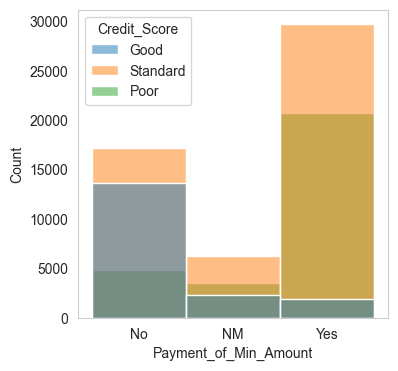

In [21]:
plots_by_categ('Payment_of_Min_Amount',multi_class=False)

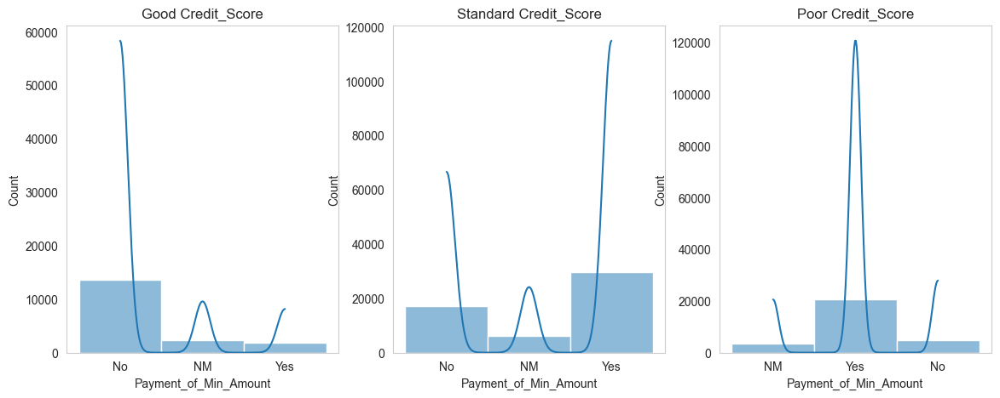

In [22]:
plots_by_categ('Payment_of_Min_Amount')

In the Payment_of_Min_Amount column the value NM-Not Much-> valid.

Creating a function that calculates outliers using the IQR method.

In [23]:
def iqr_method(feature,df=train_df):
    q1=df[feature].quantile(0.25)
    q3=df[feature].quantile(0.75)
    iqr=q3-q1
    upper=q3+2*iqr
    lower=q1-2*iqr
    return [lower,upper]

Creating a function that returns std, mean, max, and min per customer.

In [24]:
def describe_per_id(feature,indicator='Customer_ID',method=('min','quantile','std','mean','max'),df=train_df,sort_by='std',plot=False,kind='line'):

    describe_df=df.groupby(indicator)[feature].agg(method).sort_values(by=sort_by).reset_index(drop=True)
    if plot:
        sns.relplot(data=describe_df,kind=kind)
        plt.xlabel(indicator)
        plt.ylabel(feature)
    else:
        return describe_df


Creating a function that will help to explore the outliers, and return indicators per customer.

In [25]:
def get_indicators_df(check_feature,thresholds='iqr',show_features=False,df=train_df,indicator='Customer_ID',positive=True,return_df=False,return_indicator=True,only_na=False,spectrum=False,return_na=False,return_egg_plot=False,plot_kind='line',cus_std_threshold=False):

    if return_df or return_egg_plot:
        return_indicator=False
    else:
        pass

    if thresholds=='iqr':
        if df[check_feature].dtype!=('object' or 'string' or 'categorical'):
            thresholds=iqr_method(check_feature)
    else:
        pass

    if show_features is True:
        show_features=df.columns
    elif show_features is False:
        show_features=[indicator,check_feature]
    else:
        pass

    if df[check_feature].isna().sum()>1:
        print(f'The feature {check_feature} having {df[check_feature].isna().sum()} Na')
        # if (return_na and return_only_na_indicator) is False:
        #     print(f'The feature {check_feature} having {df[check_feature].isna().sum()} na')
        #     intype=input(f"The feature {check_feature} having {df[check_feature].isna().sum()} na->\nEnter by the following option:\nna->to return only na indicator, \nyes->to including na, \nno->to not including na.")
        #     if intype.strip(' ').lower()=='no':
        #         return_na=False
        #     elif intype.strip(' ').lower()=='na':
        #         return_only_na_indicator=True
        #     else:
        #         return_na=True
    else:
        pass

    if not only_na:

        if df[check_feature].dtype != ('object' or 'string' or 'categorical'):
            if type(thresholds) == list:
                if len(thresholds) != 2:
                    return 'insert 2 values for threshold'
                elif spectrum:
                    split_df = df.query(f'(({check_feature} > {thresholds[0]}) & ({check_feature} < {thresholds[1]}))')[indicator]

                elif positive:
                    split_df = df.query(f'((({check_feature} < {thresholds[0]}) | ({check_feature} > {thresholds[1]}))| ({check_feature} < 0))')[indicator]

                elif not positive:
                    split_df = df.query(f'(({check_feature} < {thresholds[0]}) | ({check_feature} > {thresholds[1]}))')[indicator]

            else:
                if thresholds == 0:
                    split_df = df.query(f'{check_feature} < 0')[indicator]

                else:
                    if positive:
                        split_df = df.query(f'({check_feature} < {thresholds}) | ({check_feature} < 0)')[indicator]


                    elif not positive:
                        split_df = df.query(f'{check_feature} > {thresholds}')[indicator]

        else:
            # not included all dtypes, but it's suitable for the current data frame.
            if df[check_feature].dtype == ('object' or 'string' or 'categorical'):
                print(f"{check_feature} Feature dtype isn't numeric-> Return Na indicators.")
                split_df = df[indicator][df[check_feature].isna()]
            else:
                return print(f'The function suitable with the following dtypes:numerics dtypes,object,string,and categorical-> {check_feature} dtype is {df[check_feature].dtype}' )
    else:
        split_df = df[indicator][df[check_feature].isna()]

    if cus_std_threshold is not False:
        split_df=split_df[split_df.isin((df.loc[:,[indicator,check_feature]].groupby(indicator).agg('std')).query(f'{check_feature}.abs()>{cus_std_threshold}').index)]
    else:
        pass

    if return_na:
        split_df = pd.concat([split_df,df.query(f'{check_feature}.isna()')[indicator]])

    else:
        pass

    if return_egg_plot:
        describe_per_id(feature=check_feature ,indicator=indicator,df=df[show_features][df[indicator].isin(split_df.unique())],kind=plot_kind,plot=True)
        plt.title(f'Describe {check_feature} per customer,Thresholds->{thresholds}')

    elif return_df & return_indicator:
        return df[check_feature][df[indicator].isin(split_df.unique().tolist())], split_df.index, split_df.tolist()

    elif return_indicator:
        return split_df.index.tolist(), split_df.tolist()

    elif return_df:
        return df[show_features][df[indicator].isin(split_df.unique().tolist())]



Num_Bank_Accounts:

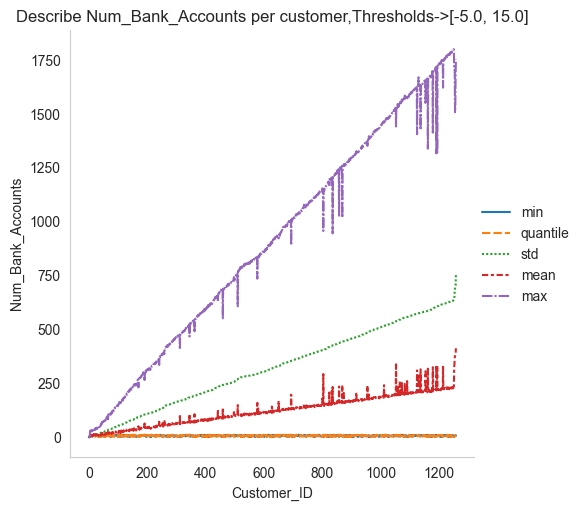

In [26]:
get_indicators_df('Num_Bank_Accounts',return_egg_plot=True)

Creating a function for checking gaps each customer instances.

In [27]:
def gap_threshold(threshold,feature,instances=False,indicator='Customer_ID',df=train_df):
    ind=[]
    ins=[]

    if instances is False:
        instances=df.index.tolist()
    elif type(instances) is str:
        if instances.lower()=='iqr':
            instances=get_indicators_df(feature,df=df)[0]

    for i in tqdm(instances):
        per_cost_df=df.query(f"{indicator}.isin({[df[indicator].loc[i]]})")
        gap=(per_cost_df[feature].mode()-per_cost_df[feature].loc[i]).abs()[0]
        if gap>threshold:
            ins.append(i)
            ind.append(df[indicator].loc[i])

    return ins,ind

In [28]:
train_df.Num_Bank_Accounts.describe()

count    100000.000000
mean         17.091280
std         117.404834
min          -1.000000
25%           3.000000
50%           6.000000
75%           7.000000
max        1798.000000
Name: Num_Bank_Accounts, dtype: float64

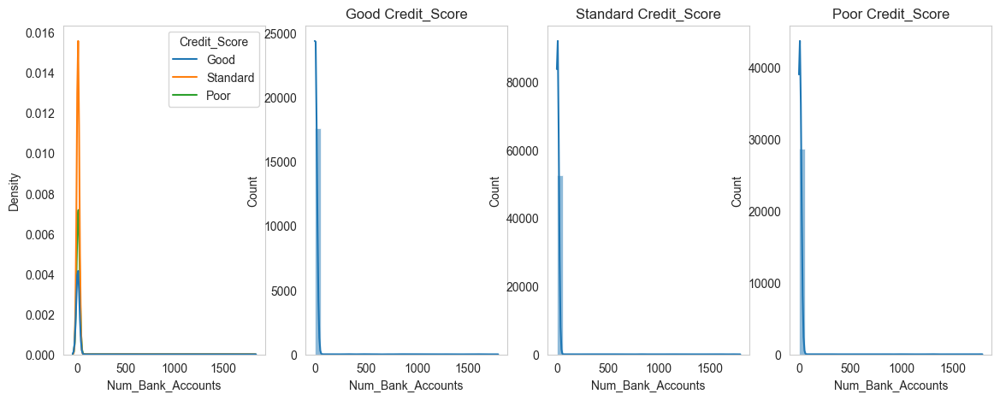

In [29]:
plots_by_categ('Num_Bank_Accounts')

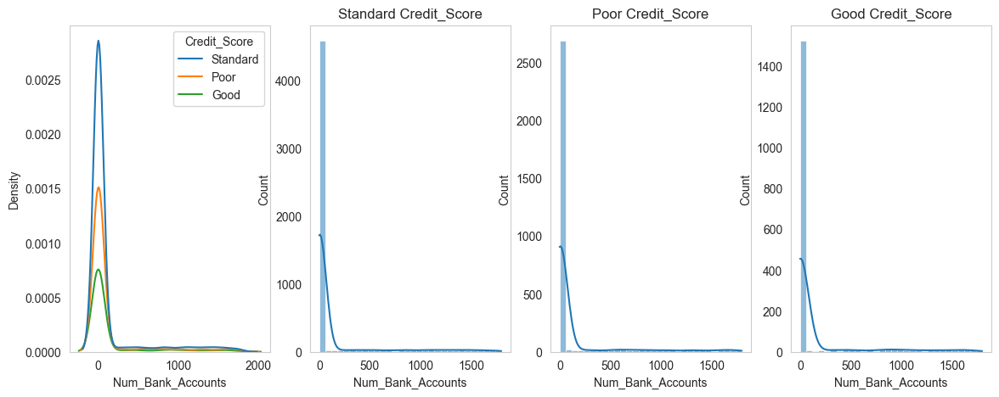

In [30]:
plots_by_categ('Num_Bank_Accounts',df=get_indicators_df('Num_Bank_Accounts',return_df=True,show_features=True))

In [31]:
iqr_method('Num_Bank_Accounts')

[-5.0, 15.0]

In [32]:
train_df['Num_Bank_Accounts'].median()

6.0

In [33]:
get_indicators_df('Num_Bank_Accounts',return_df=True,cus_std_threshold=3).head(2*8)

,Customer_ID,Num_Bank_Accounts
264,CUS_0x4004,8
265,CUS_0x4004,8
266,CUS_0x4004,8
267,CUS_0x4004,1414
268,CUS_0x4004,8
269,CUS_0x4004,8
270,CUS_0x4004,8
271,CUS_0x4004,8
288,CUS_0x4080,1231
289,CUS_0x4080,7


In [34]:
describe_per_id('Num_Bank_Accounts',df=get_indicators_df('Num_Bank_Accounts',return_df=True)).head(2*8)

,min,quantile,std,mean,max
0,-1,-1.0,0.353553,-0.875,0
1,-1,-1.0,0.462910,-0.750,0
2,-1,-0.5,0.534522,-0.500,0
3,-1,-0.5,0.534522,-0.500,0
4,6,6.0,4.242641,7.500,18
5,10,10.0,7.071068,12.500,30
6,7,7.0,7.424621,9.625,28
7,7,7.0,7.778175,9.750,29
8,5,5.0,7.778175,7.750,27
9,3,3.0,8.131728,5.875,26


In [35]:
get_indicators_df('Num_Bank_Accounts',[15,20],return_df=True,spectrum=True)

,Customer_ID,Num_Bank_Accounts
73216,CUS_0x39c5,6
73217,CUS_0x39c5,6
73218,CUS_0x39c5,6
73219,CUS_0x39c5,18
73220,CUS_0x39c5,6
73221,CUS_0x39c5,6
73222,CUS_0x39c5,6
73223,CUS_0x39c5,6


In [36]:
get_indicators_df('Num_Bank_Accounts',0,['Customer_ID','Num_Bank_Accounts','Num_of_Loan','Type_of_Loan'],return_df=True).head(2*8)

,Customer_ID,Num_Bank_Accounts,Num_of_Loan,Type_of_Loan
30328,CUS_0x4f2a,0,2.0,"Auto Loan, and Not Specified"
30329,CUS_0x4f2a,0,2.0,"Auto Loan, and Not Specified"
30330,CUS_0x4f2a,-1,2.0,"Auto Loan, and Not Specified"
30331,CUS_0x4f2a,-1,2.0,"Auto Loan, and Not Specified"
30332,CUS_0x4f2a,-1,2.0,"Auto Loan, and Not Specified"
30333,CUS_0x4f2a,-1,2.0,"Auto Loan, and Not Specified"
30334,CUS_0x4f2a,-1,2.0,"Auto Loan, and Not Specified"
30335,CUS_0x4f2a,-1,2.0,"Auto Loan, and Not Specified"
43688,CUS_0xa878,0,0.0,NaN
43689,CUS_0xa878,-1,0.0,NaN


The Num Bank Accounts feature is having negative values (E.g.-1)-> It's unclearly if it needed to be 0 or 1. Still, my intuition says that the -1 value needed to be replaced with 0, since the loan has already been taken without a bank account, and the Loan Types are->Debt Con..., auto, not specified. for a student loan, I didn't get any conclusion from the loan type, but I assume that -1 value is a pattern mistake.

In [37]:
train_df.Num_Bank_Accounts.replace(-1,0,inplace=True)

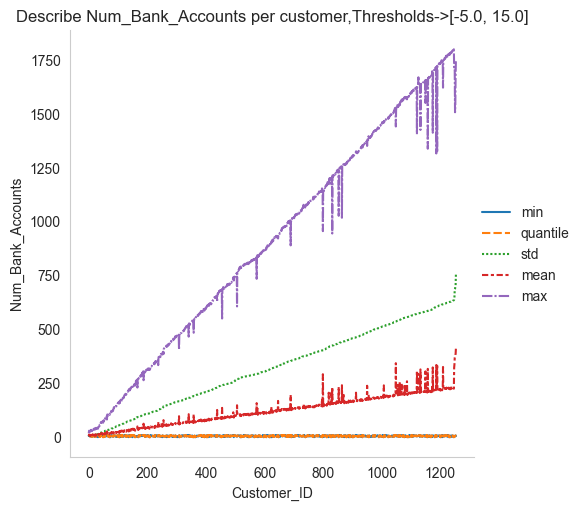

In [38]:
get_indicators_df('Num_Bank_Accounts',return_egg_plot=True)

Set threshold with IQR method that returned an upper limit of 15.

Creating a function that adds to dictionary indicator and method per feature for filling\replacing some features values, I will extract the dictionary values after exploring all features.

In [39]:
replace_dict={}
def replace_dict_fun(feature,method,gap=None,thresholds='iqr',feature_indicator='Customer_ID',df=train_df,return_na=False,only_na=False,std_threshold=False):

    if thresholds=='iqr':
        if gap is not None:
            replace_dict[feature]=[gap_threshold(gap,feature,instances='iqr',df=df),method]
        else:
            replace_dict[feature]=[get_indicators_df(feature,df=df,indicator=feature_indicator,return_na=return_na,only_na=only_na),method]
    else:
        if gap is not None:
            replace_dict[feature]=[gap_threshold(gap,feature,df=df),method]

        replace_dict[feature]=[get_indicators_df(feature,df=df,indicator=feature_indicator,thresholds=thresholds,return_na=return_na,only_na=only_na,cus_std_threshold=std_threshold),method]

Adding replace method and indicators for Num_Bank_Accounts feature to replace_dict dictionary.

In [40]:
replace_dict_fun('Num_Bank_Accounts','linked')

Adding replace method and indicators for Occupation feature to replace_dict dictionary.

In [41]:
replace_dict_fun('Occupation','mode',return_na=True)

The feature Occupation having 7062 Na
Occupation Feature dtype isn't numeric-> Return Na indicators.


Age:

In [42]:
train_df.Age.describe()

count    100000.000000
mean        110.649700
std         686.244717
min        -500.000000
25%          24.000000
50%          33.000000
75%          42.000000
max        8698.000000
Name: Age, dtype: float64

In [43]:
train_df.Age=train_df.Age.abs()

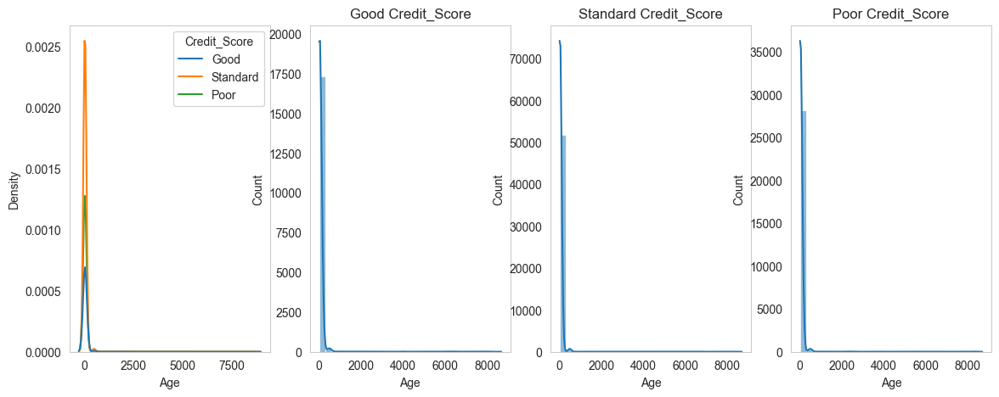

In [44]:
plots_by_categ('Age')

In [45]:
iqr_method('Age')

[-9.0, 76.0]

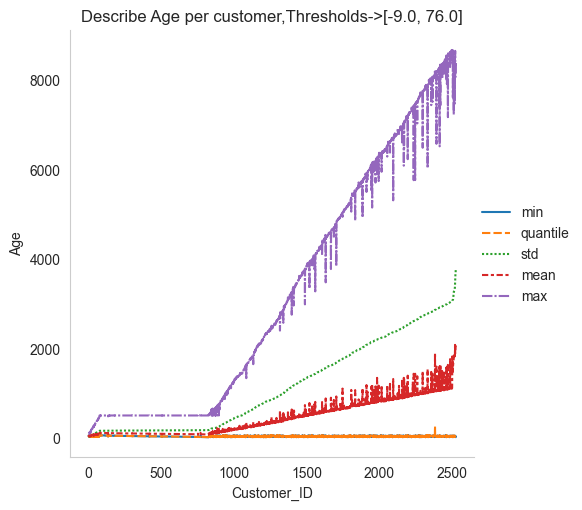

In [46]:
get_indicators_df('Age',return_egg_plot=True)

I will extract the instances with invalid values per customer using the gap_threshold function (build above) and set the gap threshold to 1, gap above 1 is illogical that in one month get growth above one year.
Linked instance values will replace illogic values.

In [47]:
replace_dict_fun('Age','linked',gap=1,df=train_df)

100%|██████████| 2781/2781 [00:04<00:00, 587.42it/s]


In [48]:
# '''Show that the iqr indicator are suitable for the task, checking all instances-->'''
# len(replace_dict['Age'][0][0])==(len(gap_threshold(threshold=1,feature='Age',df=train_df)[0]) and len(get_indicators_df('Age')[0]))


Num_Credit_Card:

In [49]:
train_df.Num_Credit_Card.describe()

count    100000.00000
mean         22.47443
std         129.05741
min           0.00000
25%           4.00000
50%           5.00000
75%           7.00000
max        1499.00000
Name: Num_Credit_Card, dtype: float64

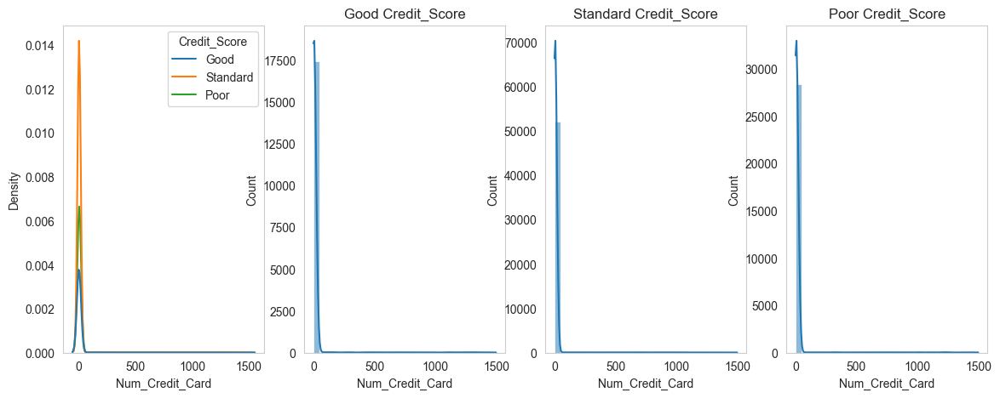

In [50]:
plots_by_categ('Num_Credit_Card')

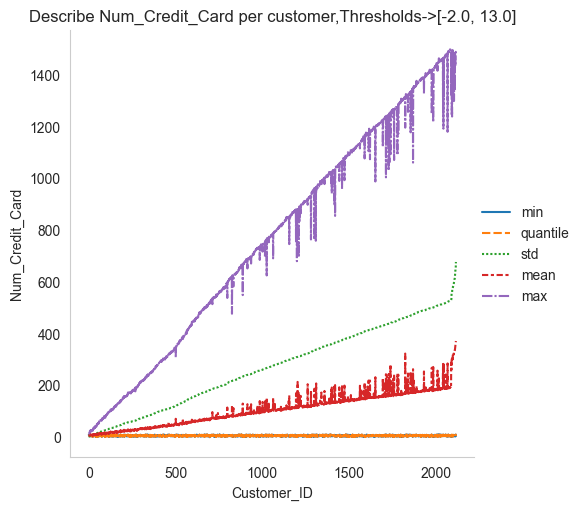

In [51]:
get_indicators_df('Num_Credit_Card',return_egg_plot=True,cus_std_threshold=0)

In [52]:
iqr_method('Num_Credit_Card')

[-2.0, 13.0]

In [53]:
get_indicators_df('Num_Credit_Card',return_df=True).head(8*2)

,Customer_ID,Num_Credit_Card
8,CUS_0x21b1,4
9,CUS_0x21b1,4
10,CUS_0x21b1,1385
11,CUS_0x21b1,4
12,CUS_0x21b1,4
13,CUS_0x21b1,4
14,CUS_0x21b1,4
15,CUS_0x21b1,4
40,CUS_0x95ee,1288
41,CUS_0x95ee,5


In [54]:
get_indicators_df('Num_Credit_Card',[13,16],show_features=True,return_df=True,spectrum=True,cus_std_threshold=2)

,Customer_ID,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
50672,CUS_0x95e7,January,21,Doctor,7080.700195,358.058333,9,9,20,8.0,"Payday Loan, Mortgage Loan, Not Specified, Not...",24,24.0,24.580000,8.0,Bad,3011.810059,24.856740,63.0,NM,35.015311,10.913531,High_spent_Small_value_payments,249.876984,Poor
50673,CUS_0x95e7,February,22,Doctor,7080.700195,358.058333,9,9,20,-100.0,"Payday Loan, Mortgage Loan, Not Specified, Not...",32,24.0,24.580000,8.0,NaN,3011.810059,31.296438,64.0,Yes,35.015311,15.852076,Low_spent_Small_value_payments,274.938446,Poor
50674,CUS_0x95e7,March,22,Doctor,7080.700195,358.058333,9,15,20,8.0,"Payday Loan, Mortgage Loan, Not Specified, Not...",27,24.0,24.580000,8.0,NaN,3011.810059,32.046673,65.0,Yes,35.015311,20.592188,Low_spent_Small_value_payments,270.198334,Poor
50675,CUS_0x95e7,April,22,Doctor,7080.700195,358.058333,9,9,20,8.0,"Payday Loan, Mortgage Loan, Not Specified, Not...",27,23.0,24.580000,9.0,Bad,3011.810059,27.947311,NaN,NM,35.015311,23.987871,Low_spent_Large_value_payments,246.802658,Standard
50676,CUS_0x95e7,May,1695,NaN,7080.700195,358.058333,9,9,20,8.0,"Payday Loan, Mortgage Loan, Not Specified, Not...",27,23.0,24.580000,9.0,Bad,3011.810059,34.486808,67.0,NM,35.015311,16.838383,NaN,263.952148,Poor
50677,CUS_0x95e7,June,22,Doctor,7080.700195,358.058333,9,9,20,8.0,"Payday Loan, Mortgage Loan, Not Specified, Not...",22,23.0,24.580000,9.0,NaN,3011.810059,23.926543,68.0,NM,35.015311,12.921266,Low_spent_Small_value_payments,277.869263,Poor
50678,CUS_0x95e7,July,22,Doctor,7080.700195,NaN,9,9,20,8.0,"Payday Loan, Mortgage Loan, Not Specified, Not...",24,24.0,24.580000,9.0,Bad,3011.810059,25.582372,NaN,Yes,35.015311,21.962399,Low_spent_Small_value_payments,268.828125,Poor
50679,CUS_0x95e7,August,22,Doctor,7080.700195,NaN,9,9,20,8.0,"Payday Loan, Mortgage Loan, Not Specified, Not...",25,22.0,24.580000,9.0,Bad,3011.810059,30.363533,NaN,NM,35.015311,34.633438,Low_spent_Medium_value_payments,246.157089,Poor
54240,CUS_0x8b11,January,22,Entrepreneur,12837.245117,837.770417,8,4,10,3.0,"Personal Loan, Payday Loan, and Payday Loan",16,8.0,NaN,0.0,Standard,1222.280029,25.319371,335.0,NM,21.243325,99.419250,Low_spent_Small_value_payments,253.114471,Standard
54241,CUS_0x8b11,February,22,NaN,12837.245117,NaN,8,4,10,3.0,"Personal Loan, Payday Loan, and Payday Loan",11,9.0,NaN,0.0,Standard,1222.280029,29.852228,336.0,No,21.243325,21.282444,High_spent_Large_value_payments,281.251282,Standard


The data has illogical values, e.g., interest rate:2123, num bank accounts:1349, et al.

In [55]:
get_indicators_df('Num_Credit_Card',return_df=True,cus_std_threshold=5).head(8)

,Customer_ID,Num_Credit_Card
8,CUS_0x21b1,4
9,CUS_0x21b1,4
10,CUS_0x21b1,1385
11,CUS_0x21b1,4
12,CUS_0x21b1,4
13,CUS_0x21b1,4
14,CUS_0x21b1,4
15,CUS_0x21b1,4


Adding replace method and indicators for Num_Credit_Card feature to replace_dict dictionary.

In [56]:
replace_dict_fun('Num_Credit_Card','linked',std_threshold=1)

Interest_Rate:

In [57]:
train_df.Interest_Rate.describe()

count    100000.000000
mean         72.466040
std         466.422621
min           1.000000
25%           8.000000
50%          13.000000
75%          20.000000
max        5797.000000
Name: Interest_Rate, dtype: float64

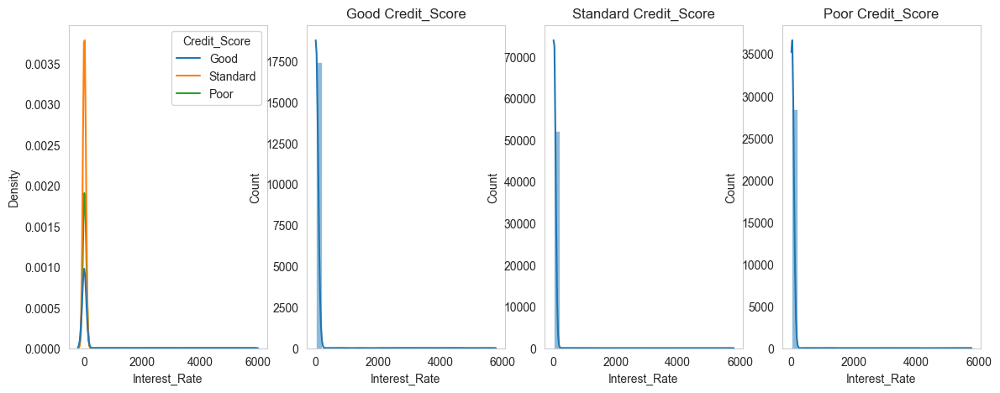

In [58]:
plots_by_categ('Interest_Rate')

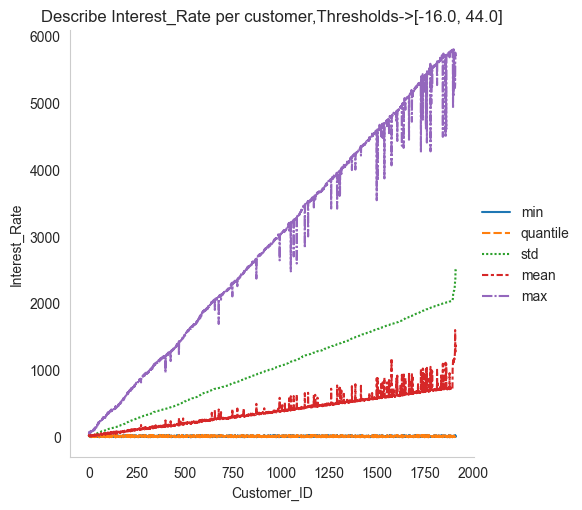

In [59]:
get_indicators_df('Interest_Rate',return_egg_plot=True)

In [60]:
iqr_method('Interest_Rate')

[-16.0, 44.0]

In [61]:
get_indicators_df('Interest_Rate',[1,48],show_features=True,return_df=True).head(8)

,Customer_ID,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
40,CUS_0x95ee,January,31,Lawyer,73928.460938,NaN,4,1288,8,0.0,NaN,12,10.0,10.14,2.0,Good,548.200012,39.962685,NaN,No,15015.0,98.674408,High_spent_Large_value_payments,740.196106,Good
41,CUS_0x95ee,February,31,NaN,73928.460938,5988.705,4,5,8,0.0,NaN,8,7.0,10.14,2.0,Good,548.200012,42.769864,384.0,NM,0.0,172.939209,Low_spent_Medium_value_payments,705.931274,Good
42,CUS_0x95ee,March,31,Lawyer,73928.460938,5988.705,4,5,8,0.0,NaN,8,7.0,10.14,2.0,Good,548.200012,40.712187,NaN,No,0.0,150.059738,High_spent_Medium_value_payments,698.810791,Good
43,CUS_0x95ee,April,31,Lawyer,73928.460938,5988.705,4,5,8,0.0,NaN,8,7.0,10.14,2.0,Good,548.200012,30.201658,386.0,No,0.0,618.202393,Low_spent_Small_value_payments,270.668121,Good
44,CUS_0x95ee,May,31,Lawyer,73928.460938,5988.705,4,5,5318,0.0,NaN,11,7.0,10.14,2.0,NaN,548.200012,26.333310,387.0,No,0.0,177.951843,Low_spent_Large_value_payments,690.918640,Good
45,CUS_0x95ee,June,31,Lawyer,73928.460938,5988.705,4,5,8,0.0,NaN,7,7.0,10.14,2.0,Good,548.200012,35.275437,NaN,No,15515.0,235.790329,Low_spent_Large_value_payments,633.080200,Good
46,CUS_0x95ee,July,31,Lawyer,73928.460938,5988.705,4,5,8,0.0,NaN,8,4.0,9.14,2.0,NaN,548.200012,36.624791,389.0,No,0.0,348.509399,High_spent_Small_value_payments,510.361115,Standard
47,CUS_0x95ee,August,31,Lawyer,73928.460938,5988.705,4,5,8,0.0,NaN,8,7.0,10.14,NaN,Good,548.200012,31.580990,390.0,No,0.0,42.635590,NaN,796.234924,Good


It also seems to be a mistake because by looking at other features: Num_of_Loan, Delay_from_due_date, Total_EMI_per_month->  we can write a function with criteria that will check all criteria.
For example: If a Customer has a good credit score it's illogical that he will get a high-interest rate.
The Spectrum of Credit card interest rates is about ~5%-~30%.
I assume all values above 44 are invalid and will replace them with back-forward values.

Adding replace method and indicators for Interest_Rate feature to replace_dict dictionary.


In [62]:
replace_dict_fun('Interest_Rate','linked',std_threshold=1)

Num of Loan:

In [63]:
train_df.Num_of_Loan.describe()

count    100000.000000
mean          3.009960
std          62.647877
min        -100.000000
25%           1.000000
50%           3.000000
75%           5.000000
max        1496.000000
Name: Num_of_Loan, dtype: float64

In [64]:
get_indicators_df('Num_of_Loan',0,return_df=True).head(8*2)

,Customer_ID,Num_of_Loan
24,CUS_0xb891,1.0
25,CUS_0xb891,1.0
26,CUS_0xb891,1.0
27,CUS_0xb891,1.0
28,CUS_0xb891,1.0
29,CUS_0xb891,1.0
30,CUS_0xb891,1.0
31,CUS_0xb891,-100.0
32,CUS_0x1cdb,0.0
33,CUS_0x1cdb,0.0


Replacing -100 values to Na.

In [65]:
train_df.Num_of_Loan.replace(-100,np.nan,inplace=True)

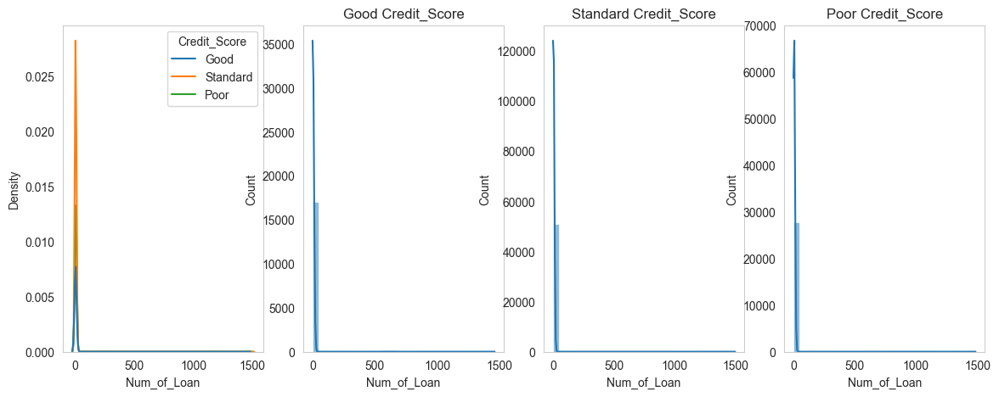

In [66]:
plots_by_categ('Num_of_Loan')

The feature Num_of_Loan having 3876 Na


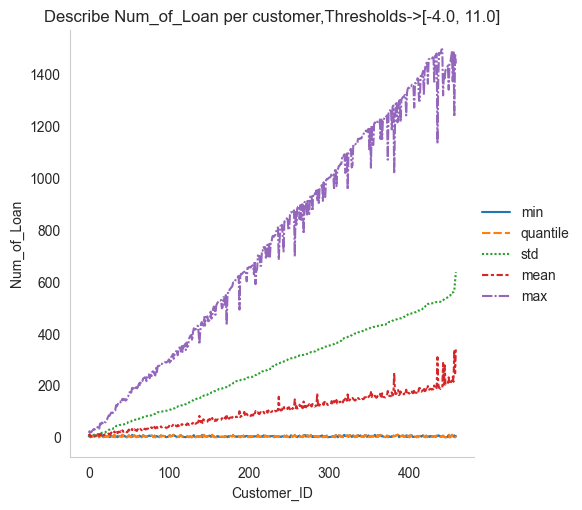

In [67]:
get_indicators_df('Num_of_Loan',return_egg_plot=True)

In [68]:
iqr_method('Num_of_Loan')

[-4.0, 11.0]

In [69]:
get_indicators_df('Num_of_Loan',[10,22],return_df=True,spectrum=True)

The feature Num_of_Loan having 3876 Na


,Customer_ID,Num_of_Loan
65656,CUS_0xb482,19.0
65657,CUS_0xb482,1.0
65658,CUS_0xb482,1.0
65659,CUS_0xb482,1.0
65660,CUS_0xb482,1.0
65661,CUS_0xb482,1.0
65662,CUS_0xb482,1.0
65663,CUS_0xb482,1.0
72888,CUS_0x15b7,3.0
72889,CUS_0x15b7,3.0


In [70]:
train_df.Type_of_Loan.unique()[:8]

array(['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
       'Credit-Builder Loan', 'Auto Loan, Auto Loan, and Not Specified',
       'Not Specified', nan, 'Credit-Builder Loan, and Mortgage Loan',
       'Not Specified, Auto Loan, and Student Loan',
       'Personal Loan, Debt Consolidation Loan, and Auto Loan'],
      dtype=object)

Removing 'and' to avoid duplicated loan types.

In [71]:
train_df.Type_of_Loan=train_df.Type_of_Loan.str.replace('and','')

Checking if NaN indicator that customer doesn't have loans.

In [72]:
loan_na=get_indicators_df('Type_of_Loan',show_features=['Customer_ID','Num_of_Loan','Type_of_Loan'], return_df=True,only_na=True)

cus_loan_0_100=list(loan_na.query('0<Num_of_Loan<100').Customer_ID.unique())
train_df.query(f'Customer_ID.isin({cus_loan_0_100})')[['Type_of_Loan','Customer_ID','Num_of_Loan']]

The feature Type_of_Loan having 11408 Na


,Type_of_Loan,Customer_ID,Num_of_Loan
48000,NaN,CUS_0xa08e,0.0
48001,NaN,CUS_0xa08e,0.0
48002,NaN,CUS_0xa08e,0.0
48003,NaN,CUS_0xa08e,50.0
48004,NaN,CUS_0xa08e,940.0
48005,NaN,CUS_0xa08e,0.0
48006,NaN,CUS_0xa08e,0.0
48007,NaN,CUS_0xa08e,0.0
71728,NaN,CUS_0x3909,NaN
71729,NaN,CUS_0x3909,0.0


In [73]:
loan_na.isna().sum()

Customer_ID         0
Num_of_Loan       417
Type_of_Loan    11408
dtype: int64

In [74]:
len(gap_threshold(11,'Num_of_Loan',df=loan_na)[0])==loan_na[loan_na.Num_of_Loan>0].Num_of_Loan.shape[0]

100%|██████████| 11408/11408 [00:08<00:00, 1386.81it/s]


True

In [75]:
del loan_na,cus_loan_0_100

Feature extraction-> splitting the list of the loan types ->replacing the values with the sum of the loan types-> one hot encoding method.

In [76]:
def convert_loans_type(df=None):
    unique_loans_type = []
    col = []

    [unique_loans_type.extend(df.loc[:, 'Type_of_Loan'].str.split(',').str.get(i).str.strip().unique().tolist()) for i in range(9)]

    unique_loans_type = list(set(unique_loans_type))
# '''convert object to columns'''
    _ = np.zeros((df.shape[0], len(unique_loans_type)))
    get_dummies = pd.DataFrame(_, columns=unique_loans_type)

    for n in tqdm(range(9)):
        col = df.loc[:, 'Type_of_Loan'].str.split(',').str.get(n).str.strip().unique().tolist()
        get_dummies.loc[:, col] = get_dummies.loc[:, col] + pd.get_dummies(df.loc[:, 'Type_of_Loan'].str.split(',').str.get(n).str.strip())

    df.rename(columns={'Credit_History_Age': 'Credit_Months_History_Age'})
    df = pd.concat([df, get_dummies], axis=1)
    df.drop(['Type_of_Loan',df.columns[-10]], inplace=True, axis=1)
    return df

train_df=convert_loans_type(df=train_df)


100%|██████████| 9/9 [00:02<00:00,  4.07it/s]


In [77]:
train_df.head()

,Customer_ID,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Not Specified,Personal Loan,Debt Consolidation Loan,Mortgage Loan,Payday Loan,Student Loan,Credit-Builder Loan,Auto Loan,Home Equity Loan
0,CUS_0xd40,January,23,Scientist,19114.119141,1824.843333,3,4,3,4.0,3,7.0,11.27,4.0,NaN,809.97998,26.822620,265.0,No,49.574949,80.415298,High_spent_Small_value_payments,312.494080,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
1,CUS_0xd40,February,23,Scientist,19114.119141,NaN,3,4,3,4.0,-1,NaN,11.27,4.0,Good,809.97998,31.944960,NaN,No,49.574949,118.280220,Low_spent_Large_value_payments,284.629150,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
2,CUS_0xd40,March,500,Scientist,19114.119141,NaN,3,4,3,4.0,3,7.0,NaN,4.0,Good,809.97998,28.609352,267.0,No,49.574949,81.699524,Low_spent_Medium_value_payments,331.209869,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
3,CUS_0xd40,April,23,Scientist,19114.119141,NaN,3,4,3,4.0,5,4.0,6.27,4.0,Good,809.97998,31.377862,268.0,No,49.574949,199.458069,Low_spent_Small_value_payments,223.451309,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
4,CUS_0xd40,May,23,Scientist,19114.119141,1824.843333,3,4,3,4.0,6,NaN,11.27,4.0,Good,809.97998,24.797347,269.0,No,49.574949,41.420155,High_spent_Medium_value_payments,341.489227,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0


In [78]:
(train_df.iloc[:,-9:].sum(axis=1)!=train_df.Num_of_Loan).sum()==len(get_indicators_df('Num_of_Loan',return_na=True)[0])

The feature Num_of_Loan having 3876 Na


True

The sum of the types of loans will fill the NA.

In [79]:
def fill_na_loan(df=train_df):
    for i in get_indicators_df('Num_of_Loan',df=df,return_na=True)[0]:
        df.loc[i,'Num_of_Loan']=int(df.loc[i,'Home Equity Loan':].sum())
    return df

train_df=fill_na_loan(df=train_df)

The feature Num_of_Loan having 3876 Na


In [80]:
train_df.Num_of_Loan.describe()

count    100000.000000
mean          3.396920
std           2.481757
min           0.000000
25%           1.000000
50%           3.000000
75%           5.000000
max           9.000000
Name: Num_of_Loan, dtype: float64

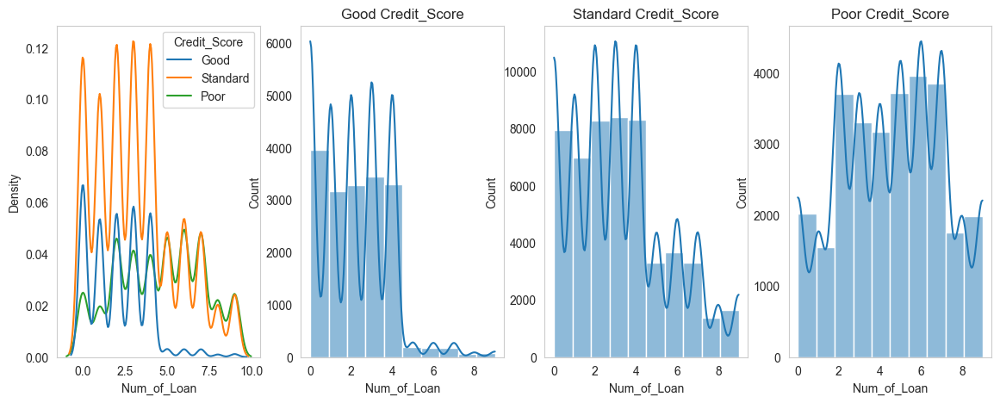

In [81]:
plots_by_categ('Num_of_Loan',df=train_df)

The feature Num_of_Loan having 3876 Na


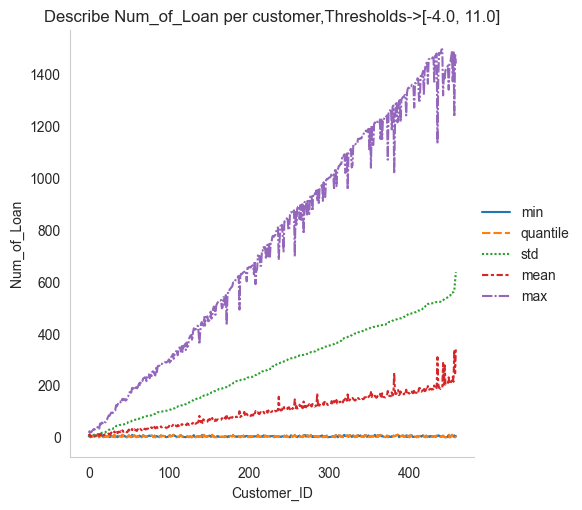

In [82]:
get_indicators_df('Num_of_Loan',return_egg_plot=True)

Delay_from_due_date:

In [83]:
train_df.Delay_from_due_date.describe()

count    100000.000000
mean         21.068780
std          14.860104
min          -5.000000
25%          10.000000
50%          18.000000
75%          28.000000
max          67.000000
Name: Delay_from_due_date, dtype: float64

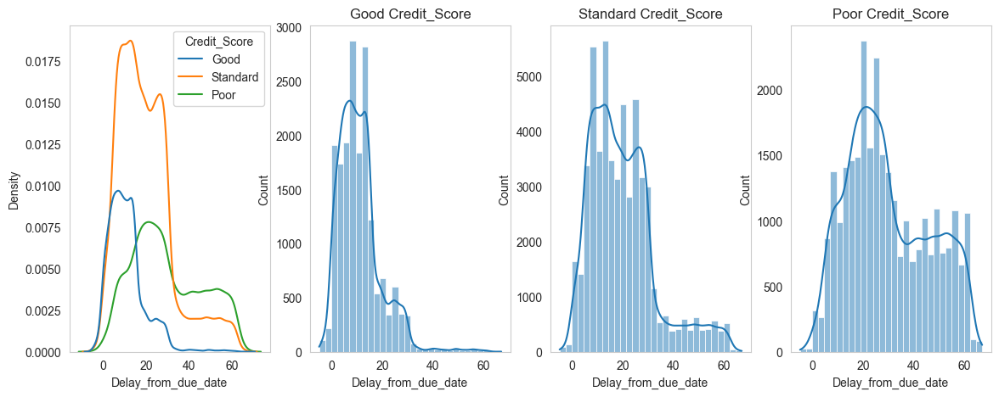

In [84]:
plots_by_categ('Delay_from_due_date')

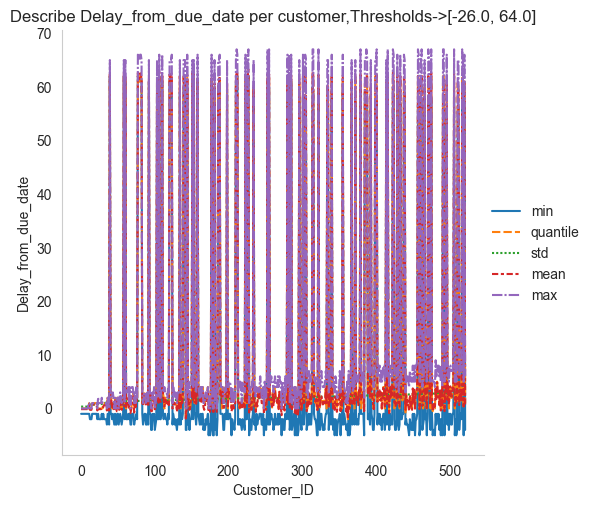

In [85]:
get_indicators_df('Delay_from_due_date',return_egg_plot=True)

In [86]:
iqr_method('Delay_from_due_date')

[-26.0, 64.0]

In [87]:
get_indicators_df('Delay_from_due_date',0,show_features=['Customer_ID','Num_Bank_Accounts','Num_Credit_Card','Num_of_Loan','Delay_from_due_date'],return_df=True,positive=False).head(2*8)

,Customer_ID,Num_Bank_Accounts,Num_Credit_Card,Num_of_Loan,Delay_from_due_date
0,CUS_0xd40,3,4,4.0,3
1,CUS_0xd40,3,4,4.0,-1
2,CUS_0xd40,3,4,4.0,3
3,CUS_0xd40,3,4,4.0,5
4,CUS_0xd40,3,4,4.0,6
5,CUS_0xd40,3,4,4.0,8
6,CUS_0xd40,3,4,4.0,3
7,CUS_0xd40,3,4,4.0,3
48,CUS_0x284a,0,1,2.0,0
49,CUS_0x284a,0,1,2.0,-1


Delay_from_due_date column having negative values-> I will not change that because it's maybe indicative of early payment.

The values are logical ->max std per customer is ~4, will prove by checking the following month's gap if gap>31 ->illogical value.
Why?
31 days are the maximum gap between consecutive months.

Creating a function that checks gaps between instances per customer.

In [88]:
train_df.loc[1:,'Delay_from_due_date'].to_numpy()
def check_gaps(feature,valid_gap ,indicator='Customer_ID',df=train_df,back_forward=False):

    indicator_to_invalid={}
    for i in tqdm(df[indicator].unique().tolist()):
        _=(df.loc[df.index[df[indicator]==i],feature]).to_numpy()

        if back_forward:
            for n in range(1,7):
                gap=abs(_[n]-_[n+1])
                gap_2=abs(_[n]-_[n-1])
                if gap>valid_gap and gap_2>valid_gap:
                    indicator_to_invalid[i]={n:gap}
        else:
            for n in range(7):
                gap=abs(_[n]-_[n+1])
                if gap>valid_gap:
                    indicator_to_invalid[i]={n+1:gap}

    if indicator_to_invalid=={}:
        return print(f'All gaps between the Consecutive instances per {indicator} are lower than {valid_gap} for {feature} feature.\U0001F913')

    return indicator_to_invalid

In [89]:
check_gaps('Delay_from_due_date',31)

100%|██████████| 12500/12500 [00:41<00:00, 300.97it/s]

All gaps between the Consecutive instances per Customer_ID are lower than 31 for Delay_from_due_date feature.🤓


Annual_Income:

In [90]:
train_df.Annual_Income.describe()

count    1.000000e+05
mean     1.764157e+05
std      1.429618e+06
min      7.005930e+03
25%      1.945750e+04
50%      3.757861e+04
75%      7.279092e+04
max      2.419806e+07
Name: Annual_Income, dtype: float64

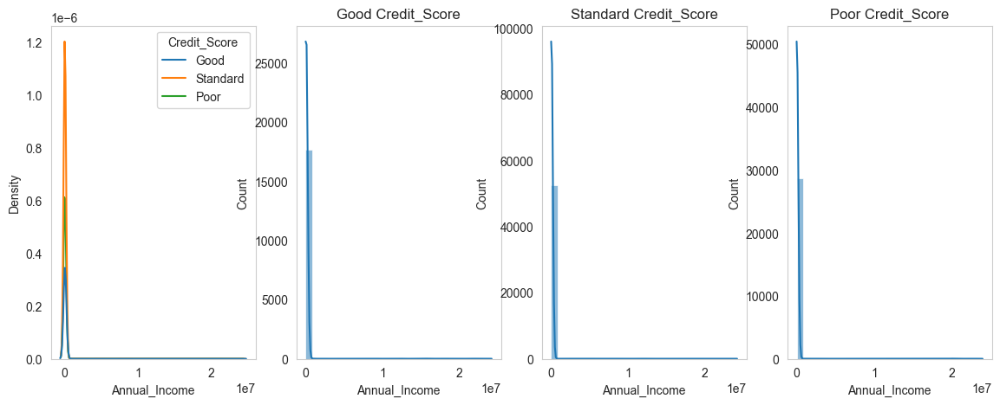

In [91]:
plots_by_categ('Annual_Income')

In [92]:
iqr_method('Annual_Income')[1]

179457.765625

In [93]:
get_indicators_df('Annual_Income',show_features=['Customer_ID','Monthly_Inhand_Salary','Annual_Income'],return_df=True,cus_std_threshold=100).head(2*8)

,Customer_ID,Monthly_Inhand_Salary,Annual_Income
48,CUS_0x284a,11242.783333,1.313134e+05
49,CUS_0x284a,11242.783333,1.313134e+05
50,CUS_0x284a,10469.207759,1.313134e+05
51,CUS_0x284a,10469.207759,1.313134e+05
52,CUS_0x284a,10469.207759,1.313134e+05
53,CUS_0x284a,NaN,1.313134e+05
54,CUS_0x284a,NaN,1.090943e+07
55,CUS_0x284a,10469.207759,1.313134e+05
224,CUS_0xbffe,2210.032500,2.857239e+04
225,CUS_0xbffe,2210.032500,2.857239e+04


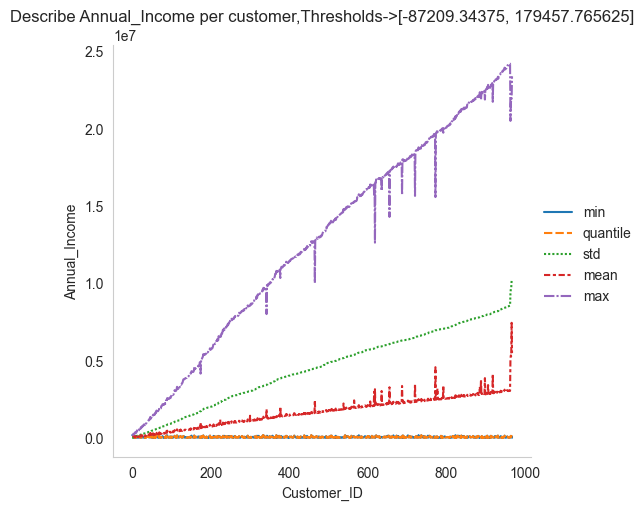

In [94]:
get_indicators_df('Annual_Income',return_egg_plot=True)

In [95]:
get_indicators_df('Annual_Income',return_df=True,cus_std_threshold=100000).head(3*8)

,Customer_ID,Annual_Income
48,CUS_0x284a,1.313134e+05
49,CUS_0x284a,1.313134e+05
50,CUS_0x284a,1.313134e+05
51,CUS_0x284a,1.313134e+05
52,CUS_0x284a,1.313134e+05
53,CUS_0x284a,1.313134e+05
54,CUS_0x284a,1.090943e+07
55,CUS_0x284a,1.313134e+05
224,CUS_0xbffe,2.857239e+04
225,CUS_0xbffe,2.857239e+04


Annual income = hourly wage x weekly hours x weeks worked in a year.
Let's take for example line 245, the Annual_Income value in June is ~5e+5, but in May and July the values are ~2e+4, Reminder it's an annual income, if the feature represents just the income from salary we can see that the Monthly_Inhand_Salary value does not change between January to August.
Let's explore another scenario, Annual_Income - all Annual income:
If during July the Customer sells a property, won the lottery, or inherited an amount of money, bonus, etc.->the amount will include in the august Annual_Income column because the feature represents income for a year.(but we don't know what was one year earlier :/)
If the outliers values sit on August I can't prove that it's the wrong value if the Annual_Income includes all income(actually, we can solve this issue by looking at the test data, I can write a function with criteria that the indicator are Customer_ID&Month indicator)


In [96]:
august_annual=get_indicators_df('Annual_Income',return_df=True,show_features=True,cus_std_threshold=0).loc[:,['Customer_ID','Month','Monthly_Inhand_Salary','Annual_Income']].query(f"Annual_Income>{iqr_method('Annual_Income')[1]}").query("Month == 'August'")
august_annual.head(2*8)

,Customer_ID,Month,Monthly_Inhand_Salary,Annual_Income
231,CUS_0xbffe,August,2210.032500,6515990.0
895,CUS_0x8c69,August,1851.335000,9351702.0
2303,CUS_0x532d,August,NaN,22409880.0
2815,CUS_0x345b,August,1157.902500,11993705.0
3015,CUS_0x41e4,August,919.130000,3961526.0
3519,CUS_0x534a,August,6315.618333,20441836.0
4463,CUS_0x7738,August,2632.080000,15154025.0
5639,CUS_0xb67c,August,3984.961667,3031039.0
5647,CUS_0x6de6,August,NaN,12962224.0
6767,CUS_0x907c,August,3568.568333,15048753.0


I will cheat and check July month values in the test data. ;)

In [97]:
september_annual=test_df.query(f"Customer_ID.isin({august_annual.Customer_ID.to_list()}) & Month == 'September'")[['Customer_ID','Annual_Income']].reset_index()
september_annual.head(2*8)

,index,Customer_ID,Annual_Income
0,112,CUS_0xbffe,28572.39
1,444,CUS_0x8c69,20188.02
2,1148,CUS_0x532d,30232.28
3,1404,CUS_0x345b,16582.83
4,1504,CUS_0x41e4,12613.56_
5,1756,CUS_0x534a,78139.42
6,2228,CUS_0x7738,34800.96
7,2816,CUS_0xb67c,44747.54
8,2820,CUS_0x6de6,102630.0_
9,3380,CUS_0x907c,44034.82


The table above shows that in September the annual income is lower than August Annual_Income and equal to July Annual_Income.

Like the train data, test data also having mix type values in some numeric columns->convert using set_numeric_columns function.

In [98]:
set_numeric_columns(mix_type_num_col,df=test_df)

In [99]:
valid_values_dict={}

for i in range(august_annual.shape[0]):
    _=august_annual[['Annual_Income','Monthly_Inhand_Salary']].iloc[i].to_numpy()/test_df[['Annual_Income','Monthly_Inhand_Salary']][test_df.Customer_ID==august_annual.Customer_ID.iloc[i]].astype('float32').iloc[0].to_numpy()

    if (~(_[0]>1.5)) & (~(0.9<_[1]<1.1)):
        valid_values_dict[august_annual.Customer_ID.iloc[i]]= {'August':august_annual[['Annual_Income','Monthly_Inhand_Salary']].iloc[i].to_numpy(),'September':test_df[['Annual_Income','Monthly_Inhand_Salary']][test_df.Customer_ID==august_annual.Customer_ID.iloc[i]].astype('float32').iloc[0].to_numpy() }

        print(f'check customer id->{august_annual.Customer_ID.iloc[i]}')

del august_annual

check customer id->CUS_0xa80


For Customer_ID CUS_0xa80 the gap between August to September is positive,I will explore deeper and check following September Month.

In [100]:
test_df[['Customer_ID','Annual_Income','Monthly_Inhand_Salary']][test_df.Customer_ID==list(valid_values_dict.keys())[0]]

,Customer_ID,Annual_Income,Monthly_Inhand_Salary
20240,CUS_0xa80,2.218302e+07,NaN
20241,CUS_0xa80,1.619791e+04,1319.825833
20242,CUS_0xa80,1.619791e+04,1319.825833
20243,CUS_0xa80,1.619791e+04,1319.825833


CUS_0xa80 Annual Income->illogic->will be replaced

In [101]:
insta,indi=get_indicators_df('Annual_Income',return_indicator= True,cus_std_threshold=100000)

In [102]:
indi.index(list(valid_values_dict.keys())[0])

390

Adding replace method and indicators for Annual_Income feature to replace_dict dictionary.

In [103]:
_=indi.index(list(valid_values_dict.keys())[0])
indi.pop(_)
insta.pop(_)
replace_dict['Annual_Income']=([insta,indi],'mode')
del indi,insta,valid_values_dict

Num_of_Delayed_Payment:


In [104]:
train_df.Num_of_Delayed_Payment.describe()

count    92998.000000
mean        30.923342
std        226.031891
min         -3.000000
25%          9.000000
50%         14.000000
75%         18.000000
max       4397.000000
Name: Num_of_Delayed_Payment, dtype: float64

In [105]:
negative_duedate=get_indicators_df('Delay_from_due_date', 0)[1]
get_indicators_df('Num_of_Delayed_Payment',0,show_features=True,return_df=True).query(f'Customer_ID.isin({negative_duedate})')[['Customer_ID','Num_of_Delayed_Payment','Delay_from_due_date']].head(8*2)

The feature Num_of_Delayed_Payment having 7002 Na


,Customer_ID,Num_of_Delayed_Payment,Delay_from_due_date
696,CUS_0x71e0,2.0,1
697,CUS_0x71e0,0.0,1
698,CUS_0x71e0,-1.0,1
699,CUS_0x71e0,0.0,1
700,CUS_0x71e0,0.0,-1
701,CUS_0x71e0,0.0,1
702,CUS_0x71e0,0.0,1
703,CUS_0x71e0,1.0,1
2160,CUS_0x280b,2.0,1
2161,CUS_0x280b,2.0,-3


In [106]:
del negative_duedate

The average number of payments delayed by a person can't be negative number-> I will replace the negative numbers.

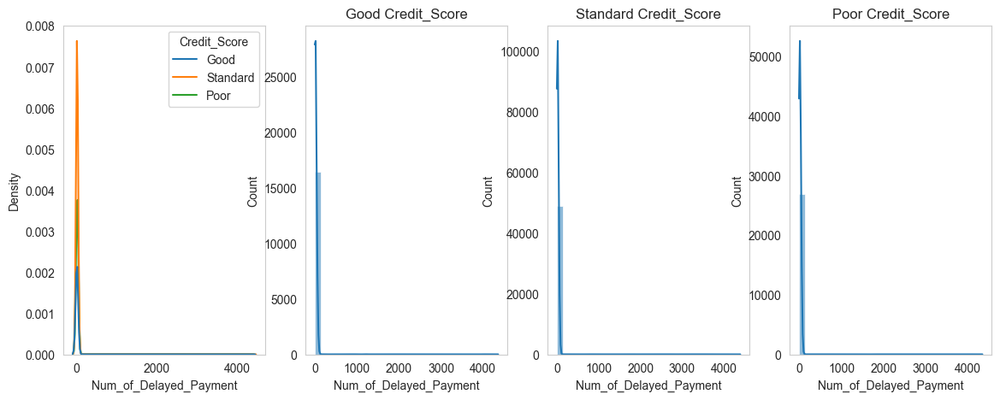

In [107]:
plots_by_categ('Num_of_Delayed_Payment')

In [108]:
iqr_method('Num_of_Delayed_Payment')

[-9.0, 36.0]

The feature Num_of_Delayed_Payment having 7002 Na


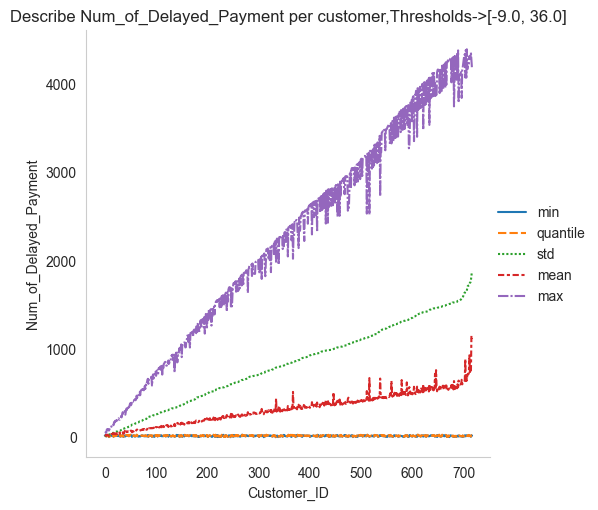

In [109]:
get_indicators_df('Num_of_Delayed_Payment',positive=False,return_egg_plot=True)

In [110]:
get_indicators_df('Num_of_Delayed_Payment',return_df=True).head(2*8)

The feature Num_of_Delayed_Payment having 7002 Na


,Customer_ID,Num_of_Delayed_Payment
8,CUS_0x21b1,4.0
9,CUS_0x21b1,1.0
10,CUS_0x21b1,-1.0
11,CUS_0x21b1,3.0
12,CUS_0x21b1,1.0
13,CUS_0x21b1,0.0
14,CUS_0x21b1,4.0
15,CUS_0x21b1,4.0
248,CUS_0x6048,21.0
249,CUS_0x6048,21.0


Num_of_Delayed_Payment feature represents the average number of payments delayed by a person-> Let's extract the exact num of delayed payments for outlier values, if getting negative number->check if Delay_from_due_date feature also having negative number.

In [111]:
def extract_from_mean(feature,indicators,df=train_df):
    df['Monthly_Delayed_Payment']=None

    for id in tqdm(indicators):
        _=df[df['Customer_ID']==id]
        indexes=_.index.to_list()

        for inst in indexes:
            mean_delayed=_[feature].loc[inst]

            if inst==0 or (inst-7)%8==1:
                df.loc[inst,'Monthly_Delayed_Payment']=mean_delayed
                _.loc[inst,'Monthly_Delayed_Payment']=mean_delayed
                pass
            else:
                per_month=(mean_delayed*(_.loc[:inst].shape[0]))-(_.loc[:inst-1,'Monthly_Delayed_Payment']).sum()
                df.loc[inst,'Monthly_Delayed_Payment']=per_month
                _.loc[inst,'Monthly_Delayed_Payment']=per_month

    return  df

In [112]:
customers_2_drop=extract_from_mean('Num_of_Delayed_Payment',df=get_indicators_df('Num_of_Delayed_Payment',return_df=True,show_features=True,cus_std_threshold=0),indicators=get_indicators_df('Num_of_Delayed_Payment')[1])[['Customer_ID','Monthly_Delayed_Payment','Num_of_Delayed_Payment','Delay_from_due_date']].query('Monthly_Delayed_Payment<0').Customer_ID.unique()

The feature Num_of_Delayed_Payment having 7002 Na
The feature Num_of_Delayed_Payment having 7002 Na


100%|██████████| 1380/1380 [00:02<00:00, 640.07it/s]


In [113]:
customers=pd.Series(get_indicators_df('Num_of_Delayed_Payment')[1])
check_values_df=train_df[train_df.Customer_ID.isin(customers[~customers.isin(customers_2_drop)])][['Customer_ID','Num_of_Delayed_Payment']]
del customers,customers_2_drop

The feature Num_of_Delayed_Payment having 7002 Na


In [114]:
check_values_df.shape[0]/8

76.0

In [115]:
check_values_df.head(8*2)

,Customer_ID,Num_of_Delayed_Payment
800,CUS_0x7250,17.0
801,CUS_0x7250,18.0
802,CUS_0x7250,17.0
803,CUS_0x7250,17.0
804,CUS_0x7250,14.0
805,CUS_0x7250,14.0
806,CUS_0x7250,17.0
807,CUS_0x7250,834.0
1296,CUS_0x54c0,15.0
1297,CUS_0x54c0,16.0


The feature Num_of_Delayed_Payment having 7002 Na


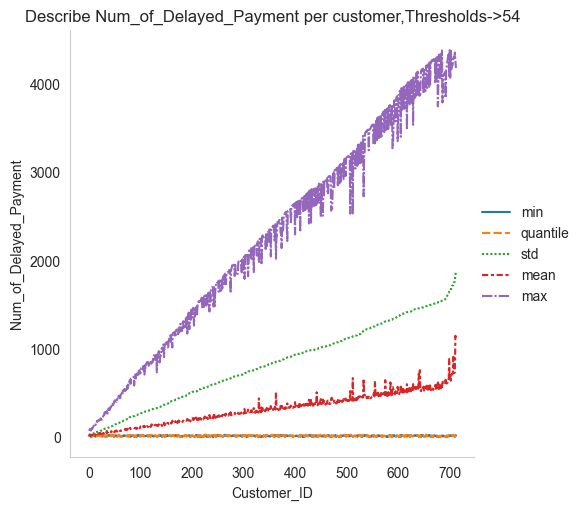

In [116]:
get_indicators_df('Num_of_Delayed_Payment',54,positive=False,return_df=True, return_egg_plot=True)

Conclusion->Set threshold->[0,54]

Adding replace method and indicators for Num_of_Delayed_Payment feature to replace_dict dictionary.

In [117]:
replace_dict_fun('Num_of_Delayed_Payment','linked',thresholds=[0,54],return_na=True,std_threshold=0)

The feature Num_of_Delayed_Payment having 7002 Na


Monthly_Inhand_Salary:

In [118]:
train_df.Monthly_Inhand_Salary.describe()

count    84998.000000
mean      4194.170850
std       3183.686167
min        303.645417
25%       1625.568229
50%       3093.745000
75%       5957.448333
max      15204.633333
Name: Monthly_Inhand_Salary, dtype: float64

The feature Monthly_Inhand_Salary having 15002 Na


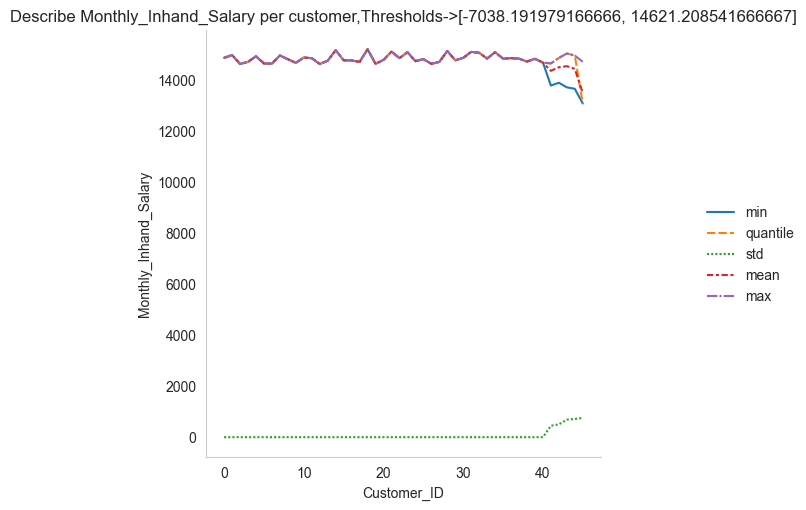

In [119]:
get_indicators_df('Monthly_Inhand_Salary',return_egg_plot=True)

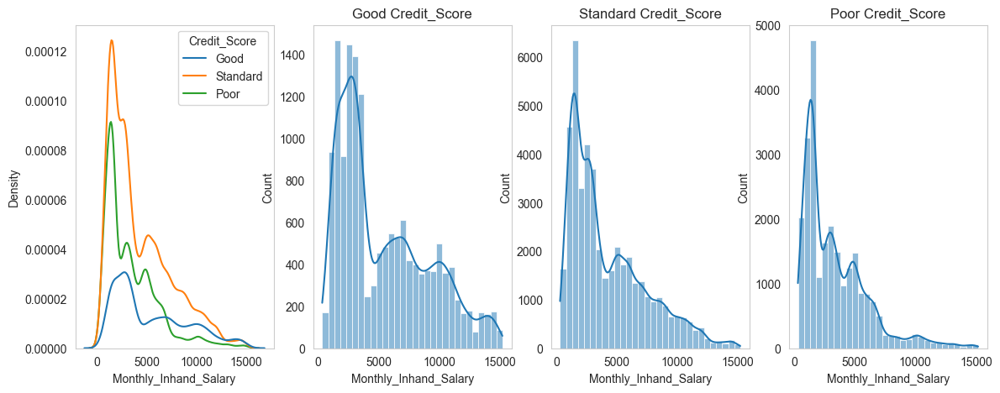

In [120]:
plots_by_categ('Monthly_Inhand_Salary')

Adding replace method and indicators for Annual_Income feature to replace_dict dictionary.


In [121]:
'''Replace only na'''
replace_dict_fun('Monthly_Inhand_Salary','mode',only_na=True)

The feature Monthly_Inhand_Salary having 15002 Na


Num_Credit_Inquiries Feature:

In [122]:
train_df.Num_Credit_Inquiries.describe()

count    98035.000000
mean        27.754251
std        193.177339
min          0.000000
25%          3.000000
50%          6.000000
75%          9.000000
max       2597.000000
Name: Num_Credit_Inquiries, dtype: float64

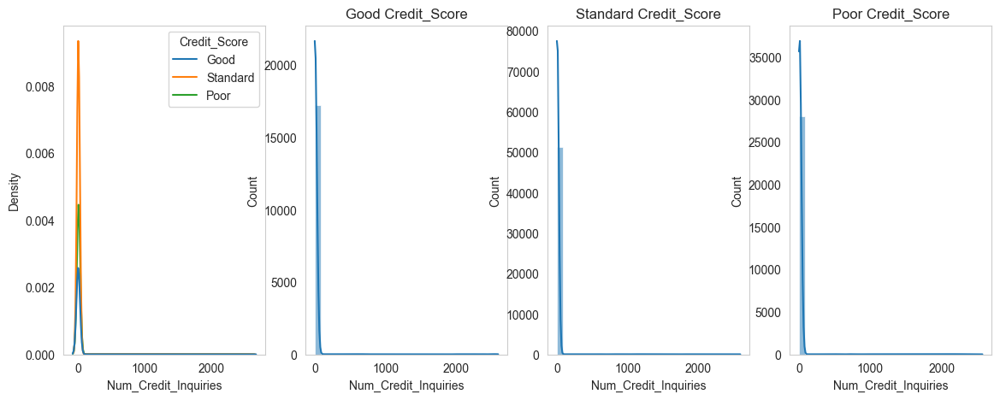

In [123]:
plots_by_categ('Num_Credit_Inquiries')

In [124]:
iqr_method('Num_Credit_Inquiries')

[-9.0, 21.0]

In [125]:
get_indicators_df('Num_Credit_Inquiries',show_features=['Customer_ID','Age','Num_Credit_Inquiries','Month','Num_Credit_Card','Annual_Income','Credit_Score'],return_df=True,cus_std_threshold=0).head(8*2)

The feature Num_Credit_Inquiries having 1965 Na


,Customer_ID,Age,Num_Credit_Inquiries,Month,Num_Credit_Card,Annual_Income,Credit_Score
168,CUS_0xa16e,41,6.0,January,5,10183.014648,Poor
169,CUS_0xa16e,41,6.0,February,5,10183.014648,Poor
170,CUS_0xa16e,41,6.0,March,5,10183.014648,Poor
171,CUS_0xa16e,41,6.0,April,5,10183.014648,Standard
172,CUS_0xa16e,41,6.0,May,5,10183.014648,Poor
173,CUS_0xa16e,42,1050.0,June,5,10183.014648,Poor
174,CUS_0xa16e,42,6.0,July,5,10183.014648,Poor
175,CUS_0xa16e,42,6.0,August,5,10183.014648,Poor
192,CUS_0xa5f9,34,12.0,January,8,57983.121094,Poor
193,CUS_0xa5f9,34,1044.0,February,8,57983.121094,Standard


Num_Credit_Inquiries feature having high values that are illogic, to prove it let's take for example row 173 in the table above in June the Num Credit Inquiries value is 1050, but in July the value is 6-> 1050, not logic because the value in June needs to be including in July.
I will write a function that will check the value for the following months to outliers indicator.
For the value in August, I need to know the value in September->will check the test data.

The feature Num_Credit_Inquiries having 1965 Na


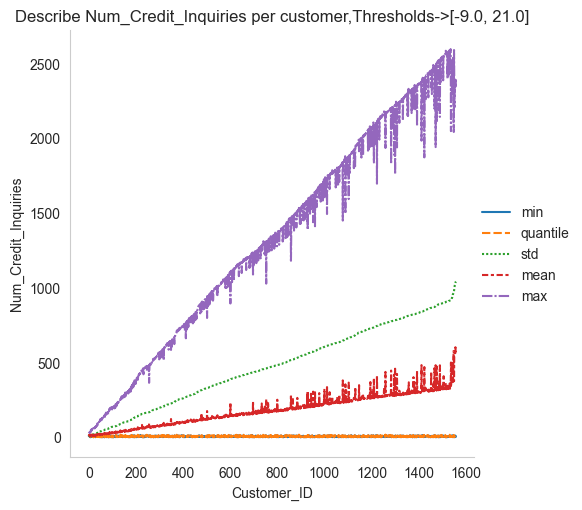

In [126]:
get_indicators_df('Num_Credit_Inquiries',return_egg_plot=True)

In [127]:
# Not including Na.
ins=get_indicators_df('Num_Credit_Inquiries',cus_std_threshold=0)[0]
_=train_df.loc[ins,['Customer_ID','Num_Credit_Inquiries']][train_df.loc[ins,'Month']=='August']

The feature Num_Credit_Inquiries having 1965 Na


In [128]:
customer_indicator=_.Customer_ID.to_list()

_[test_df.query(f"Month=='September' and Customer_ID.isin({customer_indicator})").Num_Credit_Inquiries.to_numpy()>=_.Num_Credit_Inquiries.to_numpy()]

,Customer_ID,Num_Credit_Inquiries
6751,CUS_0x1437,946.0


In [129]:
del customer_indicator,ins

In [130]:
test_df.loc[:,['Customer_ID','Month','Num_Credit_Inquiries']][test_df.Customer_ID==_.loc[6751,:].Customer_ID]

,Customer_ID,Month,Num_Credit_Inquiries
3372,CUS_0x1437,September,1784.0
3373,CUS_0x1437,October,5.0
3374,CUS_0x1437,November,5.0
3375,CUS_0x1437,December,5.0


The table above shows that the value is illogic.
This explored can do with other techniques per customer, e.g. mode, mean, and etc.

Adding replace method and indicators for Annual_Income feature to replace_dict dictionary.

In [131]:
replace_dict_fun('Num_Credit_Inquiries','linked',return_na=True,std_threshold=0)

The feature Num_Credit_Inquiries having 1965 Na


Total_EMI_per_month:

In [132]:
train_df.Total_EMI_per_month.describe()

count    100000.000000
mean       1403.118217
std        8306.041270
min           0.000000
25%          30.306660
50%          69.249473
75%         161.224249
max       82331.000000
Name: Total_EMI_per_month, dtype: float64

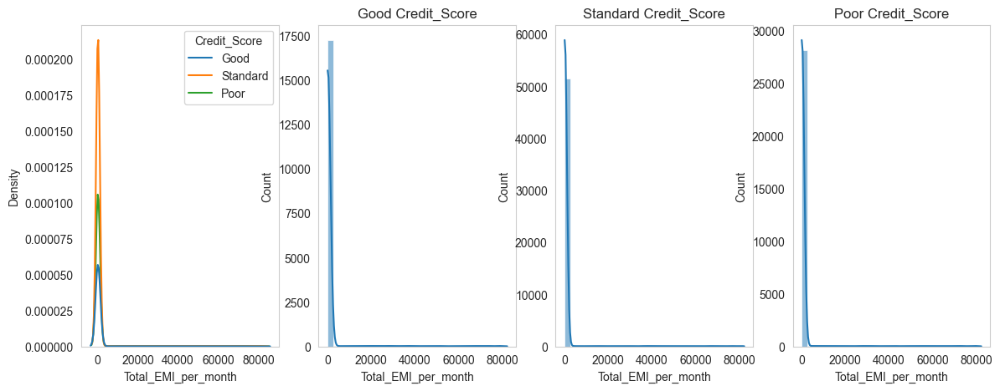

In [133]:
plots_by_categ('Total_EMI_per_month')

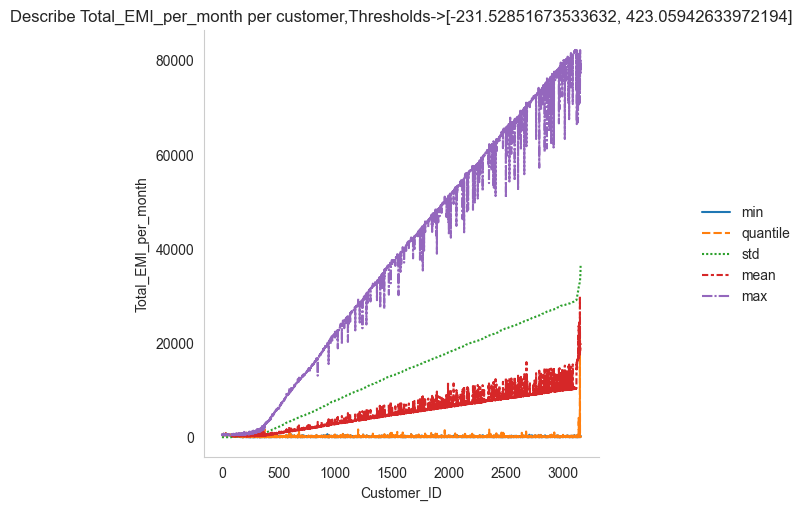

In [134]:
get_indicators_df('Total_EMI_per_month',return_egg_plot=True)

In [135]:
iqr_method('Total_EMI_per_month')

[-231.52851673533632, 423.05942633972194]

In [136]:
describe_per_id('Total_EMI_per_month',df=get_indicators_df('Total_EMI_per_month',[0,1000],return_df=True)).query('std>1000').head()

,min,quantile,std,mean,max
113,216.795424,216.795424,1000.274870,570.445996,3046.0
114,0.000000,0.000000,1007.980717,356.375000,2851.0
115,234.439214,234.439214,1008.532538,591.009312,3087.0
116,303.847259,303.847259,1015.812893,662.991351,3177.0
117,106.642528,106.642528,1021.542131,467.812212,2996.0


In [137]:
emi_df_check=get_indicators_df('Total_EMI_per_month',[2,2000],cus_std_threshold=300,return_df=True,show_features=True)

emi_df_check.head(8*2)

,Customer_ID,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
40,CUS_0x95ee,January,31,Lawyer,7.392846e+04,NaN,4,1288,8,0.0,NaN,12,10.0,10.14,2.0,Good,548.200012,39.962685,NaN,No,15015.000000,98.674408,High_spent_Large_value_payments,740.196106,Good
41,CUS_0x95ee,February,31,NaN,7.392846e+04,5988.705000,4,5,8,0.0,NaN,8,7.0,10.14,2.0,Good,548.200012,42.769864,384.0,NM,0.000000,172.939209,Low_spent_Medium_value_payments,705.931274,Good
42,CUS_0x95ee,March,31,Lawyer,7.392846e+04,5988.705000,4,5,8,0.0,NaN,8,7.0,10.14,2.0,Good,548.200012,40.712187,NaN,No,0.000000,150.059738,High_spent_Medium_value_payments,698.810791,Good
43,CUS_0x95ee,April,31,Lawyer,7.392846e+04,5988.705000,4,5,8,0.0,NaN,8,7.0,10.14,2.0,Good,548.200012,30.201658,386.0,No,0.000000,618.202393,Low_spent_Small_value_payments,270.668121,Good
44,CUS_0x95ee,May,31,Lawyer,7.392846e+04,5988.705000,4,5,5318,0.0,NaN,11,7.0,10.14,2.0,NaN,548.200012,26.333310,387.0,No,0.000000,177.951843,Low_spent_Large_value_payments,690.918640,Good
45,CUS_0x95ee,June,31,Lawyer,7.392846e+04,5988.705000,4,5,8,0.0,NaN,7,7.0,10.14,2.0,Good,548.200012,35.275437,NaN,No,15515.000000,235.790329,Low_spent_Large_value_payments,633.080200,Good
46,CUS_0x95ee,July,31,Lawyer,7.392846e+04,5988.705000,4,5,8,0.0,NaN,8,4.0,9.14,2.0,NaN,548.200012,36.624791,389.0,No,0.000000,348.509399,High_spent_Small_value_payments,510.361115,Standard
47,CUS_0x95ee,August,31,Lawyer,7.392846e+04,5988.705000,4,5,8,0.0,NaN,8,7.0,10.14,NaN,Good,548.200012,31.580990,390.0,No,0.000000,42.635590,NaN,796.234924,Good
48,CUS_0x284a,January,33,Lawyer,1.313134e+05,11242.783333,0,1,8,2.0,"Credit-Builder Loan, Mortgage Loan",0,3.0,9.34,2.0,Good,352.160004,32.200509,367.0,NM,137.644605,378.171265,High_spent_Medium_value_payments,858.462463,Good
49,CUS_0x284a,February,34,Lawyer,1.313134e+05,11242.783333,0,1,8,2.0,"Credit-Builder Loan, Mortgage Loan",-1,2.0,15.34,4.0,Good,352.160004,31.983710,368.0,No,137.644605,698.873291,High_spent_Small_value_payments,547.760437,Good


In [138]:
check_ime=check_gaps('Total_EMI_per_month',1000,back_forward=True)

100%|██████████| 12500/12500 [00:41<00:00, 300.91it/s]


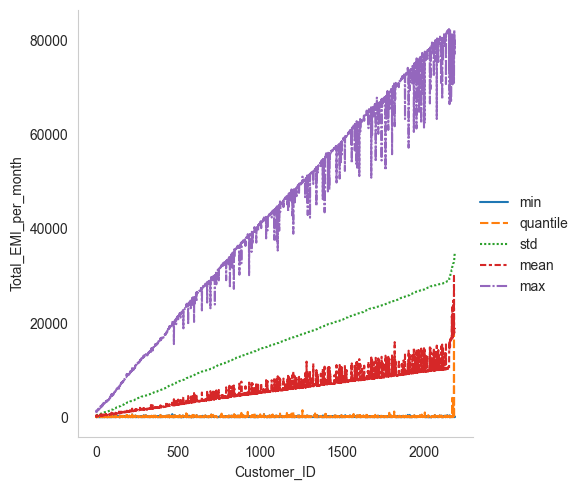

In [139]:
describe_per_id('Total_EMI_per_month',df=train_df.query(f'Customer_ID.isin({list(check_ime)})'),plot=True)

In [140]:
describe_per_id('Total_EMI_per_month',df=train_df.query(f'Customer_ID.isin({list(check_ime.keys())})'))['max'].min()

1064.0

In [141]:
train_df.query(f'Customer_ID.isin({list(check_ime)})')[['Customer_ID','Num_of_Loan','Total_EMI_per_month','Num_Credit_Card','Num_Bank_Accounts']].query('Num_of_Loan==0 & Num_Credit_Card==0')

,Customer_ID,Num_of_Loan,Total_EMI_per_month,Num_Credit_Card,Num_Bank_Accounts


EMI=Loan_amount*Interest_Rate*(1+Interest_Rate)*tenure_in_num_of_month/((1+Interest_Rate)*tenure_in_num_of_month-1)
But it also can refer to a credit card payment transaction.->not changing the values.

In [142]:
# def change_ime(ime_to_check):
#
#     _1,_2=get_indicators_df('Total_EMI_per_month',thresholds=[0,1062],df=train_df.query(f'Customer_ID.isin({ime_to_check})'))
#     replace_dict['Total_EMI_per_month']=[[_1,_2],'linked']
#
# # check_ime(check_ime.keys())
#
# del check_ime

Outstanding_Debt:

In [143]:
train_df.Outstanding_Debt.describe()

count    100000.000000
mean       1426.220337
std        1155.129028
min           0.230000
25%         566.072510
50%        1166.154968
75%        1945.962555
max        4998.069824
Name: Outstanding_Debt, dtype: float64

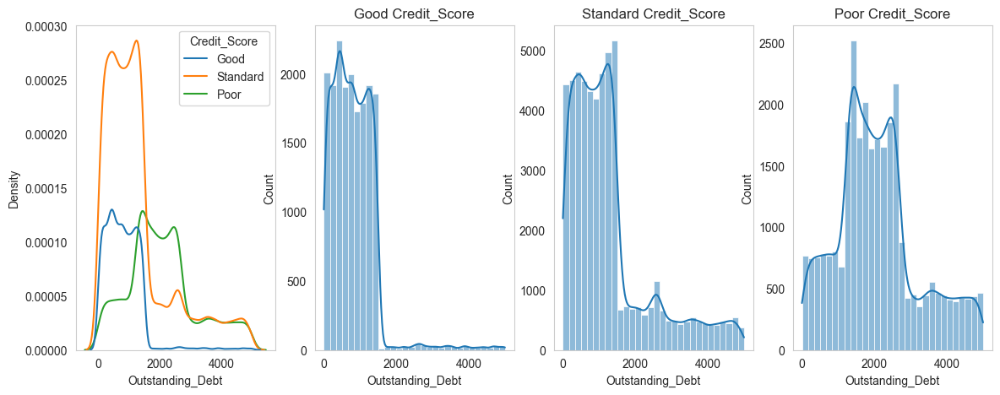

In [144]:
plots_by_categ('Outstanding_Debt')

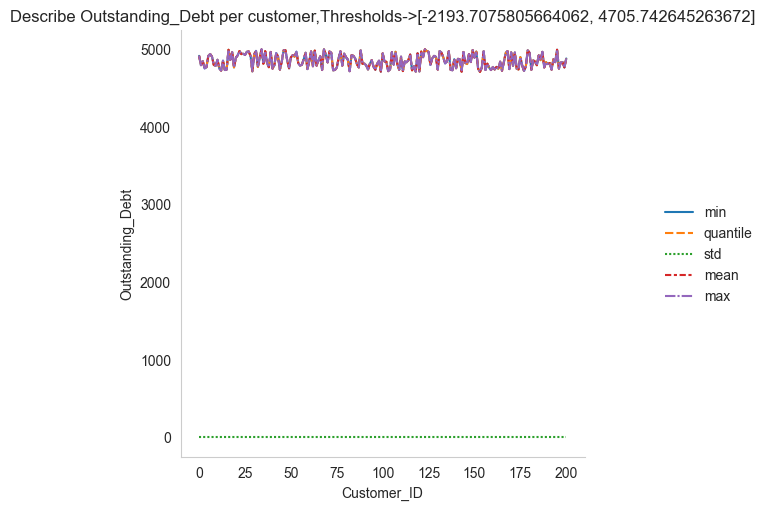

In [145]:
get_indicators_df('Outstanding_Debt',return_egg_plot=True)

Credit_Utilization_Ratio:

In [146]:
train_df.Credit_Utilization_Ratio.describe()

count    100000.000000
mean         32.285173
std           5.116875
min          20.000000
25%          28.052567
50%          32.305784
75%          36.496663
max          50.000000
Name: Credit_Utilization_Ratio, dtype: float64

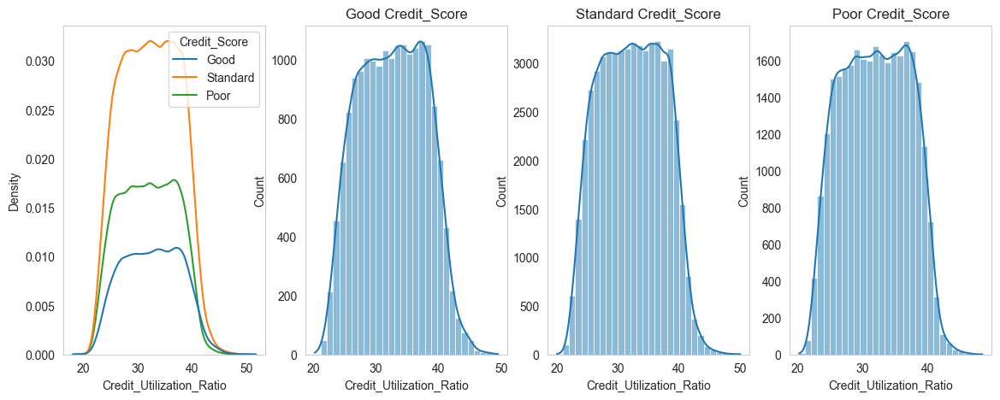

In [147]:
plots_by_categ('Credit_Utilization_Ratio')

Amount_invested_monthly:

In [148]:
train_df.Amount_invested_monthly.describe()

count    95521.000000
mean       637.413025
std       2043.319336
min          0.000000
25%         74.534004
50%        135.925674
75%        265.731720
max      10000.000000
Name: Amount_invested_monthly, dtype: float64

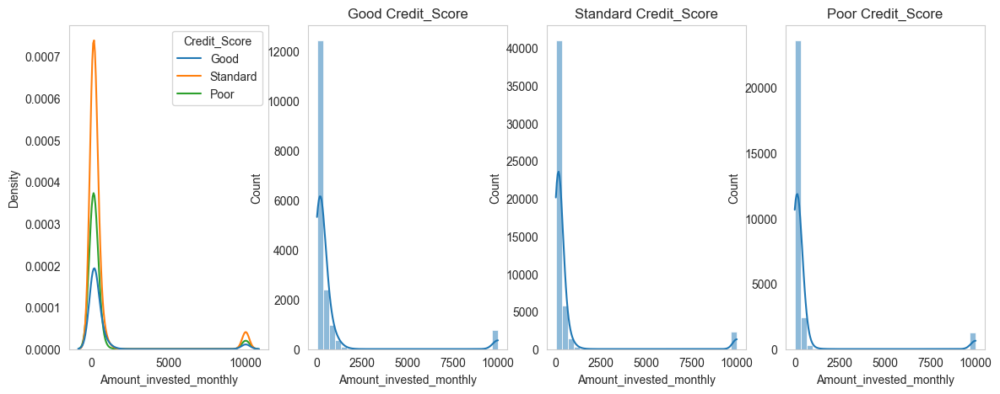

In [149]:
plots_by_categ('Amount_invested_monthly')


In [150]:
iqr_method('Amount_invested_monthly')

[-307.86144256591797, 648.1271667480469]

In [151]:
get_indicators_df('Amount_invested_monthly',return_df=True,cus_std_threshold=0).head(8*2)

The feature Amount_invested_monthly having 4479 Na


,Customer_ID,Amount_invested_monthly
16,CUS_0x2dbc,168.413696
17,CUS_0x2dbc,232.860382
18,CUS_0x2dbc,10000.000000
19,CUS_0x2dbc,825.216248
20,CUS_0x2dbc,430.947540
21,CUS_0x2dbc,257.808105
22,CUS_0x2dbc,263.174164
23,CUS_0x2dbc,10000.000000
24,CUS_0xb891,81.228859
25,CUS_0xb891,124.881821


In [152]:
get_indicators_df('Amount_invested_monthly',show_features=['Customer_ID','Amount_invested_monthly','Month'],thresholds=[9999,10001],return_df=True,spectrum=True,cus_std_threshold=0).head(2*8)

The feature Amount_invested_monthly having 4479 Na


,Customer_ID,Amount_invested_monthly,Month
16,CUS_0x2dbc,168.413696,January
17,CUS_0x2dbc,232.860382,February
18,CUS_0x2dbc,10000.000000,March
19,CUS_0x2dbc,825.216248,April
20,CUS_0x2dbc,430.947540,May
21,CUS_0x2dbc,257.808105,June
22,CUS_0x2dbc,263.174164,July
23,CUS_0x2dbc,10000.000000,August
24,CUS_0xb891,81.228859,January
25,CUS_0xb891,124.881821,February


I noticed that 10000.00000 it's a typing mistake, I saw that pattern in EMI end with .000000
This pattern can find with regex.

The feature Amount_invested_monthly having 4479 Na


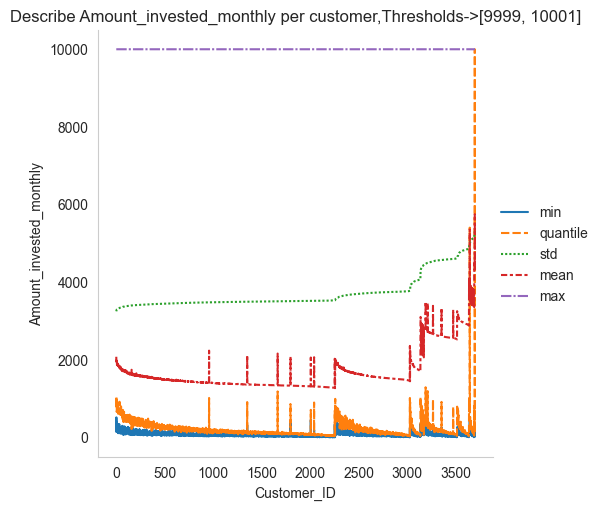

In [153]:
get_indicators_df('Amount_invested_monthly',thresholds=[9999,10001],spectrum=True,return_egg_plot=True)

In [154]:
_=get_indicators_df('Amount_invested_monthly',return_df=True,return_na=True,cus_std_threshold=0).query('Amount_invested_monthly==10000| Amount_invested_monthly.isna()')

The feature Amount_invested_monthly having 4479 Na



Adding replace method and indicators for Amount_invested_monthly feature to replace_dict dictionary.

In [155]:
replace_dict['Amount_invested_monthly']=[[_.index.tolist(),_.Customer_ID.to_list()],'mean']

Monthly_Balance:

In [156]:
train_df.Monthly_Balance.describe()

count    9.880000e+04
mean    -3.036437e+22
std               inf
min     -3.333333e+26
25%      2.700922e+02
50%      3.367192e+02
75%      4.702202e+02
max      1.602041e+03
Name: Monthly_Balance, dtype: float64

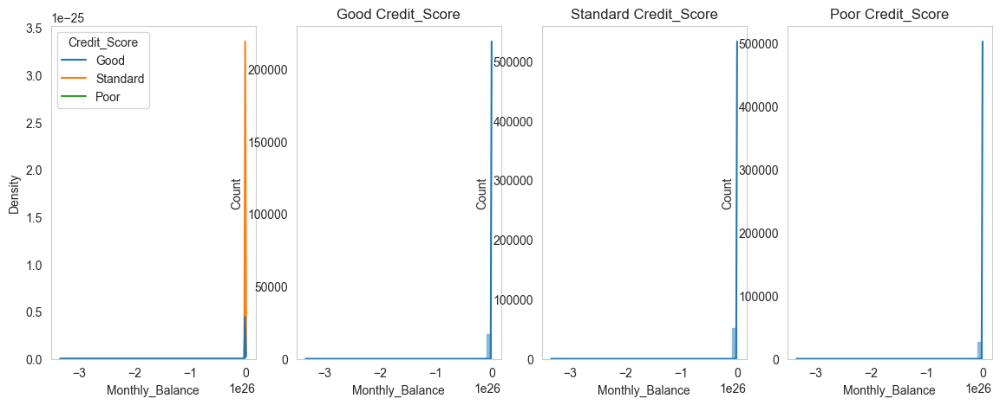

In [157]:
plots_by_categ('Monthly_Balance')

In [158]:
iqr_method('Monthly_Balance')

[-130.1636962890625, 870.4761047363281]

The feature Monthly_Balance having 1200 Na


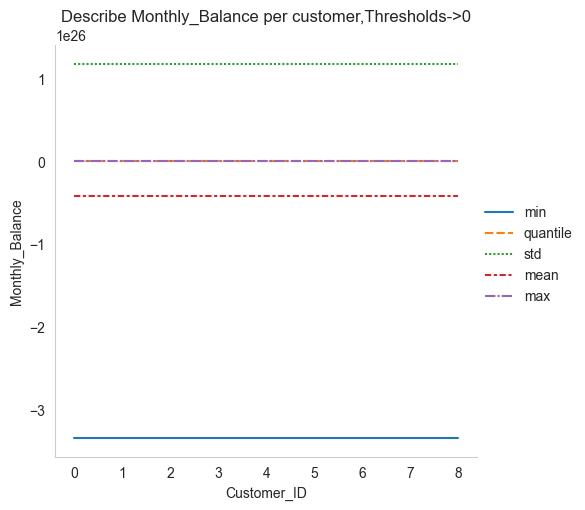

In [159]:
get_indicators_df('Monthly_Balance',0,return_egg_plot=True,cus_std_threshold=0)

In [160]:
get_indicators_df('Monthly_Balance',0,return_df=True,cus_std_threshold=0).head(2*8)

The feature Monthly_Balance having 1200 Na


,Customer_ID,Monthly_Balance
5544,CUS_0x9885,4.233968e+02
5545,CUS_0x9885,-3.333333e+26
5546,CUS_0x9885,2.784116e+02
5547,CUS_0x9885,4.205569e+02
5548,CUS_0x9885,7.128786e+01
5549,CUS_0x9885,3.832839e+02
5550,CUS_0x9885,2.290070e+02
5551,CUS_0x9885,3.740311e+02
26176,CUS_0x5a90,3.672895e+02
26177,CUS_0x5a90,-3.333333e+26


In [161]:
train_df.query('Monthly_Balance<0').Monthly_Balance.value_counts()

-3.333333e+26    9
Name: Monthly_Balance, dtype: int64

The Value -3.333333e+26 it's a pattern mistake-> I will replace the negative values.


Adding replace method and indicators for Monthly_Balance feature to replace_dict dictionary.

In [162]:
replace_dict_fun('Monthly_Balance','mean',thresholds=0,return_na=True,std_threshold=0)

The feature Monthly_Balance having 1200 Na


Credit_Mix:

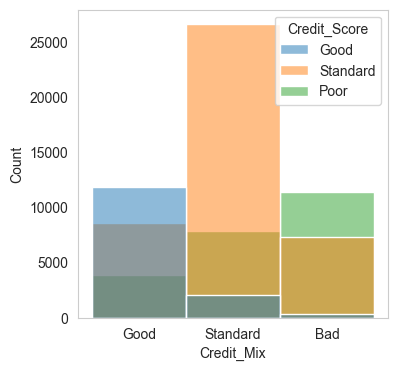

In [163]:
plots_by_categ('Credit_Mix',multi_class=False)

In [164]:
train_df.Credit_Mix.isna().sum()

20195

Fill Na


Adding replace method and indicators for Credit_Mix feature to replace_dict dictionary.

In [165]:
replace_dict_fun('Credit_Mix','mode',only_na=True)

The feature Credit_Mix having 20195 Na


Changed_Credit_Limit:


In [166]:
train_df.Changed_Credit_Limit.describe()

count    97909.000000
mean        10.389025
std          6.789496
min         -6.490000
25%          5.320000
50%          9.400000
75%         14.870000
max         36.970001
Name: Changed_Credit_Limit, dtype: float64

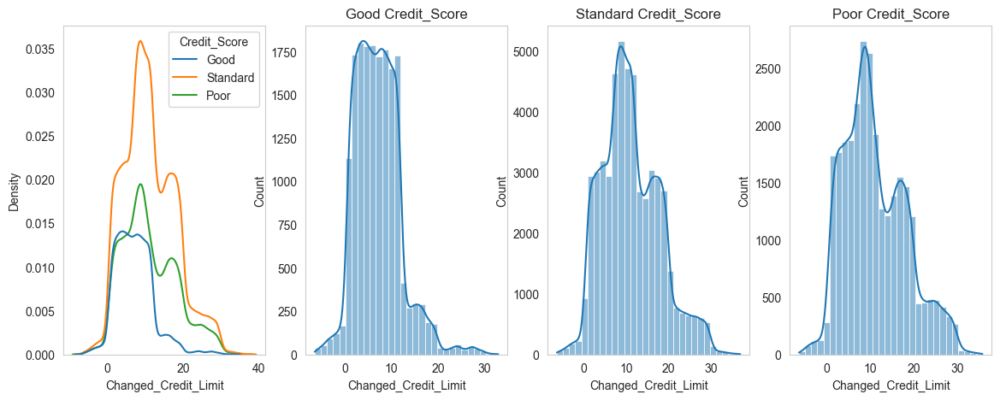

In [167]:
plots_by_categ('Changed_Credit_Limit')

The feature Changed_Credit_Limit having 2091 Na


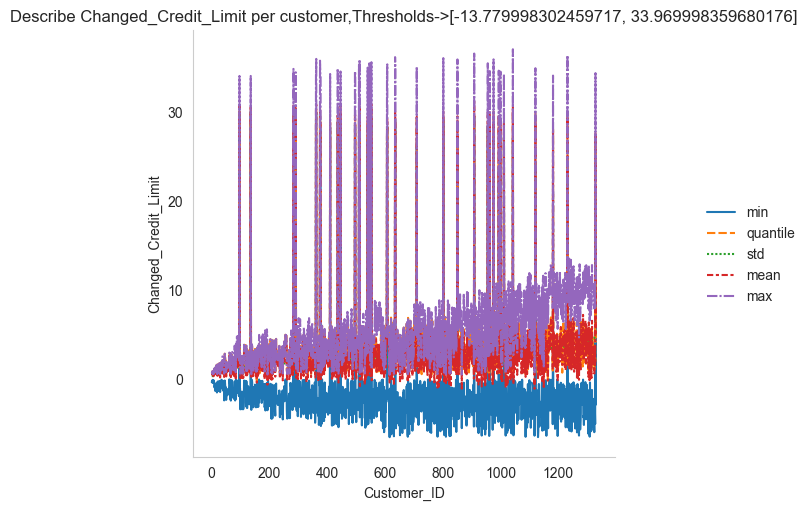

In [168]:
get_indicators_df('Changed_Credit_Limit',return_egg_plot=True)

Adding replace method and indicators for Changed_Credit_Limit feature to replace_dict dictionary.


In [169]:
# Just Na indicator
replace_dict_fun('Changed_Credit_Limit','linked',only_na=True,std_threshold=0)

The feature Changed_Credit_Limit having 2091 Na


Credit_History_Age:

In [170]:
train_df.Credit_History_Age.describe()

count    90970.000000
mean       221.195405
std         99.741364
min          1.000000
25%        144.000000
50%        219.000000
75%        302.000000
max        404.000000
Name: Credit_History_Age, dtype: float64

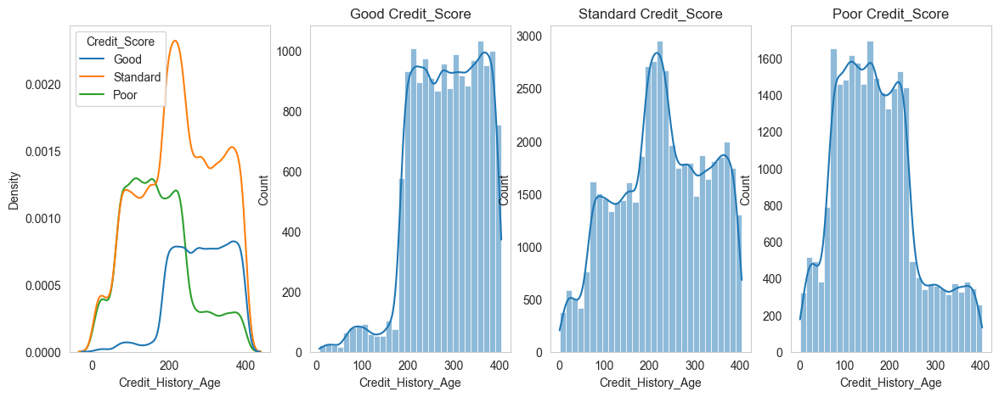

In [171]:
plots_by_categ('Credit_History_Age')

In [172]:
get_indicators_df('Credit_History_Age',return_df=True)

The feature Credit_History_Age having 9030 Na


,Customer_ID,Credit_History_Age


Filling Na in Credit_History_Age

In [173]:
na_instances = train_df.index[train_df.Credit_History_Age.isnull()]
df_values = train_df.loc[:, ['Credit_History_Age', 'Customer_ID']].drop(na_instances, axis=0)

id = None
min_index = None

for i in tqdm(na_instances):
    id = train_df.loc[i, 'Customer_ID']
    min_index = \
        df_values[df_values.Customer_ID == id].sort_values('Credit_History_Age').index[0]
    train_df.loc[i, 'Credit_History_Age'] = (i - min_index) + df_values.loc[
        min_index, 'Credit_History_Age']

del na_instances,df_values,min_index,id

100%|██████████| 9030/9030 [00:27<00:00, 325.78it/s]


Checking the gaps after replace

In [174]:
check_gaps('Credit_History_Age',1,df=train_df)

100%|██████████| 12500/12500 [00:41<00:00, 300.42it/s]

All gaps between the Consecutive instances per Customer_ID are lower than 1 for Credit_History_Age feature.🤓


Adding replace method and indicators for Payment_Behaviour feature to replace_dict dictionary.


In [175]:
replace_dict_fun('Payment_Behaviour','mode',only_na=True,std_threshold=0)

The feature Payment_Behaviour having 7600 Na



Creating a class with Multi-Method  that will replace|fill values using.

In [176]:
class Fill_invalid_values:
    def __init__(self, df=None, feature_2_fill=None, indicator_feature=None, indicators=None, fill_insta=None,method=None):
        self.df = df
        self.feature_2_fill = feature_2_fill
        self.indicator_feature = indicator_feature
        self.indicators = indicators
        self.fill_insta = fill_insta
        self.method = method


    # '''The Lower_upper_lim method will reduce time complexity and check if backward fill is possible'''
    def lower_upper_lim(self, inst):
        lower = inst - inst % 8
        upper = (inst + 7 - inst % 8)

        return lower, upper

    def customer_split(self, customer_id, low, upp):
        # Insert [self.df.loc[low:upp,self.indicator_feature]==customer_id] to double check.
        _ = self.df.drop(self.fill_insta).loc[low:upp, self.feature_2_fill][
            self.df.loc[low:upp, self.indicator_feature] == customer_id]
        return _

    def replace_invalid_values(self):
        n=None
        for indicator, instance in tqdm(zip(self.indicators, self.fill_insta)):
            lower, upper = self.lower_upper_lim(instance)
            customer_df = self.customer_split(indicator, lower, upper)
            if customer_df.shape[0]<=instance%8:
                n=-1
            else:
                n=instance%8
            if self.method == 'linked':
                self.df.loc[instance, self.feature_2_fill] = customer_df.iloc[n]
            elif self.method == 'mode':
                self.df.loc[instance, self.feature_2_fill] = customer_df.mode().iloc[0]
            elif self.method == 'mean':
                self.df.loc[instance, self.feature_2_fill] = customer_df.mean()
            else:
                return print(f'for {self.feature_2_fill} not set valid method')
        return self.df

Replace\filling values

In [177]:
for feature in replace_dict.keys():
    fill=Fill_invalid_values(df=train_df,feature_2_fill=feature,indicator_feature='Customer_ID',indicators=replace_dict[feature][0][1],fill_insta=replace_dict[feature][0][0],method=replace_dict[feature][1])
    fill.replace_invalid_values()

1315it [00:13, 99.15it/s] 
14124it [02:27, 96.00it/s] 
2781it [00:28, 98.44it/s] 
2271it [00:22, 99.47it/s] 
2034it [00:20, 98.49it/s] 
993it [00:10, 98.62it/s] 
8378it [01:23, 100.92it/s]
15002it [02:29, 100.16it/s]
3615it [00:36, 99.51it/s] 
8784it [01:27, 100.28it/s]
1209it [00:12, 97.81it/s] 
20195it [03:22, 99.57it/s] 
2091it [00:21, 99.08it/s] 
7600it [01:16, 98.83it/s] 


Check na values

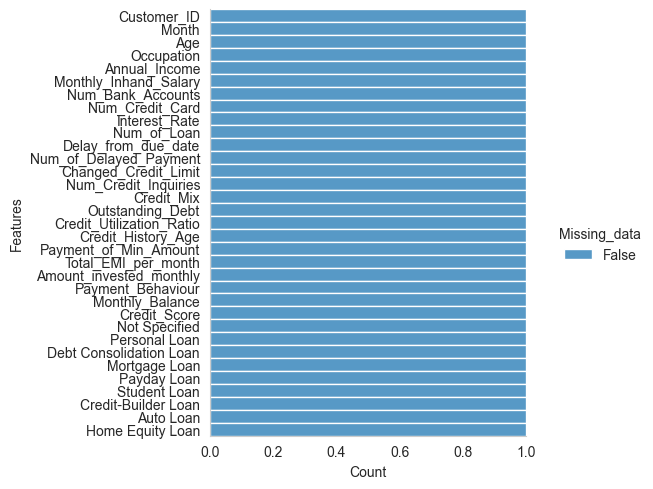

In [178]:
na_ratio_plot(train_df)

In [179]:
train_df.isna().sum().sum()==0

True

Converting columns dtypes

In [180]:
train_df.loc[:,'Auto Loan':].astype(np.int32)
convert_to_int=['Credit_History_Age','Num_Credit_Inquiries','Num_of_Delayed_Payment','Num_of_Loan']
train_df.loc[:,'Auto Loan':]=train_df.loc[:,'Auto Loan':].astype(np.int32)
train_df.loc[:,convert_to_int]=train_df.loc[:,convert_to_int].astype(np.int32)
del convert_to_int

In [181]:
train_df.head()

,Customer_ID,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Not Specified,Personal Loan,Debt Consolidation Loan,Mortgage Loan,Payday Loan,Student Loan,Credit-Builder Loan,Auto Loan,Home Equity Loan
0,CUS_0xd40,January,23,Scientist,19114.119141,1824.843333,3,4,3,4,3,7,11.27,4,Good,809.97998,26.822620,265,No,49.574949,80.415298,High_spent_Small_value_payments,312.494080,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,1
1,CUS_0xd40,February,23,Scientist,19114.119141,1824.843333,3,4,3,4,-1,7,11.27,4,Good,809.97998,31.944960,266,No,49.574949,118.280220,Low_spent_Large_value_payments,284.629150,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,1
2,CUS_0xd40,March,23,Scientist,19114.119141,1824.843333,3,4,3,4,3,7,6.27,4,Good,809.97998,28.609352,267,No,49.574949,81.699524,Low_spent_Medium_value_payments,331.209869,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,1
3,CUS_0xd40,April,23,Scientist,19114.119141,1824.843333,3,4,3,4,5,4,6.27,4,Good,809.97998,31.377862,268,No,49.574949,199.458069,Low_spent_Small_value_payments,223.451309,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,1
4,CUS_0xd40,May,23,Scientist,19114.119141,1824.843333,3,4,3,4,6,8,11.27,4,Good,809.97998,24.797347,269,No,49.574949,41.420155,High_spent_Medium_value_payments,341.489227,Good,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,1


In [182]:
train_df.to_csv('done_train_df.csv',index=False)

Drop irrelevant features and encode object type features

In [123]:
train_df=pd.read_csv('done_train_df.csv')

Dropping irrelevant feature->Customer_ID

In [124]:
train_df.drop('Customer_ID',axis=1, inplace=True)

Creating a function that returns visualization of the feature(target) attribute ratio per another feature attribute.

In [185]:
def cat_score_ratio(df=None,feature=None,target=None,sort_by=None,show=True,per_feature_att=True):
    group_att_scores_ratio_df=df[[target,feature]].groupby(feature,group_keys=False).apply(lambda x: (x.value_counts()/x.value_counts().sum())*100).sort_values().rename(f'{target} Ratio')
    att_scores_ratio_df=pd.DataFrame()
    fig=None
    ax=None
    for n_att,att in enumerate(df[feature].unique()):
        if n_att>1:
            att_scores_ratio_df=pd.concat([att_scores_ratio_df,_3],axis=0)
        _3=pd.DataFrame()

        for i,score in enumerate(df[target].unique()):
            _4=(df.query(f"{target}=='{score}'").query(f"{feature}=='{att}'").shape[0])/(df.query(f"{feature}=='{att}'").shape[0])*100
            if n_att==0:
                if i==0:
                    att_scores_ratio_df[feature]=[att]
                att_scores_ratio_df[f'{score}']=[_4]
            else:
                if i==0:
                    _3[feature]=[att]
                _3[f'{score}']=[_4]
    if show:

        if per_feature_att:
            att_scores_ratio_df.set_index(feature,inplace=True)
            n_rows=int(np.ceil( group_att_scores_ratio_df.index.get_level_values(target).nunique()/4))
            n_columns=4
            fig,ax=plt.subplots(nrows=n_rows,ncols=n_columns,figsize=[20,6],gridspec_kw={'wspace':1.3,'hspace':0.7})
            plt.suptitle(f'{feature} {target}s ratio (%)\n(Ascending order)',fontsize=15,y=1)
            _2=1

            for n,att in enumerate( group_att_scores_ratio_df.index.get_level_values(target).unique()):
                k,j=divmod(_2,n_columns)
                _1= group_att_scores_ratio_df.loc[ group_att_scores_ratio_df.index.get_level_values(target)==att]

                if  group_att_scores_ratio_df.index.get_level_values(target).nunique()<5:
                    _1.plot(kind='barh',grid=False,ax=ax[j],title=f'{att} {target} Ratio (%)',rot=45)
                else:
                    _1.plot(kind='barh',grid=False,ax=ax[k,j],title=f'{att} {target} Ratio (%)',rot=45)
                _2+=1

            if  group_att_scores_ratio_df.index.get_level_values(target).nunique()<5:
                att_scores_ratio_df.sort_values(sort_by,ascending=True).plot(kind='barh',stacked=True,title=f'{target}s ratio per {feature}\n(Ascending order by {sort_by} {target})',ax=ax[0],rot=45)
            else:
                att_scores_ratio_df.sort_values(sort_by,ascending=True).plot(kind='bar',stacked=True,title=f'{target}s ratio (%) per {feature}\n(Ascending order by {sort_by} {target})',ax=ax[0,0],rot=45)


    else:
        return att_scores_ratio_df

[None, None, None, None, None]

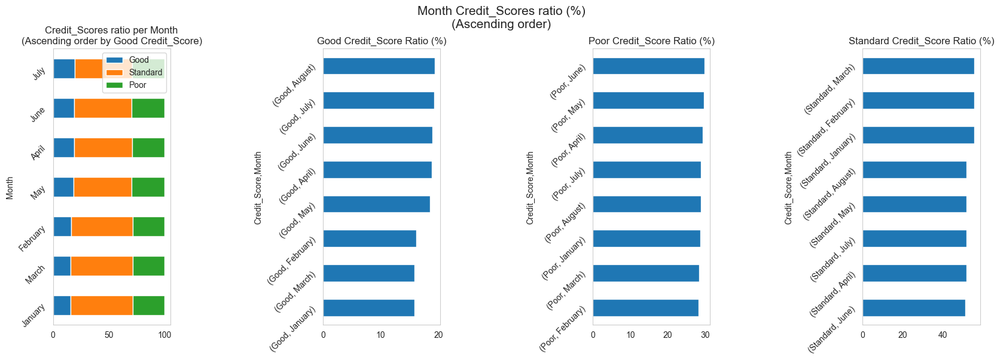

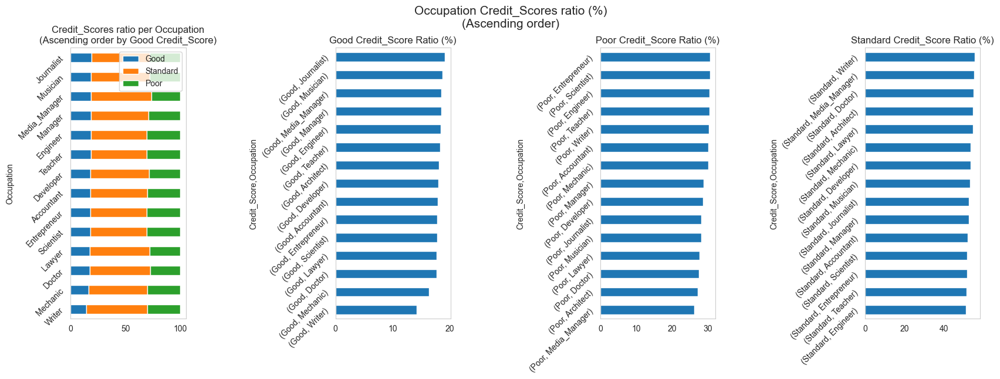

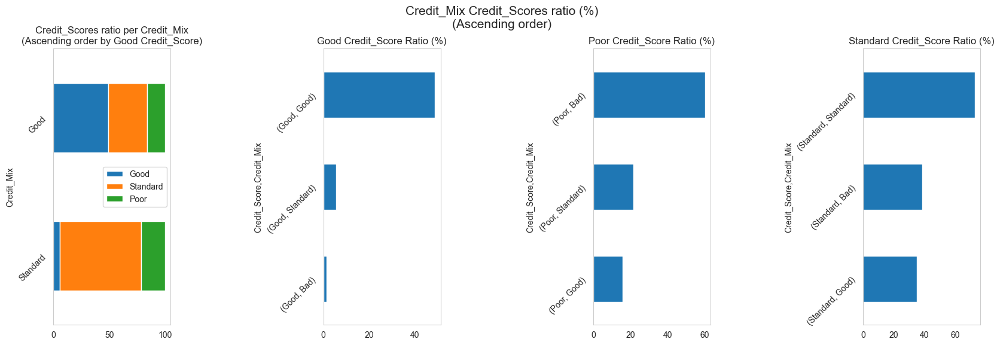

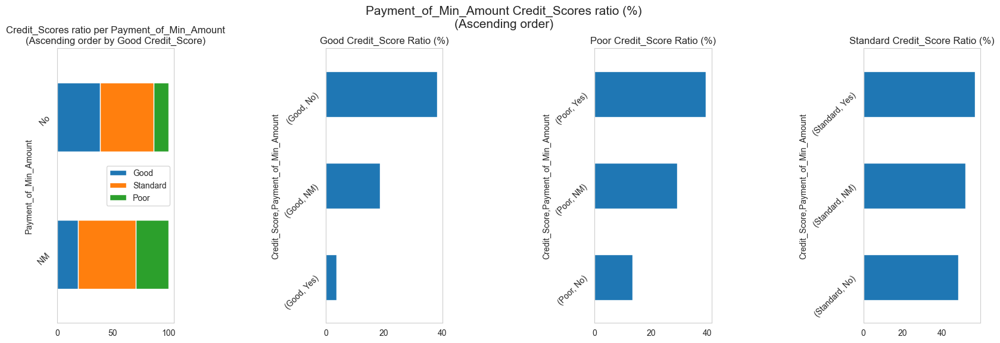

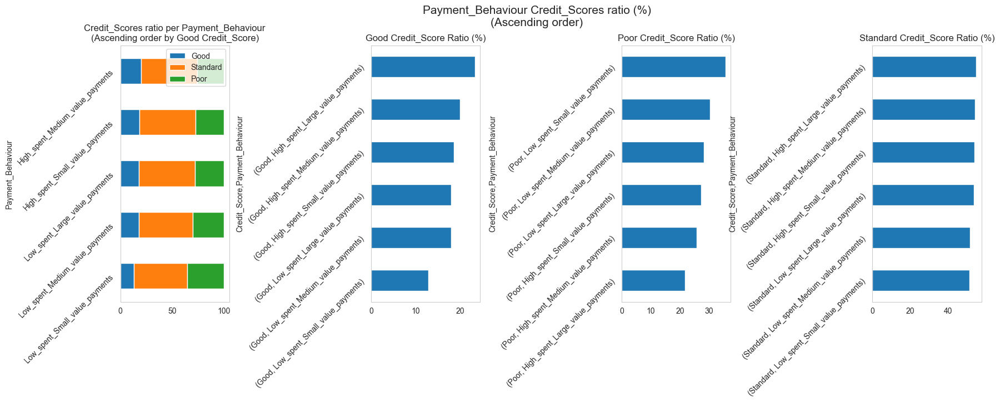

In [186]:
[cat_score_ratio(train_df,feature,'Credit_Score','Good') for feature in train_df.drop('Credit_Score',axis=1).select_dtypes(include='object').columns]

Creating a function that converts a string to a number & creates converting dictionary.

In [128]:
obj_to_num_dict={}
num_to_obj_dict={}
def convert_str_to_num(df=train_df):
    # df=pd.get_dummies(df,columns=['Occupation'])
    for column in (df.select_dtypes(include='object').columns):
        obj_to_num_dict[column]={}
        num_to_obj_dict[column]={}
        for n,i in enumerate(df[column].unique()):
            df[column]=df[column].replace(i,n+1)
            obj_to_num_dict[column][i]=n+1
            num_to_obj_dict[column][n+1]=i
        df[column]=df[column].astype('uint8')
    return df
train_df=convert_str_to_num(df=train_df)

Checking correction between features.

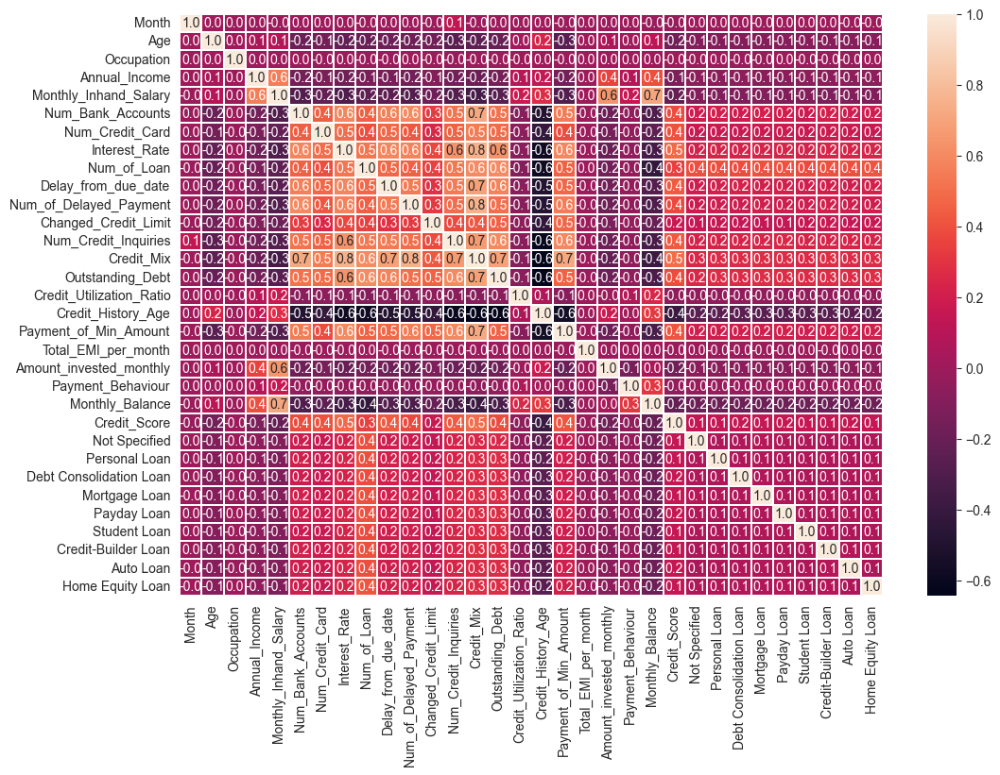

In [188]:
correlation_plot(train_df)

In [ ]:
# from pandasgui import show
# show(train_df)

In [ ]:
train_df.loc[:,:'Credit_Score'].replace({'Credit_Score':num_to_obj_dict['Credit_Score']})

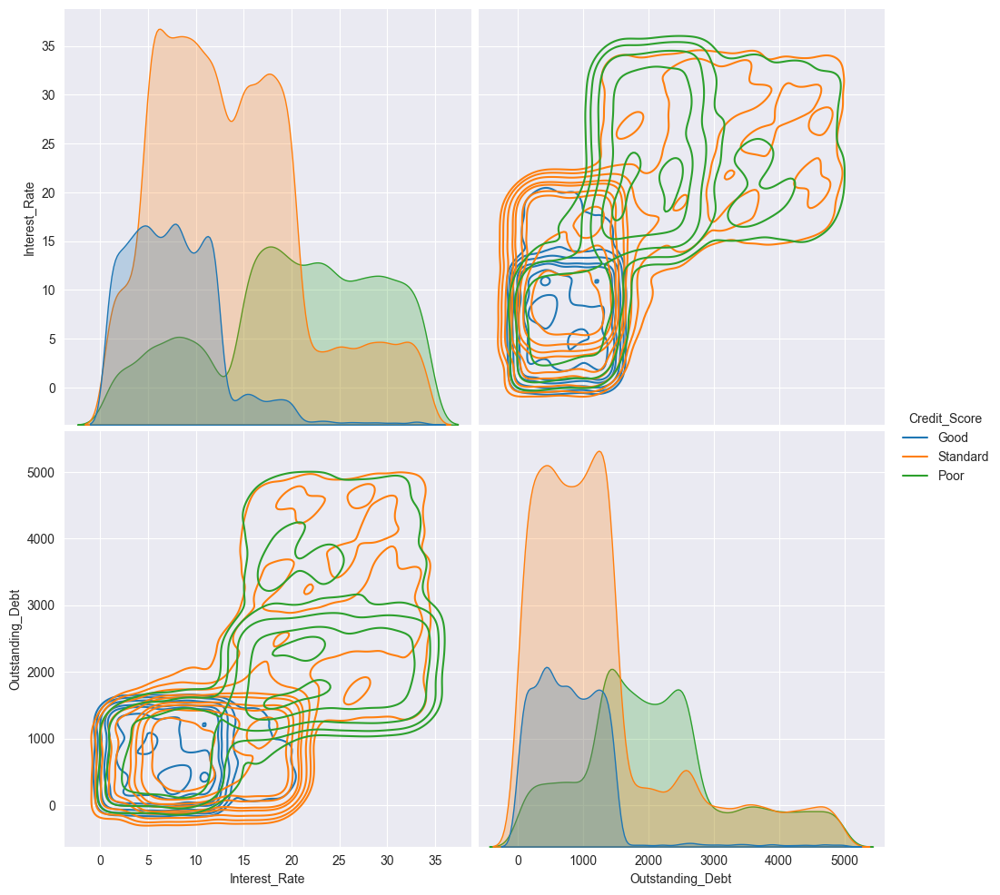

In [15]:
sns.pairplot(data=train_df[['Interest_Rate','Outstanding_Debt','Credit_Score']].replace({'Credit_Score':num_to_obj_dict['Credit_Score']}),hue='Credit_Score',kind='kde',height=5, aspect=1)

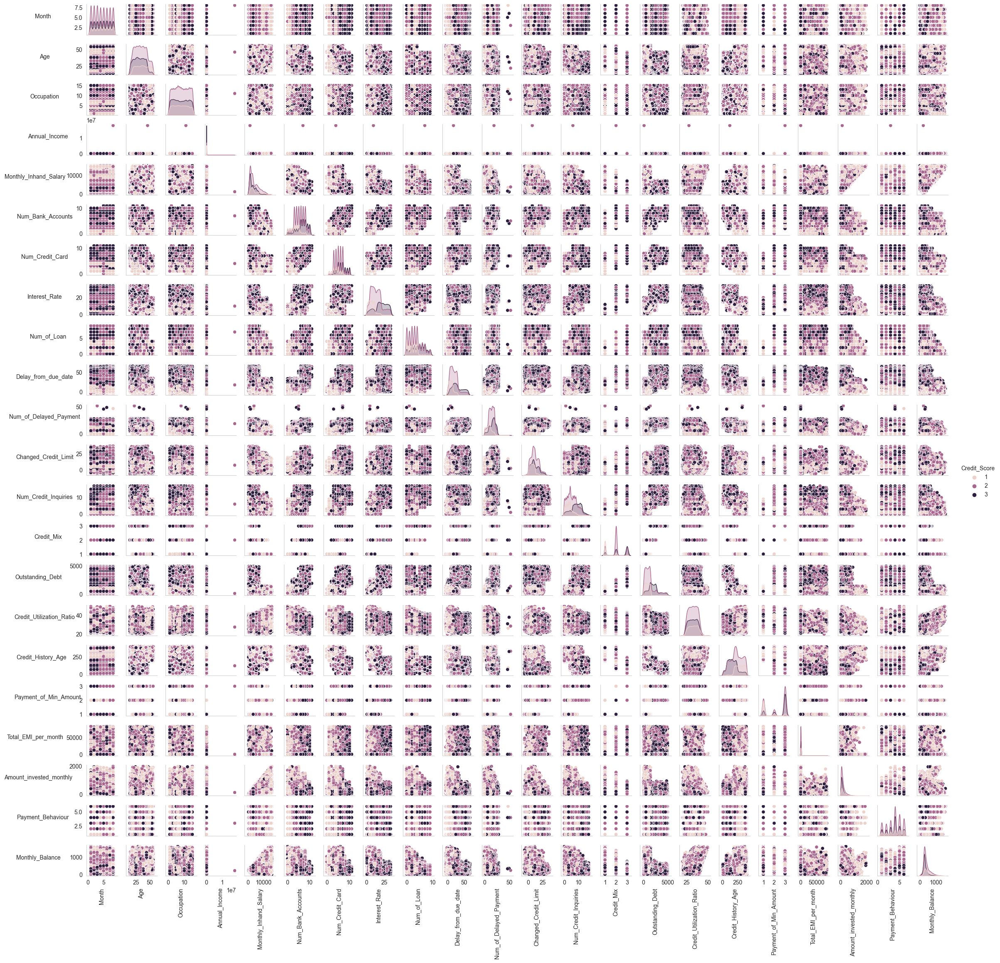

In [190]:
scatter_pair_plot=sns.pairplot(train_df.loc[:,:'Credit_Score'].replace({'Credit_Score':num_to_obj_dict['Credit_Score']}),height=1, aspect=1,hue='Credit_Score')
for ax in scatter_pair_plot.axes.flat:
    ax.set_xlabel(ax.get_xlabel(),rotation=90,loc='center')
    ax.set_ylabel(ax.get_ylabel(),rotation=0,labelpad=54,loc='center')

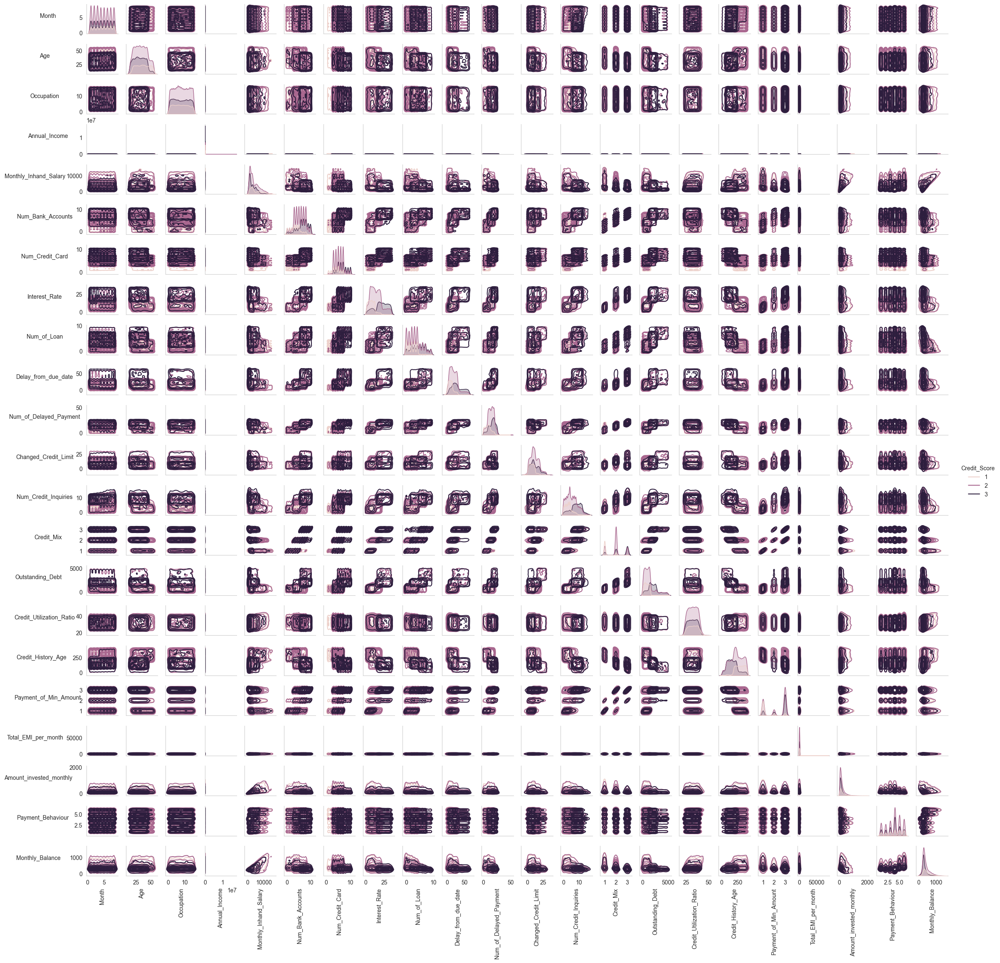

In [191]:
credit_scores_kde=sns.pairplot(train_df.loc[:,:'Credit_Score'].replace({'Credit_Score':num_to_obj_dict['Credit_Score']}),height=1, aspect=1,hue='Credit_Score',kind='kde')
for ax in credit_scores_kde.axes.flat:
    ax.set_xlabel(ax.get_xlabel(),rotation=90,loc='center')
    ax.set_ylabel(ax.get_ylabel(),rotation=0,labelpad=54,loc='center')

Text(0.5, 1.0, 'Interest Rate Credit Mix correlation')

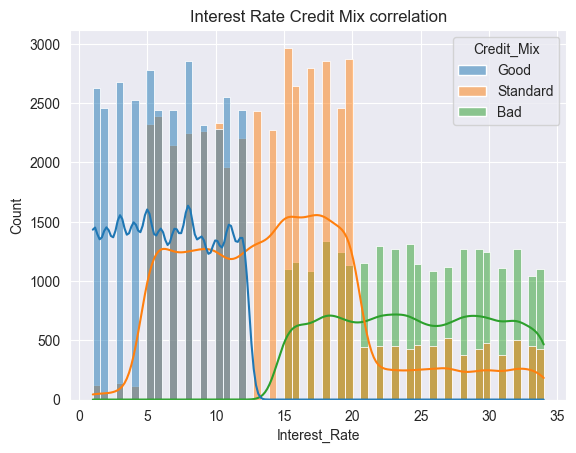

In [18]:
sns.histplot(data=train_df.replace({'Credit_Mix':num_to_obj_dict['Credit_Mix']}),x='Interest_Rate',hue='Credit_Mix',kde=True)
plt.title('Interest Rate Credit Mix correlation')

Text(0.5, 1.0, 'Num_of_Delayed_Payment Credit Mix correlation')

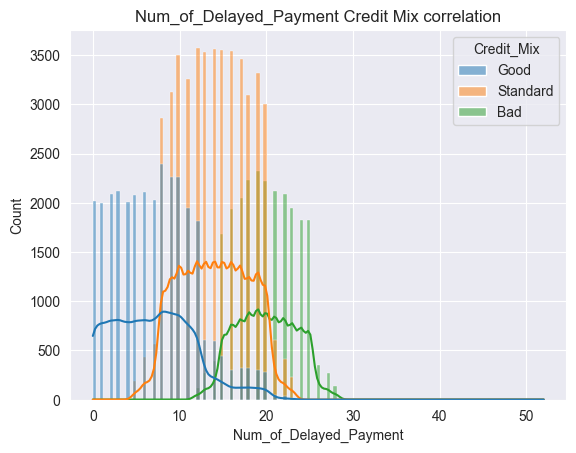

In [19]:
sns.histplot(data=train_df.replace({'Credit_Mix':num_to_obj_dict['Credit_Mix']}),x='Num_of_Delayed_Payment',hue='Credit_Mix',kde=True)
plt.title('Num_of_Delayed_Payment Credit Mix correlation')

Creating a function that plots each feature distribution(using Seaborn box|hist plot method).

In [195]:
def dist_plots(df=train_df,plot_type='boxplot',select_dtypes=True,columns=6):
    if select_dtypes:
        df=df.select_dtypes(exclude='O')
    columns=columns
    rows=int(np.ceil(df.shape[1]/columns))
    # grid_kw=[{'wspace':0.3,'hspace':0.2} if plot_type!='boxplot' else None]
    fig,axes=plt.subplots(rows,columns,sharey='none',figsize=[int(columns*4),int(rows*4)],gridspec_kw={'wspace':0.3,'hspace':0.2} if plot_type!='boxplot' else None)
    # fig,axes=plt.subplots(rows,columns,sharey='none',figsize=[columns*4,rows*4],gridspec_kw={'wspace':0.3,'hspace':0.2})

    for n,feature in enumerate(df):
        i,j=divmod(n,columns)
        if plot_type=='boxplot':
            sns.boxplot(x=df[feature],ax=axes[i,j])
        elif plot_type=='hist':
            sns.histplot(x=df[feature],ax=axes[i,j],kde=True)

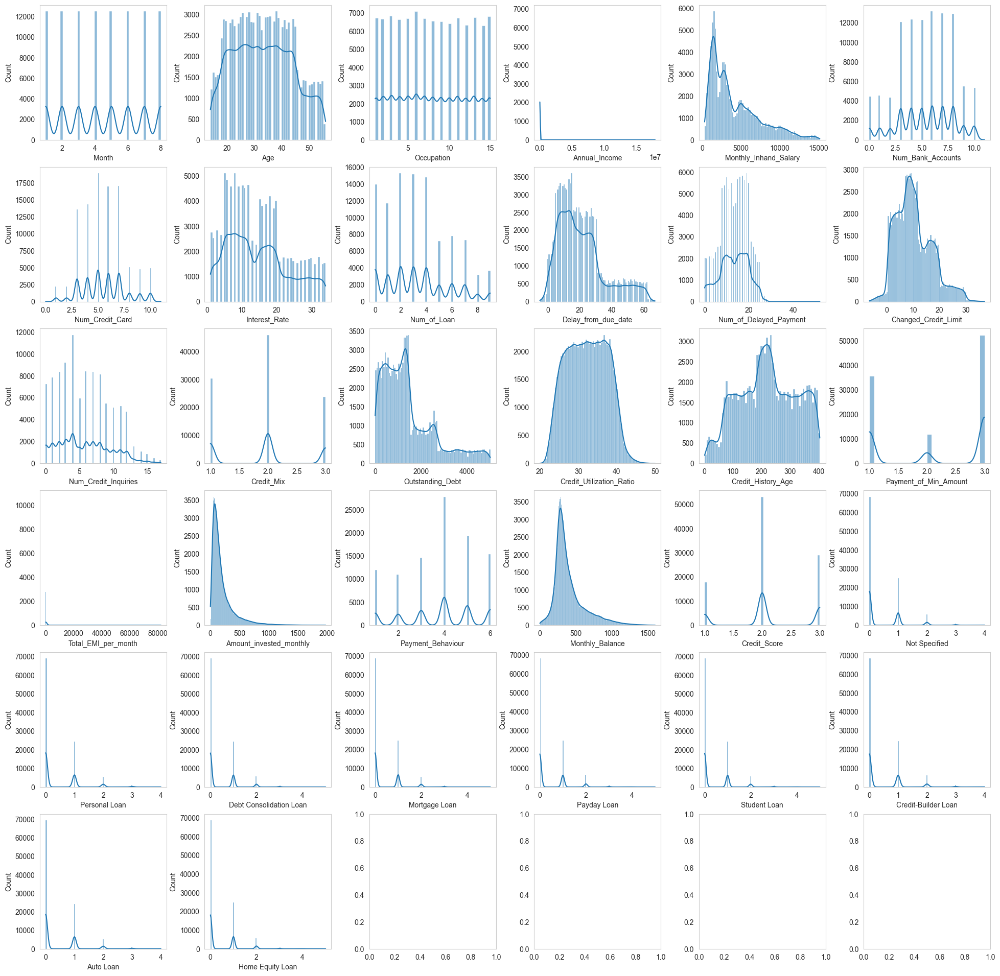

In [196]:
dist_plots(train_df,plot_type='hist')

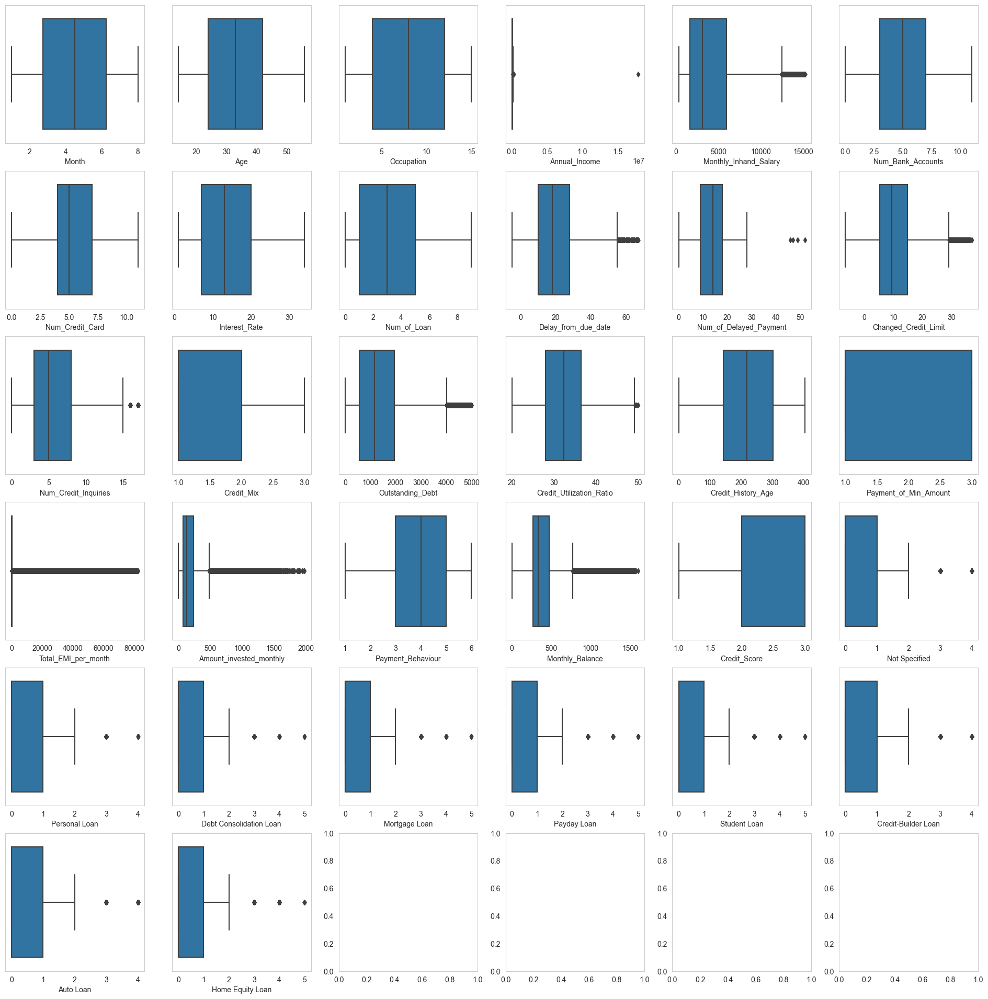

In [197]:
dist_plots(train_df)

Skewness:

<AxesSubplot: >

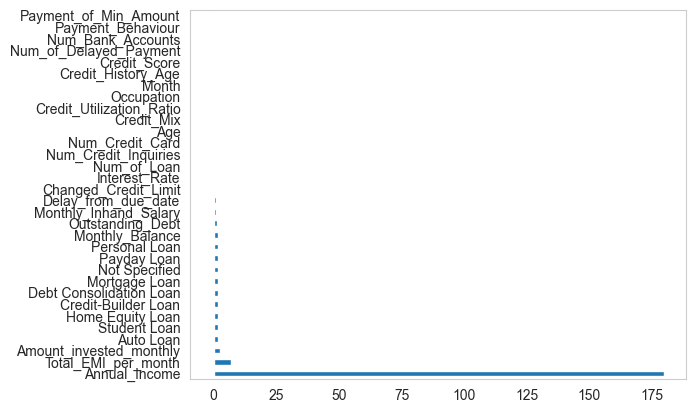

In [198]:
# list(map(lambda x:{x:(np.power(train_df[x]-train_df[x].mean(),3).sum())/((train_df[x].shape[0]-1)*np.power(train_df[x].std(),3))}, train_df))
train_df.skew().sort_values(ascending=False).plot(kind='barh')




Show target labels ratio.


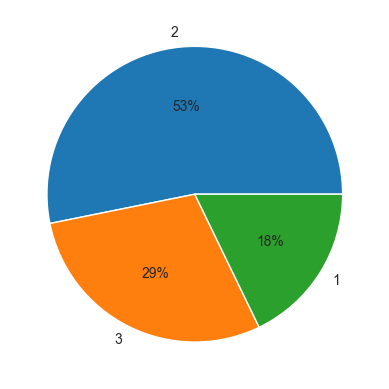

In [23]:
target_ratio(train_df)

In [200]:
train_df.Credit_Score.value_counts()

2    53174
3    28998
1    17828
Name: Credit_Score, dtype: int64

Imbalanced data.

The outliers are valid and important
Imbalanced data | outliers -> skewed distribution.
I will overcome that issue above by balancing the data with augmenting technics and changing the scale of the features->the technic will depend on the prediction algorithm.

Creating a function to Preparing data for each prediction algorithm.

In [125]:
def split_and_balance(df,target='Credit_Score',test_size=0.2,random_state=0,augmentation=RandomOverSampler(random_state=16),remove_loan_type=False):
    if remove_loan_type:
        df=df.loc[:,:'Credit_Score']
    test=pd.DataFrame()
    nuniq_labels=df[target].nunique()

    for i,l in enumerate(df[target].unique()):
        if i ==0:
            test=df.query(f'Credit_Score=={l}').sample(n=int((df.shape[0]*test_size)//nuniq_labels),random_state=random_state)
        else:
            test=pd.concat([test,df.query(f'Credit_Score=={l}').sample(n=int((df.shape[0]*test_size)//nuniq_labels),random_state=random_state)])
    train=df.drop(test.index)

    if augmentation:
        xtrain,ytrain=augmentation.fit_resample(train.drop(target,axis=1),train[target])

    else:
        xtrain,ytrain=train.drop(target,axis=1),train[target]

    xtest,ytest=test.drop(target,axis=1),test[target]

    return xtrain,xtest,ytrain,ytest


In [202]:
x,xx,y,yy=split_and_balance(df=train_df,test_size=0.2)

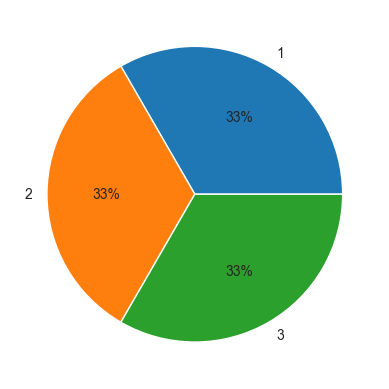

In [203]:
target_ratio(y,target=None)

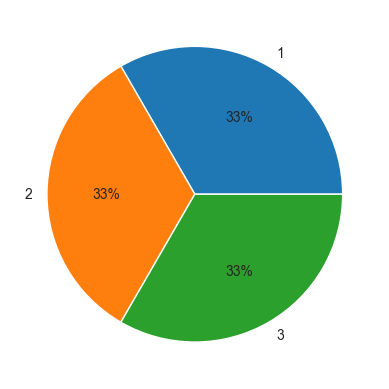

In [204]:
target_ratio(yy,target=None)

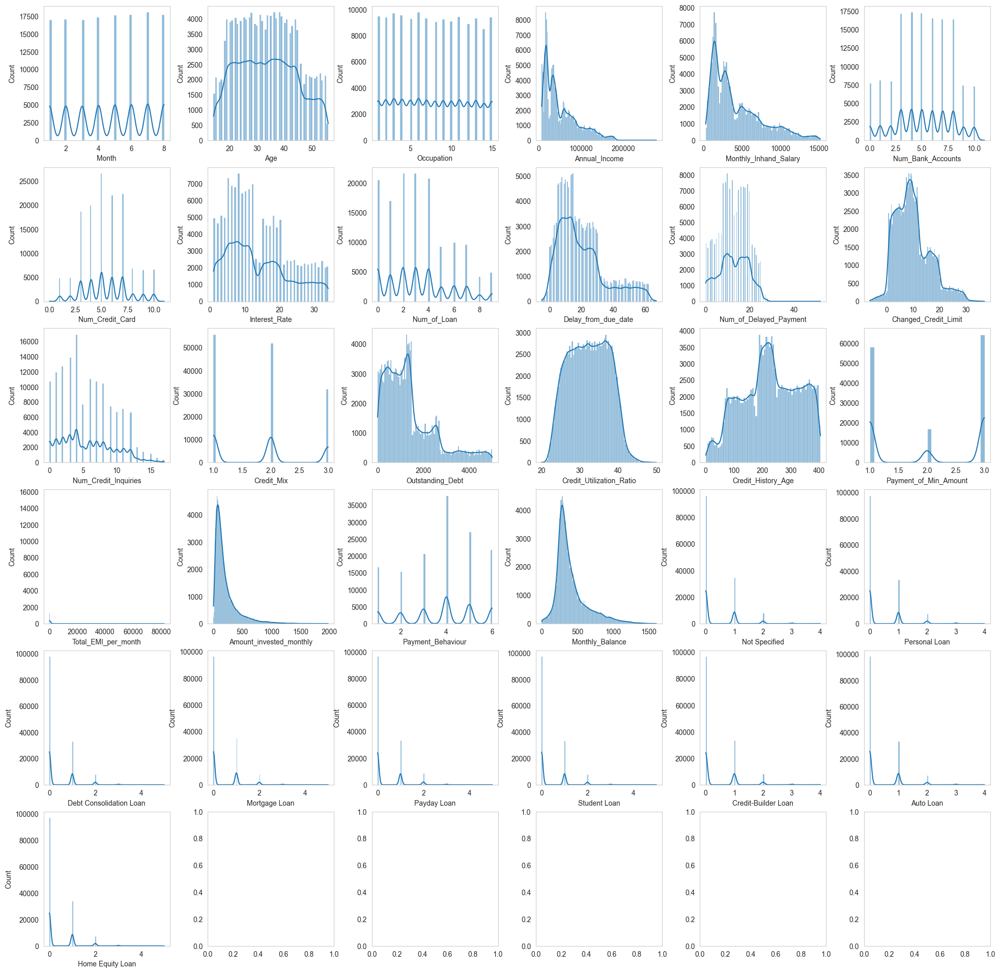

In [205]:
dist_plots(x,plot_type='hist',select_dtypes=False)

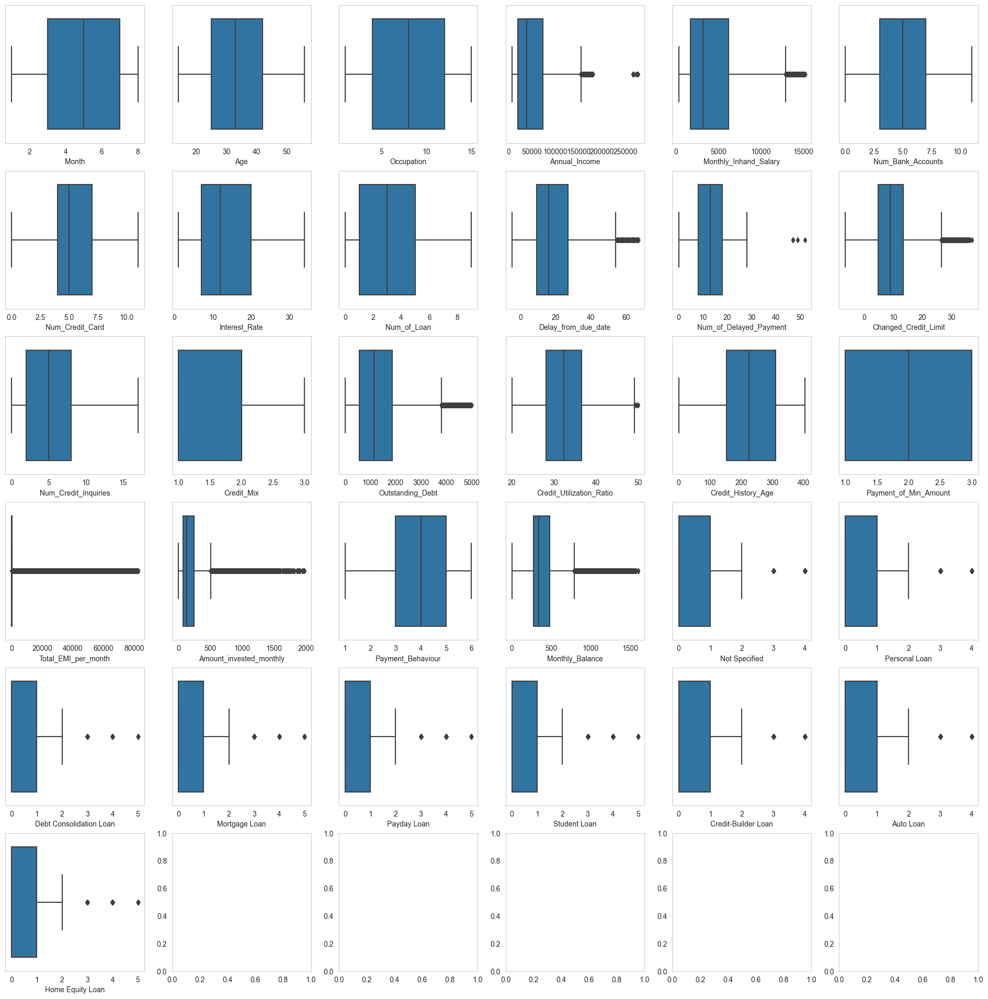

In [206]:
dist_plots(x,select_dtypes=False)

Skewness in balanced data(data for training):

<AxesSubplot: >

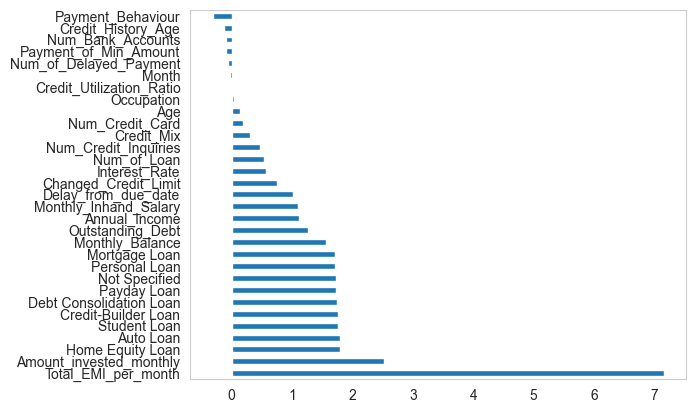

In [207]:
# list(map(lambda x:{x:(np.power(train_df[x]-train_df[x].mean(),3).sum())/((train_df[x].shape[0]-1)*np.power(train_df[x].std(),3))}, train_df))
x.skew().sort_values(ascending=False).plot(kind='barh')

In [208]:
scal=PowerTransformer(standardize=True)
x_scaled=scal.fit_transform(x)

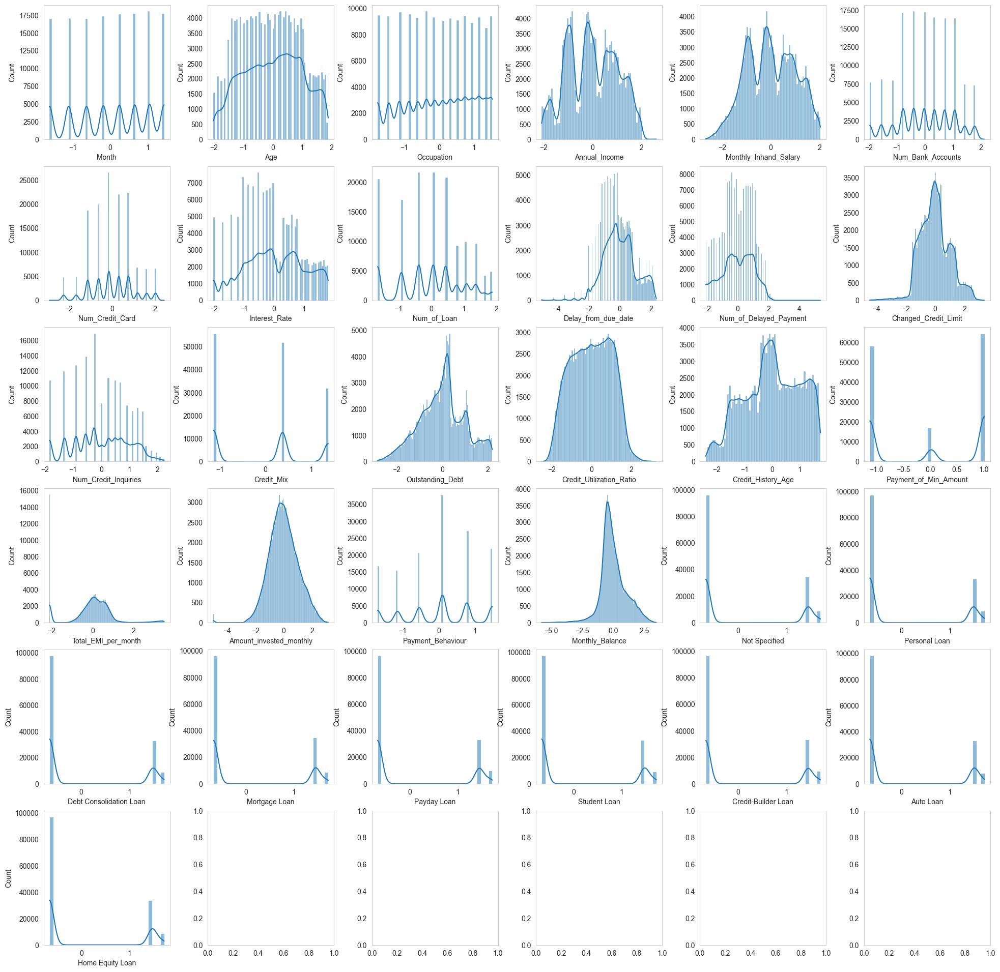

In [209]:
dist_plots(pd.DataFrame(x_scaled,columns=train_df.drop('Credit_Score',axis=1).columns),plot_type='hist',select_dtypes=False)

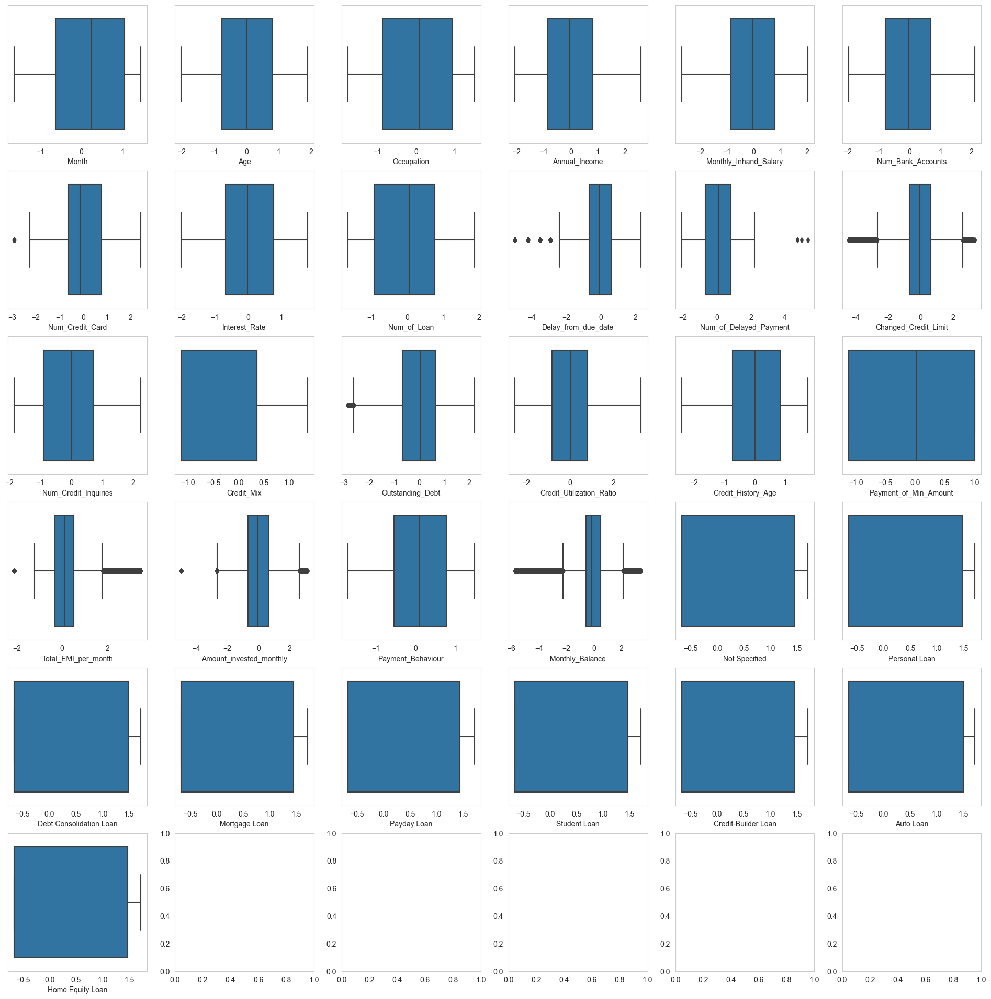

In [210]:
dist_plots(pd.DataFrame(x_scaled,columns=train_df.drop('Credit_Score',axis=1).columns),select_dtypes=False)

Skewness in scaled and balanced data(data for training):

<AxesSubplot: >

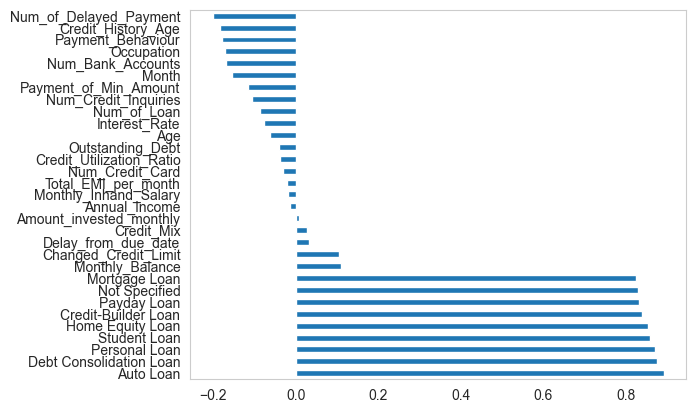

In [211]:
pd.DataFrame(x_scaled,columns=train_df.drop('Credit_Score',axis=1).columns).skew().sort_values(ascending=False).plot(kind='barh')

In [213]:
del x,xx,y,yy,x_scaled

PowerTransformer(Sklearn) scaling to reduce the Skewed distribution, using the 'yeo-jonson' method because some features have negative values.

In [214]:
del scal

There is high frequency of outliers for some features -> Tree-based algorithms are robust to outliers, also KNN with a high value of K (a low number of nearest neighbors will be susceptible to outliers).
I will write a function to set the optimal K value.

Stakeholder models using cross-validation->Imbalanced date-> using StratifiedKFold.
*Hyp not tuned.

In [215]:
def stakeholder_model(features,targets,estimators,scaling_method=None):
    _=pd.DataFrame()
    # imbalance data
    k_fold=StratifiedKFold(5,shuffle=True)
    for model in tqdm(estimators):
        pipeline=make_pipeline(scaling_method,model)
        print(f"{model} cross val score|kfold->k-5: {cross_val_score(pipeline, features, targets.replace({1:0,2:1,3:2}),cv=k_fold).mean()}")

check_estimators=[XGBClassifier(n_jobs=-1),RandomForestClassifier(n_jobs=-1),KNeighborsClassifier(n_jobs=-1),
            AdaBoostClassifier(),HistGradientBoostingClassifier(),GradientBoostingClassifier()]

stakeholder_model(train_df.drop('Credit_Score',axis=1),train_df.Credit_Score,check_estimators,PowerTransformer(method='yeo-johnson',standardize=True))

 17%|█▋        | 1/6 [00:34<02:51, 34.38s/it]

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=None, ...) cross val score|kfold->k-5: 0.77168


 33%|███▎      | 2/6 [00:49<01:31, 22.94s/it]

RandomForestClassifier(n_jobs=-1) cross val score|kfold->k-5: 0.8270199999999999


 50%|█████     | 3/6 [00:59<00:51, 17.12s/it]

KNeighborsClassifier(n_jobs=-1) cross val score|kfold->k-5: 0.7753599999999999


 67%|██████▋   | 4/6 [01:26<00:41, 20.83s/it]

AdaBoostClassifier() cross val score|kfold->k-5: 0.6545099999999999


 83%|████████▎ | 5/6 [01:47<00:21, 21.00s/it]

HistGradientBoostingClassifier() cross val score|kfold->k-5: 0.76171


100%|██████████| 6/6 [06:23<00:00, 63.97s/it] 

GradientBoostingClassifier() cross val score|kfold->k-5: 0.7163


KNN algorithm


Predict_model Function - return report, pipeline and each label scores (for weights to majority vote).

In [126]:
def predict_model(estimator,df,target='Credit_Score',test_size=0.2,scaler=None,report=True,split='function',random_state=0,imbalance=None,return_pipeline=False):

    x_train,x_test,y_train,y_test=split_and_balance(df,target,test_size,random_state=random_state,augmentation=imbalance)


    model_pipeline=make_pipeline(scaler,estimator)
    model_pipeline.fit(x_train,y_train)

    if report:
        print(f'test report:\n{classification_report(model_pipeline.predict(x_test),y_test)}')
        print(f'train report:\n{classification_report(model_pipeline.predict(x_train), y_train)}')

    if return_pipeline:
        report_test=pd.DataFrame.from_dict(classification_report(model_pipeline.predict(x_test),y_test,output_dict=True))

        return model_pipeline,report_test

In [217]:
# train_df.replace({'Credit_Score':{1:0,2:1,3:2}})

Random forest model
Optimal max depth to avoid overfitting.

In [218]:
def scores_visual(df,target='Credit_Score',estimator='RandomForestClassifier',n_estimators=600,k_fold=5,test_size=0.2,random_state=0,max_depth=35,criterion='entropy'):
    # imbalance data
    kfold=StratifiedKFold(k_fold,shuffle=True)
    scores_df=pd.DataFrame(columns=['train','test','cross_val'])
    X_train,X_test,Y_train,Y_test=split_and_balance(df,target,test_size,random_state=random_state,augmentation=None)

    for depth in range(1,max_depth+1):

        model_r=RandomForestClassifier(n_estimators=n_estimators,n_jobs=-1,max_depth=depth,random_state=16,criterion=criterion)
        scores_df.loc[depth]={'cross_val':cross_val_score(model_r,X_train,Y_train,cv=kfold).mean(),'train':model_r.fit(X_train,Y_train).score(X_train,Y_train),'test':model_r.fit(X_train,Y_train).score(X_test,Y_test)}

    sns.scatterplot(scores_df)
    plt.title(f'{estimator} ({n_estimators} estimators)-mean cross validation scores (Kfold={kfold})')
    sns.lineplot(scores_df)

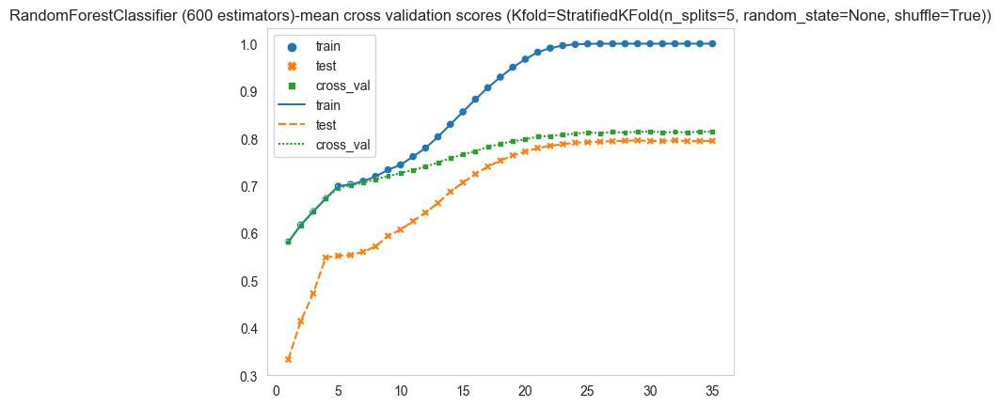

In [219]:
scores_visual(train_df)

In [221]:
rforest_pipe,_=predict_model(estimator=RandomForestClassifier(max_depth=22,n_estimators=600,random_state=3,criterion='entropy'),df=train_df,test_size=0.2,scaler=None,imbalance=RandomOverSampler(random_state=24),return_pipeline=True,report=True)

test report:
              precision    recall  f1-score   support

           1       0.86      0.86      0.86      6631
           2       0.77      0.77      0.77      6740
           3       0.87      0.88      0.87      6627

    accuracy                           0.83     19998
   macro avg       0.83      0.84      0.84     19998
weighted avg       0.83      0.83      0.83     19998

train report:
              precision    recall  f1-score   support

           1       1.00      0.96      0.98     48410
           2       0.94      1.00      0.97     43577
           3       1.00      0.98      0.99     47537

    accuracy                           0.98    139524
   macro avg       0.98      0.98      0.98    139524
weighted avg       0.98      0.98      0.98    139524



Features importance

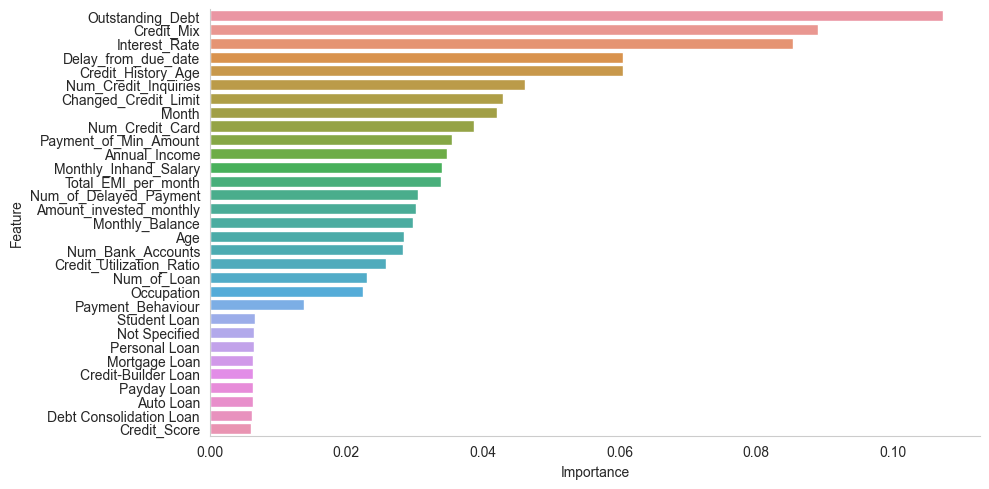

In [222]:
importance_df=pd.DataFrame([rforest_pipe[-1].feature_importances_,train_df.columns[:-1]]).T.sort_values(by=0,ascending=False)
importance_df.columns=['Importance','Feature']
sns.catplot(data=importance_df,x='Importance',y='Feature',kind='bar', height=5, aspect=2)

Create Pipelines dictionary.

In [78]:
pipelines_and_scores={}
pipelines_and_scores['RandomForestClassifier']=predict_model(estimator=RandomForestClassifier(max_depth=22,n_estimators=600,random_state=3,criterion='entropy'),df=train_df,test_size=0.2,scaler=None,imbalance=RandomOverSampler(random_state=24),return_pipeline=True,report=False)

In [224]:
del rforest_pipe,importance_df

XGBoost algorithm

In [134]:
xgb_pipe,_=predict_model(estimator=XGBClassifier(reg_alpha=9e-1,gamma=2.7,n_estimators=232,n_jobs=-1,max_depth=11,random_state=14,learning_rate=1e-1),df=train_df.replace({'Credit_Score':{1:0,2:1,3:2}}),test_size=0.2,scaler=None,imbalance=RandomOverSampler(random_state=5),return_pipeline=True,report=True)

test report:
              precision    recall  f1-score   support

           0       0.87      0.87      0.87      6673
           1       0.77      0.77      0.77      6651
           2       0.87      0.87      0.87      6674

    accuracy                           0.84     19998
   macro avg       0.84      0.84      0.84     19998
weighted avg       0.84      0.84      0.84     19998

train report:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     49429
           1       0.84      0.97      0.90     40126
           2       0.98      0.91      0.94     49969

    accuracy                           0.94    139524
   macro avg       0.94      0.94      0.94    139524
weighted avg       0.94      0.94      0.94    139524



In [135]:
pipelines_and_scores['XGBoost']=predict_model(estimator=XGBClassifier(reg_alpha=9e-1,gamma=2.7,n_estimators=232,n_jobs=-1,max_depth=11,random_state=14,learning_rate=1e-1),df=train_df.replace({'Credit_Score':{1:0,2:1,3:2}}),test_size=0.2,scaler=None,imbalance=RandomOverSampler(random_state=5),return_pipeline=True,report=False)

In [137]:
del xgb_pipe


Histogram Boosting Gradient Classifier model

In [83]:
predict_model(estimator=HistGradientBoostingClassifier(max_depth=15,l2_regularization=9e-1,max_iter=300,random_state=7,loss='log_loss',learning_rate=1e-1, n_iter_no_change=20),df=train_df,test_size=0.2,scaler=None,imbalance=RandomOverSampler(random_state=9),return_pipeline=False,report=True)

test report:
              precision    recall  f1-score   support

           1       0.89      0.84      0.86      6999
           2       0.73      0.77      0.75      6310
           3       0.86      0.85      0.85      6689

    accuracy                           0.82     19998
   macro avg       0.82      0.82      0.82     19998
weighted avg       0.83      0.82      0.82     19998

train report:
              precision    recall  f1-score   support

           1       0.98      0.89      0.93     50854
           2       0.77      0.91      0.84     39295
           3       0.94      0.88      0.91     49375

    accuracy                           0.89    139524
   macro avg       0.89      0.90      0.89    139524
weighted avg       0.90      0.89      0.90    139524



In [141]:
pipelines_and_scores['HistGdb']=predict_model(estimator=HistGradientBoostingClassifier(max_depth=15,l2_regularization=0.9,max_iter=300,random_state=7,loss='log_loss',learning_rate=1e-1, n_iter_no_change=20),df=train_df,test_size=0.2,scaler=None,imbalance=RandomOverSampler(random_state=9),return_pipeline=True,report=False)


KNN algorithm
Elbow method function - tool to find the optimal number of K nearest neighbors.

In [227]:
def k_elbow_method(df,test_size,balance_method,metrics,scaler,random_state=0,min_k=None,max_k=None,plot=True,return_error_df=False):

    n=0
    error_df=pd.DataFrame()
    error_list=[]
    k_list=[]

    if min_k==None:
        _=int(np.sqrt(df.shape[1]-1))
        _=_-2
        if _%2==0:
           min_k=_-1
        else:
            min_k=_
        print(f'min_k value set to {min_k}')

    if max_k==None:
        max_k=min_k+12
        print(f'min_k value set to {max_k}')

    if min_k<=0 or max_k<=0:
        for i,k in enumerate([min_k,max_k]):
            if k<=0:
                print(f"***{'Min_k' if i==0 else 'max_k'} value equel to {k} is not valid->{'Min_k' if i==0 else 'max_k'} value set to {1 if i==0 else 15}***")
                if i==0:
                    min_k=1
                else:
                    max_k=15
    if min_k%2==0:
        min_k-=1

    for augment in balance_method:
        x_train,x_test,y_train,y_test=split_and_balance(df=df,test_size=test_size,random_state=random_state,augmentation=augment)

        for scal in scaler:
            x_train=scal.fit_transform(x_train)
            x_test=scal.transform(x_test)

            for metric in metrics:
                error_list=[]
                k_list=[]

                for K in range(min_k,max_k+1,2):
                    knn=KNeighborsClassifier(n_neighbors=K,metric=metric)
                    knn.fit(x_train,y_train)
                    k_list.append(K)
                    error_list.append(np.mean(knn.predict(x_test)!=y_test))
                    if K+1>=max_k:
                        _2=f"{str(augment)}\nscaler:{str(scal)}\nmetric:{metric}"
                        _3=pd.DataFrame({(f'{_2}','K_value'):k_list,(f'{_2}','Error_Ratio'):error_list})
                        if n==0:
                            error_df=_3
                            n+=1
                        else:
                            error_df=pd.concat([error_df,_3],axis=1)

    if plot:
        params=error_df.columns
        n_iter=error_df.shape[1]//2
        rows=1
        columns=n_iter

        if n_iter>3:
            rows=int(np.ceil(n_iter/3))
            columns=3

        if n_iter==1:
            sns.lineplot(x=error_df[params[0][0]][params[0][1]],y=error_df[params[1][0]][params[1][1]]).set(title=params[0][0])

        else:
            fig,axes=plt.subplots(nrows=rows,ncols=columns,sharey='all',figsize=[columns*4,rows*6],gridspec_kw={'wspace':0.45,'hspace':0.3})
            fig.suptitle('Elbow_method(K value,Error_Rate)',fontsize=18,y=1)

            _=0

            for iter in range(0,n_iter*2,2):
                i,j=divmod(_,columns)

                if rows==1:
                    sns.lineplot(x=error_df[params[0+iter][0]][params[0][1]],y=error_df[params[1+iter][0]][params[1][1]],ax=axes[j]).set(title=params[0+iter][0])

                else:
                    sns.lineplot(x=error_df[params[0+iter][0]][params[0][1]],y=error_df[params[1+iter][0]][params[1][1]],ax=axes[i,j]).set(title=params[0+iter][0])

                _+=1

    if return_error_df:
        return error_df

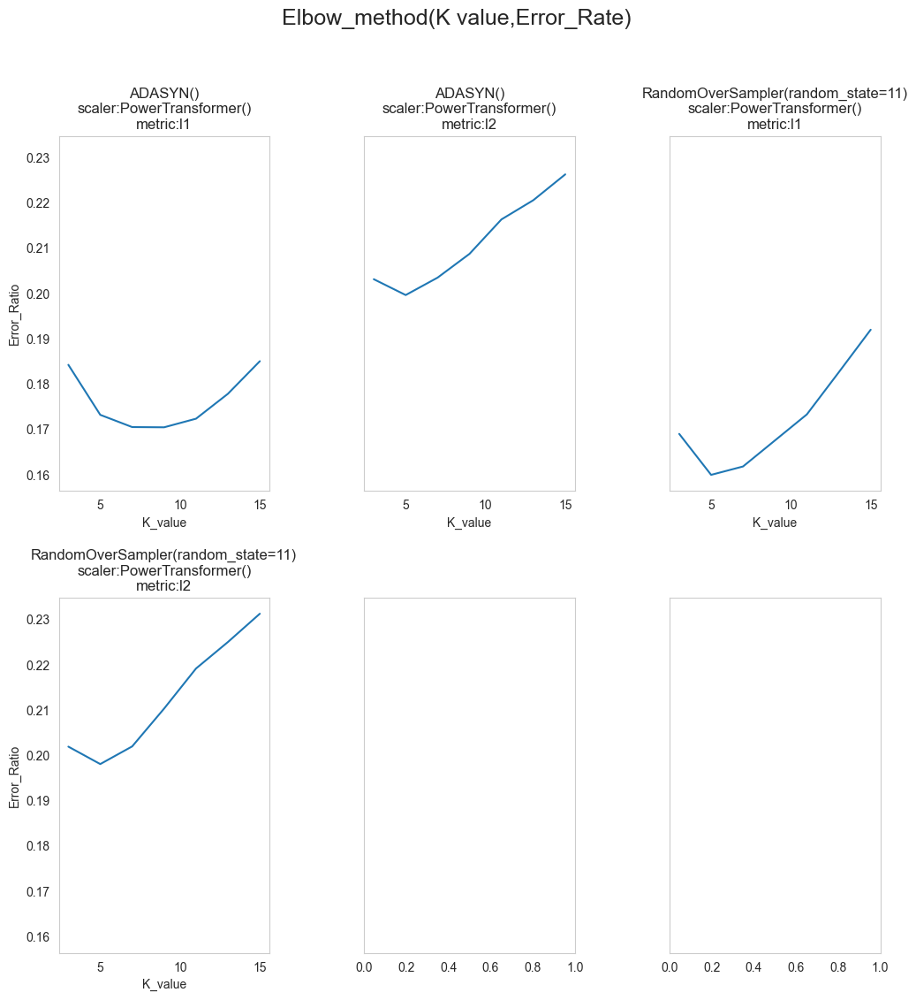

In [228]:
error_df=k_elbow_method(train_df.replace({'Credit_Score':{1:0,2:1,3:2}}),0.2,balance_method=[ADASYN(),RandomOverSampler(random_state=11)],metrics=['l1','l2'],scaler=[PowerTransformer()],min_k=3,max_k=15,plot=True,return_error_df=True)

In [229]:
error_df.min().min()

0.15991599159915992

In [230]:
predict_model(estimator=KNeighborsClassifier(n_neighbors=5,metric='l1'),df=train_df,test_size=0.2,scaler=PowerTransformer(),imbalance=RandomOverSampler(random_state=11),return_pipeline=False,report=True)

test report:
              precision    recall  f1-score   support

           1       0.90      0.87      0.88      6904
           2       0.71      0.80      0.75      5962
           3       0.91      0.85      0.88      7132

    accuracy                           0.84     19998
   macro avg       0.84      0.84      0.84     19998
weighted avg       0.85      0.84      0.84     19998

train report:
              precision    recall  f1-score   support

           1       0.99      0.91      0.95     50756
           2       0.77      0.97      0.86     37030
           3       0.98      0.88      0.93     51738

    accuracy                           0.92    139524
   macro avg       0.92      0.92      0.91    139524
weighted avg       0.93      0.92      0.92    139524



In [142]:
pipelines_and_scores['Knn']=predict_model(estimator=KNeighborsClassifier(n_neighbors=5,metric='l1'),df=train_df,test_size=0.2,scaler=PowerTransformer(),imbalance=RandomOverSampler(random_state=11),return_pipeline=True,report=False)




FC neural network

Creating a script to tune NN Hyp (trained outside this notebook).

In [289]:
# x_train, x_test, y_train, y_test = split_and_balance(train_df, test_size=0.2,
#                                                      augmentation=RandomOverSampler(random_state=17))
#
# scaler = PowerTransformer()
# x_train = scaler.fit_transform(x_train)
# x_test = scaler.transform(x_test)
#
#
# class Fc(nn.Module):
#     def __init__(self, input_size, output_size, n_layers, hidden_sizes, l_activations, l_dropouts):
#         super().__init__()
#         layers = []
#         for _, size, activ, drop in zip(range(n_layers), hidden_sizes, l_activations, l_dropouts):
#             if _ == 0:
#                 layers.append(nn.Linear(input_size, size))
#                 layers.append(nn.Dropout(drop))
#                 layers.append(getattr(nn, activ)())
#             else:
#                 layers.append(nn.Linear(hidden_sizes[_ - 1], size))
#                 layers.append(nn.Dropout(drop))
#                 layers.append(getattr(nn, activ)())
#         layers.append(nn.Linear(hidden_sizes[-1], output_size))
#
#         self.fcnn_model = nn.Sequential(*layers)
#
#     def forward(self, x):
#         return self.fcnn_model(x)
#
#
# class Data(Dataset):
#     def __init__(self):
#         self.x = torch.tensor(x_train, dtype=torch.float32)
#         self.y = torch.tensor(y_train, dtype=torch.float32).view(-1)
#         self.instances = self.x.shape[0]
#
#     def __len__(self):
#         return self.instances
#
#     def __getitem__(self, item):
#         return self.x[item], self.y[item]
#
#
# def objective(trial):
#     n_layers = trial.suggest_int('nlayers', 2, 3, 1)
#     hidden_sizes = []
#     l_activations = ['LeakyReLU','LeakyReLU']
#     #Sets drop-out values to avoid over-fitting.
#     l_dropouts = [0.3, 0.2]
#     if n_layers != 2:
#         l_dropouts.append(0.2)
#         l_activations.append('LeakyReLU')
#     for l in range(n_layers):
#         hidden_sizes.append(trial.suggest_int(f'size_l{l}', 32 * 6, 128 * 10, 32))
#     # Sets activations function to break linearity to "leaky relu" because data having negative values.
#         # l_activations.append(trial.suggest_categorical(f'activation_l{l}', ['LeakyReLU','Sigmoid','ReLU']))
#     # sets learning rate as 1e-3
#     # learning_rate = trial.suggest_float('learning_rate', 1e-7, 1e-1,step=1e-7)
#     model = Fc(input_size=x_train.shape[1], output_size=1, n_layers=n_layers, hidden_sizes=hidden_sizes,
#                l_activations=l_activations, l_dropouts=l_dropouts).to(device=device)
#     criterion = nn.MSELoss()
#     # Sets weight_decay (L2 penalty) to avoid over-fitting while training.
#     optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-3)
#     df = Data()
#     epochs = 30
#     train_loader = DataLoader(dataset=df, batch_size=x_train.shape[0] // 6, shuffle=True)
#     loss = None
#     for epoch in range(epochs):
#         for batch, (features, labels) in enumerate(train_loader):
#             # Adding data to cuda
#             features = features.to(device=device)
#             labels = labels.to(device=device)
#             predictions = model.forward(features).view(-1).to(device=device)
#             loss = torch.sqrt(criterion(predictions, labels).to(device=device))
#             print(f"batch:{batch}\nepoch:{epoch} loss: {loss.to(device='cpu')}")
#             # Backprop
#             loss.backward()
#             # Optimizer step
#             optimizer.step()
#             # Reset gradient
#             optimizer.zero_grad(set_to_none=True)
#     # For the lowest loss function value, the model state dictionary will preserve.
#     if loss_check[-1] > loss:
#         for param, param_val in zip(['n_layers', 'hidden_sizes', 'l_activations', 'l_dropouts'],
#                                     [n_layers, hidden_sizes, l_activations, l_dropouts]):
#             best_trial_params[param] = param_val
#         torch.save(model.state_dict(), 'best_trial_st_dict.pth')
#         print(f'old loss:{loss_check[-1]}\nnew loss: {loss}')
#         loss_check.append(loss)
#     return loss
#
#
# def detailed_objective(trial):
#     n_layers = trial.suggest_int('nlayers', 2, 3, 1)
#     hidden_sizes = []
#     # Set activations
#     l_activations = ['LeakyReLU', 'LeakyReLU']
#     #Sets drop-out values to avoid over-fitting.
#     l_dropouts = [0.3, 0.2]
#     if n_layers != 2:
#         l_dropouts.append(0.2)
#         l_activations.append('LeakyReLU')
#
#     for l in range(n_layers):
#         hidden_sizes.append(trial.suggest_int(f'size_l{l}', 32 * 5, 128 * 10, 32))
#         l_activations.append(trial.suggest_categorical(f'activation_l{l}', ['LeakyReLU', 'ReLU']))
#     # sets learning rate as 1e-4
#     # learning_rate = trial.suggest_float('learning_rate', 1e-7, 1e-1,step=1e-7)
#     model = Fc(input_size=x_train.shape[1], output_size=1, n_layers=n_layers, hidden_sizes=hidden_sizes,
#                l_activations=l_activations, l_dropouts=l_dropouts).to(device=device)
#     model.load_state_dict(torch.load('best_trial_st_dict.pth'))
#     criterion = nn.MSELoss()
#     # Sets weight_decay (L2 penalty) to avoid over-fitting.
#     optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-3)
#     df = Data()
#     epochs = 5000
#     train_loader = DataLoader(dataset=df, batch_size=x_train.shape[0] // 6, shuffle=True)
#     loss = None
#     for epoch in range(epochs):
#         for batch, (features, labels) in enumerate(train_loader):
#             # Adding data to cuda
#             features = features.to(device=device)
#             labels = labels.to(device=device)
#             predictions = model.forward(features).view(-1).to(device=device)
#             loss = torch.sqrt(criterion(predictions, labels).to(device=device))
#             # For the lowest loss function value, the model state dictionary will preserve.
#             if loss_check[-1] > loss:
#                 for param, param_val in zip(['n_layers', 'hidden_sizes', 'l_activations', 'l_dropouts'],
#                                             [n_layers, hidden_sizes, l_activations, l_dropouts]):
#                     best_trial_params[param] = param_val
#                 torch.save(model.state_dict(), 'best_trial_st_dict.pth')
#
#                 print(f'old loss:{loss_check[-1]}\nnew loss: {loss}')
#                 loss_check.append(loss)
#             acc_train = (model(torch.tensor(x_train, dtype=torch.float32).to(device=device)).round().to(
#                 device='cpu').view(-1) == torch.tensor(y_train.to_numpy())).sum() / y_train.shape[0]
#             acc_test = (model(torch.tensor(x_test, dtype=torch.float32).to(device=device)).round().to(
#                 device='cpu').view(-1) == torch.tensor(y_test.to_numpy())).sum() / y_test.shape[0]
#             print(
#                 f"batch:{batch}\nepoch:{epoch}\nloss: {loss.to(device='cpu')}\naccuracy: train: {acc_train}, test:{acc_test}")
#             # Backprop
#             loss.backward()
#             # Optimizer step
#             optimizer.step()
#             # Reset gradient
#             optimizer.zero_grad(set_to_none=True)
#
#     return model
#
#
# if __name__ == '__main__':
#     loss_check = [1]
#     best_trial_params = {}
#     study = optuna.create_study(direction='minimize')
#     study.optimize(objective, n_trials=100)
#     print(f'best value:{study.best_value} (params: {study.best_params})')
#     with open('study_best_trail.txt', 'w') as f:
#         f.write('dict = ' + repr(study.best_params) + '\n')
#     best_params = study.best_params
#     # Training the best trial.
#     best_trial_model = detailed_objective(study.best_trial)

In [118]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
class Fc_nn(nn.Module):
    def __init__(self, input_size, output_size, n_layers, hidden_sizes, l_activations, l_dropouts):
        super().__init__()
        layers = []
        # for _ in range(n_layers):
        for _, size, activ, drop in zip(range(n_layers), hidden_sizes, l_activations, l_dropouts):
            if _ == 0:
                layers.append(nn.Linear(input_size, size))
                layers.append(nn.Dropout(drop))
                layers.append(getattr(nn, activ)())
            else:
                layers.append(nn.Linear(hidden_sizes[_ - 1], size))
                layers.append(nn.Dropout(drop))
                layers.append(getattr(nn, activ)())
        layers.append(nn.Linear(hidden_sizes[-1], output_size))

        self.fcnn_model = nn.Sequential(*layers)

    def forward(self, x):
        return self.fcnn_model(x)


l_activations = ['LeakyReLU','LeakyReLU','LeakyReLU']
l_dropouts = [0.3, 0.2, 0.2]
x_train,x_test,y_train,y_test=split_and_balance(df=train_df,augmentation=RandomOverSampler(random_state=17))
nn_scal=PowerTransformer()
nn_scal.fit(x_train)
model = Fc_nn(input_size=x_train.shape[1], output_size=1, n_layers=3, hidden_sizes=[1120,672,640],l_activations=l_activations, l_dropouts=l_dropouts).to(device)
model.load_state_dict(torch.load('best_trial_st_dict.pth',map_location=torch.device(device)))

<All keys matched successfully>

In [119]:
def nn_predict(input_data=None,test_target=None,train_data=None,train_target=None,return_report=False,return_prediction=True):
    # prediction=None
    # model.eval()
    predict=model.requires_grad_(False)(torch.tensor(input_data, dtype=torch.float32)).round().view(-1).numpy()
    predict[predict<1]=1
    predict[predict>3]=3
    if train_data is not None:
        train_predict=model.requires_grad_(False)(torch.tensor(train_data, dtype=torch.float32)).round().view(-1).numpy()
        train_predict[train_predict<1]=1
        train_predict[train_predict>3]=3

    if return_report:
        print(f'test_report:\n{classification_report(predict,test_target)}')
        print(f'accuracy:\n{(predict==test_target).sum()/(test_target.shape[0])}')
        if train_data is not None:
            print(f'train_report:\n{classification_report(train_predict,train_target)}')
        return pd.DataFrame.from_dict(classification_report(predict,test_target,output_dict=True))
    if return_prediction:
        return predict

x_train,x_test,y_train,y_test=split_and_balance(df=train_df,augmentation=RandomOverSampler(random_state=17))
x_test=nn_scal.transform(x_test)
nn_report=nn_predict(x_test, y_test,return_prediction=False,return_report=True)
del x_test, y_test,x_train,y_train

test_report:
              precision    recall  f1-score   support

         1.0       0.76      0.89      0.82      5679
         2.0       0.78      0.64      0.70      8152
         3.0       0.79      0.86      0.82      6167

    accuracy                           0.78     19998
   macro avg       0.78      0.80      0.78     19998
weighted avg       0.78      0.78      0.77     19998

accuracy:
0.7792779277927793


In [359]:
model

Fc_nn(
  (fcnn_model): Sequential(
    (0): Linear(in_features=31, out_features=1120, bias=True)
    (1): Dropout(p=0.3, inplace=False)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Linear(in_features=1120, out_features=672, bias=True)
    (4): Dropout(p=0.2, inplace=False)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Linear(in_features=672, out_features=640, bias=True)
    (7): Dropout(p=0.2, inplace=False)
    (8): LeakyReLU(negative_slope=0.01)
    (9): Linear(in_features=640, out_features=1, bias=True)
  )
)

In [120]:
pipelines_and_scores['FC_nn']=[nn_report]

In [208]:
def majority_vote(data=None,target=False,pipe_dict=pipelines_and_scores,estimators=None,nn_scale=None,weights=False,weights_method='precision'):
    predict_df=pd.DataFrame()
    weights_df=pd.DataFrame()
    weighted_predict_df=pd.DataFrame()
    if estimators is None:
        estimators=pipe_dict.keys()

    for i,estimator in enumerate(estimators):

        if i==0:
            predict_df=pd.DataFrame({str(estimator):pipelines_and_scores[estimator][0].predict(data)})
            if weights:
                weights_df=pd.DataFrame({str(estimator):pipelines_and_scores[estimator][-1].T[weights_method][:3]})

        elif estimator=='FC_nn':
            predict_df['FC_nn']=nn_predict(nn_scale.transform(data),return_prediction=True,return_report=False)
            if weights:
                weights_df['FC_nn']=pipelines_and_scores['FC_nn'][-1].T[weights_method][:3].to_list()
        else:
            predict_df[str(estimator)]=pipelines_and_scores[estimator][0].predict(data)
            if estimator=='XGBoost':
                predict_df[str(estimator)]+=1

            if weights:
                weights_df[str(estimator)]=pipelines_and_scores[estimator][-1].T[weights_method][:3]

    if weights:
        for n_m,model_algo in enumerate(predict_df):
            if n_m==0:
                weighted_predict_df=pd.get_dummies(predict_df.loc[:,model_algo])*weights_df[model_algo][-1].tolist()
            else:
                weighted_predict_df+=pd.get_dummies(predict_df.loc[:,model_algo])*weights_df[model_algo][-1].tolist()

    if weights:
        weighted_prediction=np.argmax(weighted_predict_df.to_numpy(),axis=1)+1
        if target is not False:
            print(f'Weighted (by {weights_method}) prediction accuracy: {(weighted_prediction==target).sum()/target.shape[0]}\n{classification_report(weighted_prediction,target)}')
        return weighted_prediction,weighted_predict_df,weights_df,predict_df

    else:
        unweighted_predictions=predict_df.mode(axis=1)[0].to_numpy()
        print(f'Unweighted prediction accuracy: {(unweighted_predictions==target).sum()/target.shape[0]}\n{classification_report(unweighted_predictions,target)}')
        return pd.DataFrame(unweighted_predictions).replace(num_to_obj_dict['Credit_Score'])

In [202]:
pipelines_and_scores['XGBoost'][1].rename(columns={'0':'1','1':'2','2':'3'},inplace=True)

In [209]:
estim=['RandomForestClassifier','XGBoost','Knn','HistGdb']
weight_method='precision'
x_train,x_test,y_train,y_test=split_and_balance(df=train_df,augmentation=False)
weighted_pre,weighted_predict_df,weights_df,predict_df=majority_vote(data=x_test,target=y_test,pipe_dict=pipelines_and_scores,estimators=estim,nn_scale=nn_scal,weights=True,weights_method=weight_method)

Weighted (by precision) prediction accuracy: 0.851985198519852
              precision    recall  f1-score   support

           1       0.89      0.88      0.89      6761
           2       0.77      0.80      0.78      6380
           3       0.90      0.87      0.89      6857

    accuracy                           0.85     19998
   macro avg       0.85      0.85      0.85     19998
weighted avg       0.85      0.85      0.85     19998



In [210]:
pipelines_and_scores[f'Weighted({weight_method})\nMajority_Vote\n{estim}']=[pd.DataFrame.from_dict(classification_report(weighted_pre,y_test,output_dict=True))]

Text(0.5, 1.0, 'Models Accuracy')

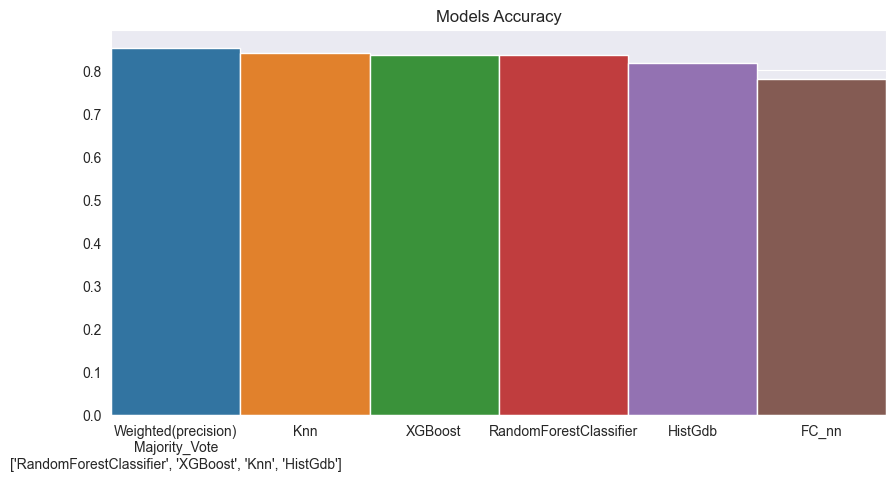

In [211]:
for t,model in enumerate(pipelines_and_scores.keys()):
    if t==0:
        models_accuracy=pd.DataFrame({model:[pipelines_and_scores[model][-1]['accuracy'][0]]})
    else:
        models_accuracy[model]=pipelines_and_scores[model][-1]['accuracy'][0]
plt.figure(figsize=(10,5))
sns.barplot(data=models_accuracy.T.sort_values([0],ascending=False).T,width=1)
plt.title("Models Accuracy")

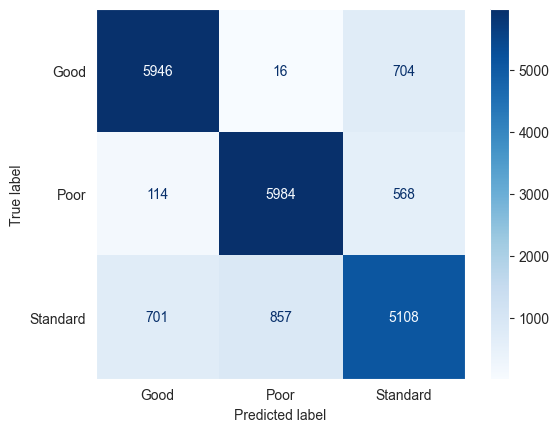

In [212]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

y=y_test.replace(num_to_obj_dict['Credit_Score'])
y_p=pd.DataFrame(weighted_pre).replace(num_to_obj_dict['Credit_Score'])
conf_metrix=confusion_matrix(y,y_p)
con=ConfusionMatrixDisplay(conf_metrix, display_labels=['Good','Poor','Standard'])
con=con.plot(cmap=plt.cm.Blues,values_format='g')
plt.grid(False)

In [375]:
for algo in pipelines_and_scores.keys():
    print(f'{algo} report:\n{pipelines_and_scores[algo][-1].T}\n\n')

RandomForestClassifier report:
              precision    recall  f1-score       support
1              0.857936  0.862464  0.860194   6631.000000
2              0.774527  0.766024  0.770252   6740.000000
3              0.872337  0.877471  0.874897   6627.000000
accuracy       0.834933  0.834933  0.834933      0.834933
macro avg      0.834933  0.835320  0.835114  19998.000000
weighted avg   0.834597  0.834933  0.834753  19998.000000


HistGdb report:
              precision    recall  f1-score       support
1              0.883138  0.833735  0.857726   7061.000000
2              0.719622  0.766539  0.742340   6258.000000
3              0.851935  0.850277  0.851105   6679.000000
accuracy       0.818232  0.818232  0.818232      0.818232
macro avg      0.818232  0.816850  0.817057  19998.000000
weighted avg   0.821548  0.818232  0.819407  19998.000000


Knn report:
              precision    recall  f1-score       support
1              0.898440  0.867468  0.882682   6904.000000
2        

Adjust new data for prediction.

In [376]:
test_path = r'test.csv'
test_df = pd.read_csv(test_path)

In [377]:
obj_to_num_dict['Month'].update({'September':9, 'October':10, 'November':11, 'December':12})
def test_data_adjust(new_data):

    if not isinstance(new_data,(pd.DataFrame,pd.Series)):
        raise TypeError(f'{type(new_data)} is not valid. valid classes: {pd.DataFrame} or {pd.Series}')
    new_data.drop(['ID','Name','SSN','Customer_ID'],axis=1,inplace=True)

    set_numeric_columns(features=mix_type_num_col,df=new_data)
    replace_invalid_2_nan(new_data)
    new_data['Credit_History_Age']=convert_str_num('Credit_History_Age',[0,3],[12,1],df=new_data)
    new_data.Type_of_Loan=new_data.Type_of_Loan.str.replace('and','')
    new_data=convert_loans_type(df=new_data)

    for item in list(obj_to_num_dict.items())[:-1]:
        new_data[item[0]]=new_data[item[0]].replace(item[1])
        new_data.dropna(inplace=True)

    return new_data

test_df=test_data_adjust(test_df)

100%|██████████| 9/9 [00:00<00:00, 12.25it/s]


In [384]:
test_predict=majority_vote(data=test_df,pipe_dict=pipelines_and_scores,weights=True,estimators=['RandomForestClassifier','Knn','HistGdb'])
test_predict=pd.DataFrame(test_predict).replace(num_to_obj_dict['Credit_Score'])
test_predict.head()

,0
0,Good
1,Good
2,Good
3,Good
4,Good


P.S. I think that banks check the customer's history four months back->if that is the case soo the right way to solve that problem is to build a recurrent model e.g. RNN|LSTM|GRO -> many(4) to one.